# Hypothesis 2: Infants are expected to demonstrate varying exploration patterns based on prior successes and errors
- Following successful trials, infants may shorten their exploration durations. In response to errors, they may exhibit prolonged gaze durations on the images. 
- After experiencing errors, they may demonstrate heightened eye-switching behaviour as they attempt to optimize their performance.


## Dataset

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import shapiro, levene, kruskal, sem, f_oneway
from sklearn.utils import resample
import random
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.preprocessing import StandardScaler
from scipy.stats import kruskal, spearmanr
from sklearn.model_selection import LeaveOneOut
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import QuantileTransformer
#import pymc as pm
#import arviz as az

In [2]:
#Read the dataset and drop NaN values

#Read the dataset and drop NaN values

dataset = 'data_thesis.csv'
data_original = pd.read_csv(dataset)
data_original.drop(data_original[data_original['period_in_trial'] == 'feedback'].index, inplace=True)
data_original.drop(data_original[data_original['accuracy'] == 0.5].index, inplace=True)
data_original.drop(data_original[data_original['sideMatch'] == 'timedout'].index, inplace=True)

data_original['durLookBottom'] = data_original['LookTotDurInL'] + data_original['LookTotDurInR'] #New variable: durLookBottom

data_original['FixNbInBottom'] = data_original['FixNbInL'] + data_original['FixNbInR'] #New variable: FixNbInBottom

data_original['durfixBottom'] = data_original['FixTotDurInL'] + data_original['FixTotDurInR'] #New variable: durFixBottom

data_original

,session,trialno,difficulty,accuracy,period_in_trial,step_reached,durPeriodTotal,FixNb,FixNbInL,FixNbInR,...,objL,objR,objT,sideChosen,sideMatch,timePeriodStarts,timePeriodEnds,durLookBottom,FixNbInBottom,durfixBottom
0,curE002a,8,Easy,0.0,exploration,3,11270,20,13,5,...,V-1-G-1.png,F-4-E-1.png,F-4-E-1.png,left,right,1962.0,13230.0,5480,18,4952
1,curE002a,8,Easy,0.0,decision,3,924,2,1,0,...,V-1-G-1.png,F-4-E-1.png,F-4-E-1.png,left,right,13232.0,14154.0,536,1,536
3,curE002a,9,Easy,1.0,exploration,3,2498,6,3,2,...,F-1-A-3.png,V-2-H-2.png,F-1-A-3.png,left,left,2024.0,4520.0,1670,5,1468
4,curE002a,9,Easy,1.0,decision,3,2182,4,1,0,...,F-1-A-3.png,V-2-H-2.png,F-1-A-3.png,left,left,4522.0,6702.0,530,1,470
6,curE002a,10,Easy,1.0,exploration,3,9912,11,3,5,...,F-4-E-1.png,V-1-G-1.png,V-1-G-1.png,right,right,2046.0,11956.0,2658,8,2546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5862,curE125a,27,Easy,0.0,decision,2,10032,24,0,0,...,O-3-H-1.png,F-2-G-4.png,F-2-G-4.png,left,right,7242.0,12338.0,0,0,0
5871,curE125a,33,Easy,1.0,exploration,2,18792,34,22,9,...,F-3-G-4.png,A-1-I-4.png,F-3-G-4.png,left,left,9560.0,15572.0,12008,31,11146
5872,curE125a,33,Easy,1.0,decision,2,10040,11,0,0,...,F-3-G-4.png,A-1-I-4.png,F-3-G-4.png,left,left,15574.0,19054.0,0,0,0
5877,curE125a,39,Easy,0.0,exploration,2,5248,10,4,3,...,O-3-H-1.png,F-2-G-4.png,O-3-H-1.png,right,left,1276.0,3602.0,3042,7,2826


In [3]:
# Filter out participants that completed 10 or less trials

trial_counts_per_session = data_original.groupby('session')['trialno'].nunique()

trial_counts_df = trial_counts_per_session.reset_index(name='unique_trial_count')

data_original = data_original[data_original['session'].isin(trial_counts_df[trial_counts_df['unique_trial_count'] > 10]['session'])]

data_original

,session,trialno,difficulty,accuracy,period_in_trial,step_reached,durPeriodTotal,FixNb,FixNbInL,FixNbInR,...,objL,objR,objT,sideChosen,sideMatch,timePeriodStarts,timePeriodEnds,durLookBottom,FixNbInBottom,durfixBottom
0,curE002a,8,Easy,0.0,exploration,3,11270,20,13,5,...,V-1-G-1.png,F-4-E-1.png,F-4-E-1.png,left,right,1962.0,13230.0,5480,18,4952
1,curE002a,8,Easy,0.0,decision,3,924,2,1,0,...,V-1-G-1.png,F-4-E-1.png,F-4-E-1.png,left,right,13232.0,14154.0,536,1,536
3,curE002a,9,Easy,1.0,exploration,3,2498,6,3,2,...,F-1-A-3.png,V-2-H-2.png,F-1-A-3.png,left,left,2024.0,4520.0,1670,5,1468
4,curE002a,9,Easy,1.0,decision,3,2182,4,1,0,...,F-1-A-3.png,V-2-H-2.png,F-1-A-3.png,left,left,4522.0,6702.0,530,1,470
6,curE002a,10,Easy,1.0,exploration,3,9912,11,3,5,...,F-4-E-1.png,V-1-G-1.png,V-1-G-1.png,right,right,2046.0,11956.0,2658,8,2546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5787,curE122a,43,Hard,0.0,exploration,1,20008,20,20,0,...,O-2-J-1.png,O-2-G-4.png,O-2-G-4.png,left,right,4456.0,7984.0,5162,20,3806
5788,curE122a,45,Medium,1.0,exploration,3,3530,2,0,1,...,O-3-B-4.png,O-1-D-2.png,O-3-B-4.png,left,left,1650.0,3980.0,114,1,114
5790,curE122a,46,Medium,0.0,decision,3,1716,5,2,0,...,V-4-G-3.png,V-1-A-4.png,V-1-A-4.png,left,right,20952.0,23084.0,464,2,434
5791,curE122a,48,Medium,0.0,exploration,3,2332,2,1,0,...,V-2-B-3.png,V-3-H-3.png,V-3-H-3.png,left,right,1488.0,17710.0,596,1,596


In [4]:
# DF DATA PER TRIAL

# Exploration period duration
exploration_df = data_original[data_original['period_in_trial'] == 'exploration']
durExplorationTotal_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()
durExplorationTotal_df.rename(columns={'durPeriodTotal': 'durExplorationPeriod'}, inplace=True)                                              

# Decision period duration
decision_df = data_original[data_original['period_in_trial'] == 'decision']
durDecisionTotal_df = decision_df.groupby(['session', 'trialno', 'difficulty']) ['durPeriodTotal'].sum().reset_index()
durDecisionTotal_df.rename(columns={'durPeriodTotal': 'durDecisionPeriod'}, inplace=True)

# Trial duration
trialduration_df = data_original.groupby(['session', 'trialno', 'difficulty'])['durPeriodTotal'].sum().reset_index()

# Accuracy
decision_df = data_original[data_original['period_in_trial'] == 'decision']
accuracy_df = decision_df.groupby(['session', 'trialno', 'difficulty']) ['accuracy'].sum().reset_index()

# Side Chosen
decision_df = data_original[data_original['period_in_trial'] == 'decision']
sideChosen_df = decision_df.groupby(['session', 'trialno', 'difficulty']) ['sideChosen'].sum().reset_index()

#Number of switches during exploration period
exploration_df = data_original[data_original['period_in_trial'] == 'exploration']
SwitchesExploration_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['NbSwitches'].sum().reset_index()
SwitchesExploration_df.rename(columns={'NbSwitches': 'SwitchesExplorationPeriod'}, inplace=True)   

#Number of switches during decision period
decision_df = data_original[data_original['period_in_trial'] == 'decision']
SwitchesDecision_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['NbSwitches'].sum().reset_index()
SwitchesDecision_df.rename(columns={'NbSwitches': 'SwitchesDecisionPeriod'}, inplace=True)   

#Number of switches in total
SwitchesTotal_df = data_original.groupby(['session', 'trialno', 'difficulty'])['NbSwitches'].sum().reset_index()

#Fixation number during exploration period
exploration_df = data_original[data_original['period_in_trial'] == 'exploration']
FixNbExploration_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['FixNb'].sum().reset_index()
FixNbExploration_df.rename(columns={'FixNb': 'FixNbExplorationPeriod'}, inplace=True)   

#Fixation number during decision period
decision_df = data_original[data_original['period_in_trial'] == 'decision']
FixNbDecision_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['FixNb'].sum().reset_index()
FixNbDecision_df.rename(columns={'FixNb': 'FixNbDecisionPeriod'}, inplace=True)   

#Fixation number in total
FixNbTotal_df = data_original.groupby(['session', 'trialno', 'difficulty'])['FixNb'].sum().reset_index()

#Fixation number in top card during decision period
decision_df = data_original[data_original['period_in_trial'] == 'decision']
FixNbTD_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['FixNbInT'].sum().reset_index()
FixNbTD_df.rename(columns={'FixNbInT': 'FixNbInTDecision'}, inplace=True)   

#Fixation number in top card during exploration period
exploration_df = data_original[data_original['period_in_trial'] == 'exploration']
FixNbTE_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['FixNbInT'].sum().reset_index()
FixNbTE_df.rename(columns={'FixNbInT': 'FixNbInTExploration'}, inplace=True) 

#Fixation number in Bottom cards during exploration period
exploration_df = data_original[data_original['period_in_trial'] == 'exploration']
FixNbBottom_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['FixNbInBottom'].sum().reset_index()
FixNbBottom_df.rename(columns={'FixNbInBottom': 'FixNbInBottomExploration'}, inplace=True)

#Fixation number in Bottom during both periods
FixNbBottomTotal_df = data_original.groupby(['session', 'trialno', 'difficulty'])['FixNbInBottom'].sum().reset_index()

#Fixation number in Top during both periods
FixNbInTTotal_df = data_original.groupby(['session', 'trialno', 'difficulty'])['FixNbInT'].sum().reset_index()

# Look total duration in top card during decision period
decision_df = data_original[data_original['period_in_trial'] == 'decision']
LookDurTDecision_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['LookTotDurInT'].sum().reset_index()
LookDurTDecision_df.rename(columns={'LookTotDurInT': 'LookDurInTDecision'}, inplace=True)   

# Look total duration in top card during exploration period
exploration_df = data_original[data_original['period_in_trial'] == 'decision']
LookDurTExploration_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['LookTotDurInT'].sum().reset_index()
LookDurTExploration_df.rename(columns={'LookTotDurInT': 'LookDurInTExploration'}, inplace=True)  

# Look total duration in bottom cards during exploration period
exploration_df = data_original[data_original['period_in_trial'] == 'exploration']
LookDurBE_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()
LookDurBE_df.rename(columns={'durLookBottom': 'durLookBottomExploration'}, inplace=True)

# Look total duration in bottom cards during decision period
decision_df = data_original[data_original['period_in_trial'] == 'decision']
LookDurBD_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()
LookDurBD_df.rename(columns={'durLookBottom': 'durLookBottomDecision'}, inplace=True)

# Look total duration in Bottom cards during both periods
LookDurBottomTotal_df = data_original.groupby(['session', 'trialno', 'difficulty'])['durLookBottom'].sum().reset_index()

# Look total duration in Top Card during both periods
LookDurTopTotal_df = data_original.groupby(['session', 'trialno', 'difficulty'])['LookTotDurInT'].sum().reset_index()

# Fixation duration of top card during decision period
decision_df = data_original[data_original['period_in_trial'] == 'decision']
FixDurTDecision_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['FixTotDurInT'].sum().reset_index()
FixDurTDecision_df.rename(columns={'FixTotDurInT': 'FixDurInTDecision'}, inplace=True)   

# Fixation duration of top card during exploration period
exploration_df = data_original[data_original['period_in_trial'] == 'decision']
FixDurTExploration_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['FixTotDurInT'].sum().reset_index()
FixDurTExploration_df.rename(columns={'FixTotDurInT': 'FixDurInTExploration'}, inplace=True)  

# Fixation duration of bottom cards during exploration period
exploration_df = data_original[data_original['period_in_trial'] == 'exploration']
FixDurBE_df = exploration_df.groupby(['session', 'trialno', 'difficulty'])['durfixBottom'].sum().reset_index()
FixDurBE_df.rename(columns={'durfixBottom': 'durfixBottomExploration'}, inplace=True)

# Fixation duration of bottom cards during decision period
decision_df = data_original[data_original['period_in_trial'] == 'decision']
FixDurBD_df = decision_df.groupby(['session', 'trialno', 'difficulty'])['durfixBottom'].sum().reset_index()
FixDurBD_df.rename(columns={'durfixBottom': 'durfixBottomDecision'}, inplace=True)

# Fixation duration of Bottom cards during both periods
FixDurBottomTotal_df = data_original.groupby(['session', 'trialno', 'difficulty'])['durfixBottom'].sum().reset_index()

# Fixation duration of Top card during both periods
FixDurTopTotal_df = data_original.groupby(['session', 'trialno', 'difficulty'])['FixTotDurInT'].sum().reset_index()

merged_filtered_data = accuracy_df.merge(sideChosen_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.merge(trialduration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(durExplorationTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(durDecisionTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.merge(SwitchesTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(SwitchesExploration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(SwitchesDecision_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.merge(FixNbExploration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbDecision_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbTE_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbTD_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbBottom_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbBottomTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixNbInTTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data = merged_filtered_data.merge(LookDurTDecision_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurTExploration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurBE_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurBD_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurBottomTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(LookDurTopTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')


merged_filtered_data = merged_filtered_data.merge(FixDurTDecision_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurTExploration_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurBE_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurBD_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurBottomTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')
merged_filtered_data = merged_filtered_data.merge(FixDurTopTotal_df, on=['session', 'trialno', 'difficulty'], how='outer')

merged_filtered_data

,session,trialno,difficulty,accuracy,sideChosen,durPeriodTotal,durExplorationPeriod,durDecisionPeriod,NbSwitches,SwitchesExplorationPeriod,...,durLookBottomExploration,durLookBottomDecision,durLookBottom,LookTotDurInT,FixDurInTDecision,FixDurInTExploration,durfixBottomExploration,durfixBottomDecision,durfixBottom,FixTotDurInT
0,curE002a,8,Easy,0.0,left,12194,11270.0,924.0,6,6.0,...,5480.0,536.0,6016,1208,298.0,298.0,4952.0,536.0,5488,1148
1,curE002a,9,Easy,1.0,left,4680,2498.0,2182.0,2,2.0,...,1670.0,530.0,2200,2176,1466.0,1466.0,1468.0,470.0,1938,1942
2,curE002a,10,Easy,1.0,right,12826,9912.0,2914.0,4,3.0,...,2658.0,106.0,2764,2020,798.0,798.0,2546.0,364.0,2910,1774
3,curE002a,11,Medium,1.0,right,3910,2328.0,1582.0,3,2.0,...,994.0,470.0,1464,1780,646.0,646.0,960.0,420.0,1380,1540
4,curE002a,12,Medium,0.0,left,15256,14272.0,984.0,6,5.0,...,7554.0,476.0,8030,1296,406.0,406.0,7048.0,476.0,7524,1210
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1469,curE121a,10,Easy,NaN,NaN,6080,6080.0,NaN,2,2.0,...,888.0,NaN,888,850,NaN,NaN,776.0,NaN,776,762
1470,curE122a,31,Hard,NaN,NaN,8562,8562.0,NaN,2,2.0,...,2684.0,NaN,2684,0,NaN,NaN,2462.0,NaN,2462,0
1471,curE122a,32,Hard,NaN,NaN,9978,9978.0,NaN,4,4.0,...,4332.0,NaN,4332,222,NaN,NaN,3900.0,NaN,3900,222
1472,curE122a,43,Hard,NaN,NaN,20008,20008.0,NaN,1,1.0,...,5162.0,NaN,5162,0,NaN,NaN,3806.0,NaN,3806,0


In [5]:
filtered_data = merged_filtered_data.dropna() 
filtered_data

filtered_data.sort_values(by=['session', 'trialno'], inplace=True)

mask = (
    (filtered_data['trialno'].shift(1) == filtered_data['trialno'] - 1) |  # Check if the trialno is preceded by the previous trialno
    (filtered_data['trialno'].shift(-1) == filtered_data['trialno'] + 1) | # Check if the trialno is followed by a consecutive trialno
    (filtered_data['trialno'].shift(1).isna()) |               # Check if the trialno has no previous trialno
    (filtered_data['trialno'].shift(-1).isna())                # Check if the trialno has no following trialno
)

data = filtered_data[mask]

data['prior_accuracy'] = data.groupby('session')['accuracy'].shift(1)

data.loc[~(data['trialno'] - 1 == data['trialno'].shift(1)), 'prior_accuracy'] = float('NaN')

data.reset_index(drop=True, inplace=True)

data = data.drop(data.index[-1])

data.dropna()

data

C:\Users\I587504\AppData\Local\Temp\ipykernel_54240\2152101172.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data.sort_values(by=['session', 'trialno'], inplace=True)
C:\Users\I587504\AppData\Local\Temp\ipykernel_54240\2152101172.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['prior_accuracy'] = data.groupby('session')['accuracy'].shift(1)


,session,trialno,difficulty,accuracy,sideChosen,durPeriodTotal,durExplorationPeriod,durDecisionPeriod,NbSwitches,SwitchesExplorationPeriod,...,durLookBottomDecision,durLookBottom,LookTotDurInT,FixDurInTDecision,FixDurInTExploration,durfixBottomExploration,durfixBottomDecision,durfixBottom,FixTotDurInT,prior_accuracy
0,curE002a,8,Easy,0.0,left,12194,11270.0,924.0,6,6.0,...,536.0,6016,1208,298.0,298.0,4952.0,536.0,5488,1148,NaN
1,curE002a,9,Easy,1.0,left,4680,2498.0,2182.0,2,2.0,...,530.0,2200,2176,1466.0,1466.0,1468.0,470.0,1938,1942,0.0
2,curE002a,10,Easy,1.0,right,12826,9912.0,2914.0,4,3.0,...,106.0,2764,2020,798.0,798.0,2546.0,364.0,2910,1774,1.0
3,curE002a,11,Medium,1.0,right,3910,2328.0,1582.0,3,2.0,...,470.0,1464,1780,646.0,646.0,960.0,420.0,1380,1540,1.0
4,curE002a,12,Medium,0.0,left,15256,14272.0,984.0,6,5.0,...,476.0,8030,1296,406.0,406.0,7048.0,476.0,7524,1210,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
949,curE122a,16,Easy,0.0,left,7378,6080.0,1298.0,1,1.0,...,270.0,4430,1974,592.0,592.0,3844.0,410.0,4254,1866,1.0
950,curE122a,25,Easy,1.0,left,11112,2714.0,8398.0,1,1.0,...,166.0,886,4450,3158.0,3158.0,662.0,104.0,766,4000,NaN
951,curE122a,26,Medium,0.0,left,2944,2378.0,566.0,2,1.0,...,142.0,1302,570,0.0,0.0,1132.0,142.0,1274,500,1.0
952,curE122a,27,Medium,1.0,left,14690,13092.0,1598.0,2,2.0,...,394.0,9792,1484,876.0,876.0,8682.0,308.0,8990,1244,0.0


## Features + Prior Accuracy Analysis

### Acuracy vs. Prior Accuracy

Shapiro-Wilk test for 0.0: p-value = 4.40920146754944e-25
Shapiro-Wilk test for 1.0: p-value = 2.5929376691199827e-27
Levene's test for homogeneity of variances: p-value = 0.13203118187423726
Kruskal-Wallis test:
H-statistic: 2.2696886632710593
p-value: 0.13192640266504493
Mean Accuracy by Prior Accuracy:
prior_accuracy
0.0    0.567657
1.0    0.509434
Name: accuracy, dtype: float64
Median Accuracy by Prior Accuracy:
prior_accuracy
0.0    1.0
1.0    1.0
Name: accuracy, dtype: float64
SEM Accuracy by Prior Accuracy:
prior_accuracy
0.0    0.028507
1.0    0.025989
Name: accuracy, dtype: float64


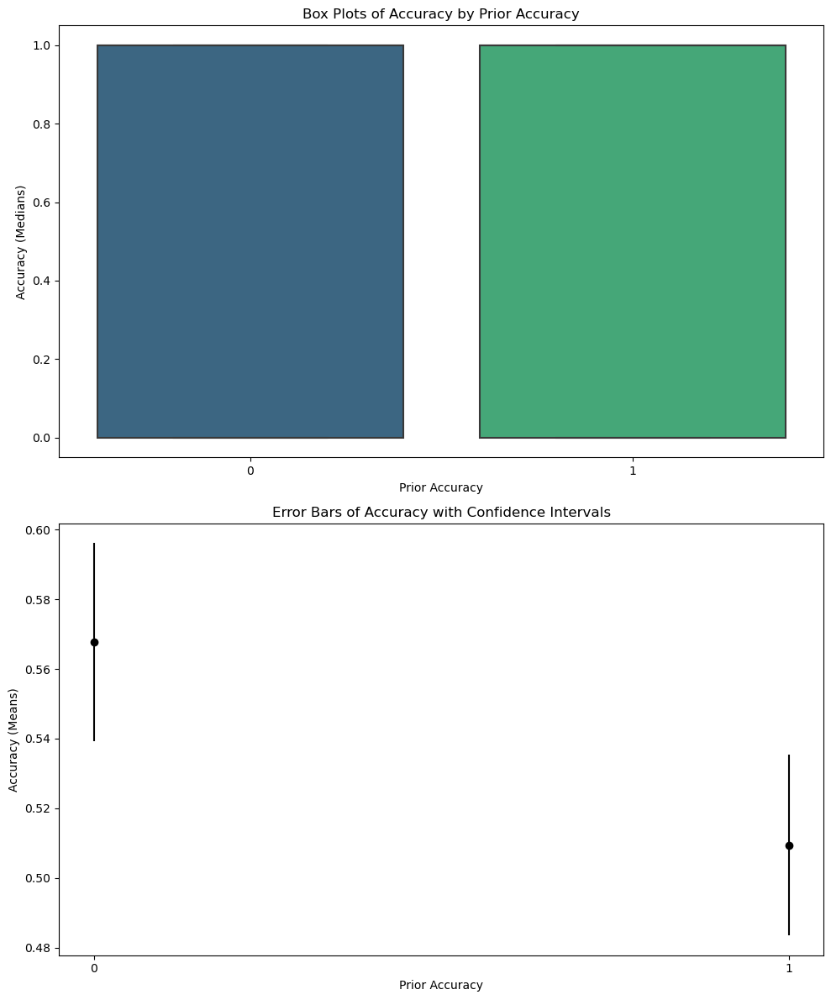

In [14]:
# Accuracy by prior accuracy 

accuracy_by_prior_accuracy = [data[data['prior_accuracy'] == level]['accuracy'] for level in data['prior_accuracy'].unique()]
accuracy_by_prior_accuracy = [group.dropna() for group in accuracy_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['accuracy']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*accuracy_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*accuracy_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of Accuracy by accuracy
mean_accuracy_by_prior_accuracy = data.groupby('prior_accuracy')['accuracy'].mean()
sem_accuracy_by_prior_accuracy = data.groupby('prior_accuracy')['accuracy'].sem()
median_accuracy_by_prior_accuracy = data.groupby('prior_accuracy')['accuracy'].median()
print("Mean Accuracy by Prior Accuracy:")
print(mean_accuracy_by_prior_accuracy)
print("Median Accuracy by Prior Accuracy:")
print(median_accuracy_by_prior_accuracy)
print("SEM Accuracy by Prior Accuracy:")
print(sem_accuracy_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='accuracy', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('Accuracy (Medians)')
ax1.set_title('Box Plots of Accuracy by Prior Accuracy')
ax1.set_xticklabels(['0', '1'])  

ax2.errorbar(np.arange(len(mean_accuracy_by_prior_accuracy)), mean_accuracy_by_prior_accuracy, yerr=sem_accuracy_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Accuracy (Means)')
ax2.set_title('Error Bars of Accuracy with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_accuracy_by_prior_accuracy)))
ax2.set_xticklabels(mean_accuracy_by_prior_accuracy.index)
ax2.set_xticklabels(['0', '1']) 

plt.tight_layout()
plt.show()

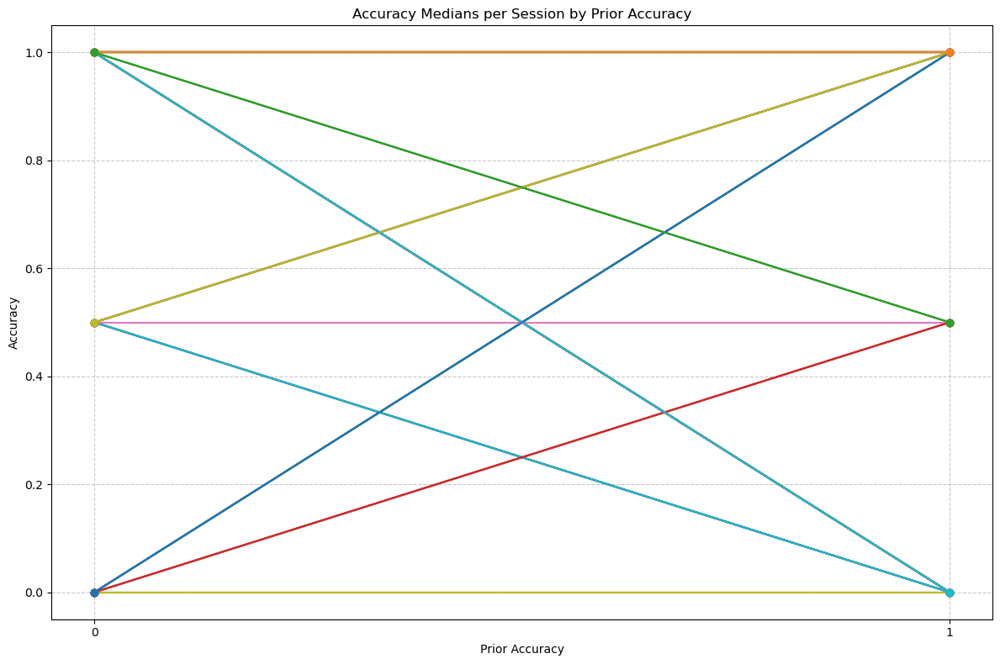

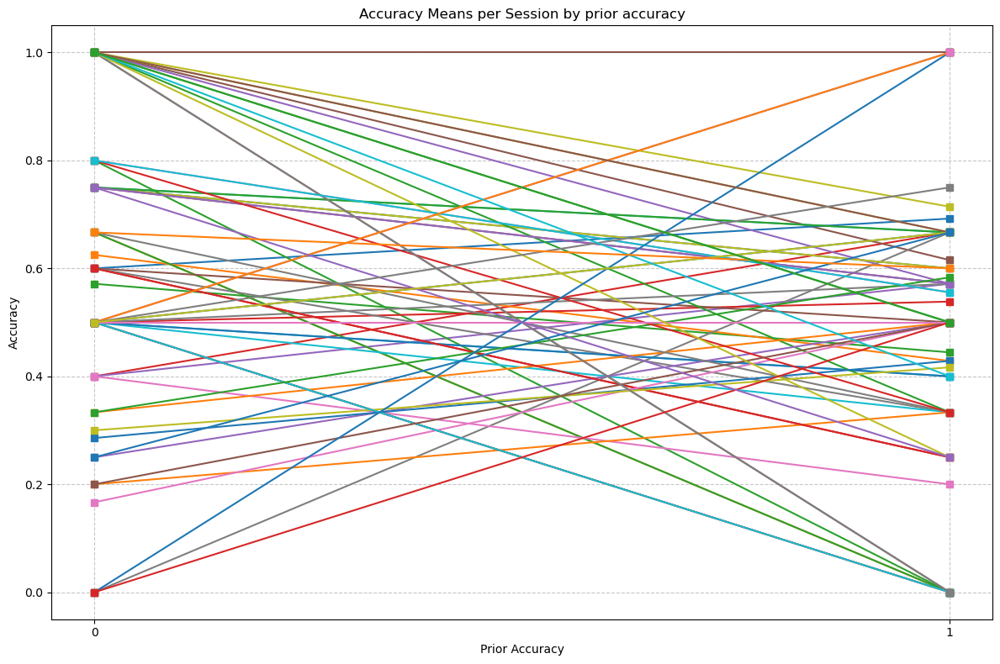

In [18]:
# Accuracy by prior accuracy per session

#Medians
session_accuracy = data.groupby(['session', 'prior_accuracy'])['accuracy'].median().unstack()

sessions = data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_prior_accuracy = session_accuracy.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        median_accuracy_session = session_accuracy.loc[session][available_prior_accuracy]
        plt.plot(median_accuracy_session.index, median_accuracy_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Accuracy Medians per Session by Prior Accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('Accuracy')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(np.arange(len(mean_accuracy_by_prior_accuracy)))
plt.tight_layout()
#plt.legend()
plt.show()

session_accuracy_mean = data.groupby(['session', 'prior_accuracy'])['accuracy'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_prior_accuracy = session_accuracy_mean.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        mean_accuracy_session = session_accuracy_mean.loc[session][available_prior_accuracy]
        plt.plot(mean_accuracy_session.index, mean_accuracy_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Accuracy Means per Session by prior accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('Accuracy')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(np.arange(len(mean_accuracy_by_prior_accuracy)))
#plt.legend()
plt.tight_layout()
plt.show()

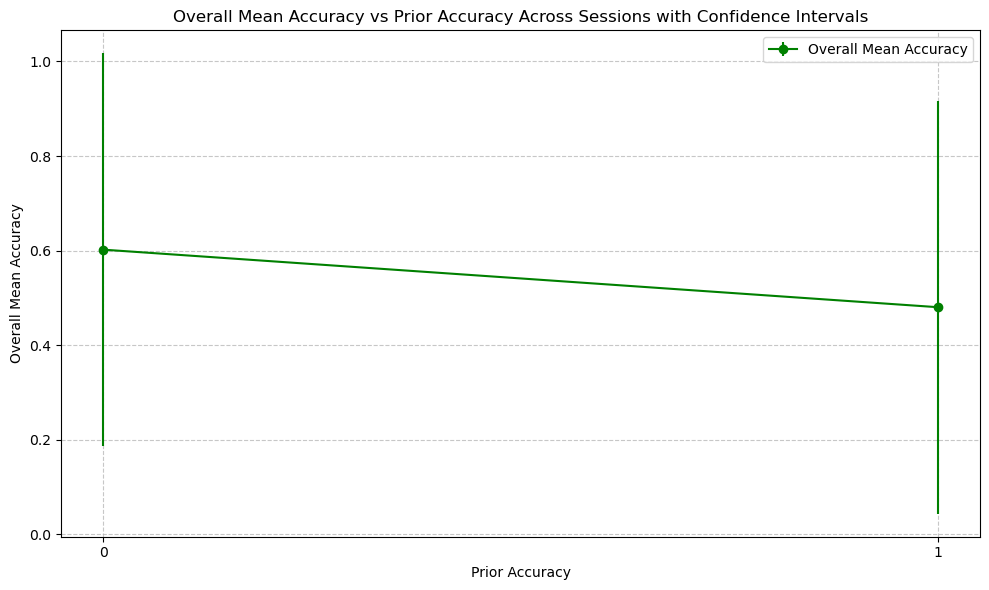

Overall Mean Accuracy per Prior Accuracy Across Sessions:
prior_accuracy
0.0    0.601972
1.0    0.480194
dtype: float64


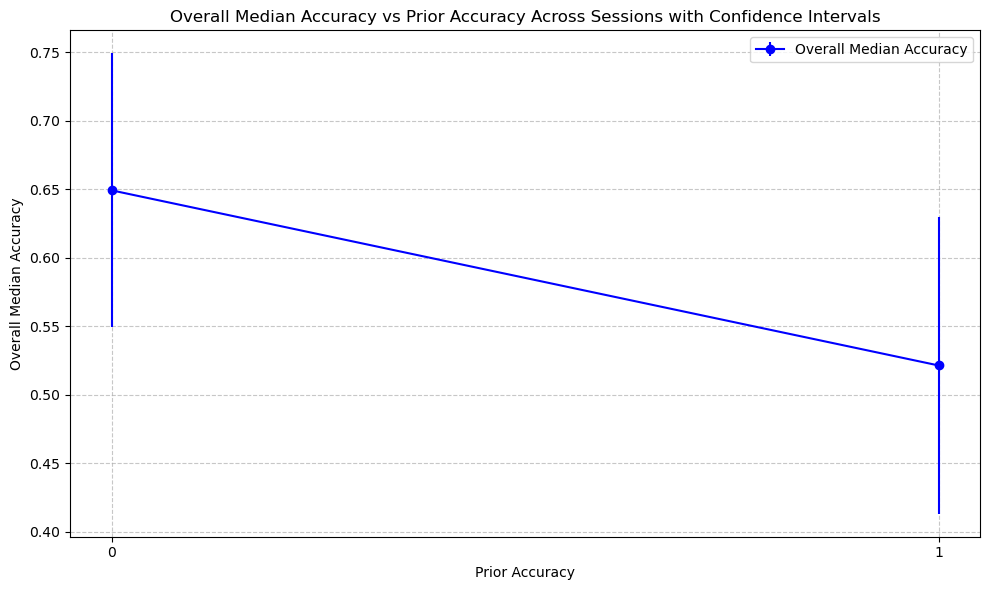


Overall Median Accuracy per Prior Accuracy Across Sessions:
prior_accuracy
0.0    0.649254
1.0    0.521429
dtype: float64


In [19]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_accuracy = data.groupby(['session', 'prior_accuracy'])['accuracy'].mean().unstack()
session_median_accuracy = data.groupby(['session', 'prior_accuracy'])['accuracy'].median().unstack()

overall_mean_accuracy = session_mean_accuracy.mean()
overall_median_accuracy = session_median_accuracy.mean()

session_std_accuracy = data.groupby(['session', 'prior_accuracy'])['accuracy'].std().unstack()
session_count_accuracy = data.groupby(['session', 'prior_accuracy'])['accuracy'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_accuracy.mean() / np.sqrt(session_count_accuracy.mean())

overall_conf_interval_median = 1.96 * session_median_accuracy.std() / np.sqrt(session_median_accuracy.count())

# Mean accuracy across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_accuracy.index, overall_mean_accuracy.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Accuracy')
plt.title('Overall Mean Accuracy vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Mean Accuracy')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(np.arange(len(mean_accuracy_by_prior_accuracy)))
plt.tight_layout()
plt.show()

print("Overall Mean Accuracy per Prior Accuracy Across Sessions:")
print(overall_mean_accuracy)

# Median accuracy across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_accuracy.index, overall_median_accuracy.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Accuracy')
plt.title('Overall Median Accuracy vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Median Accuracy')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(np.arange(len(mean_accuracy_by_prior_accuracy)))
plt.tight_layout()
plt.show()

print("\nOverall Median Accuracy per Prior Accuracy Across Sessions:")
print(overall_median_accuracy)

### Total Trial Duration vs. Prior Accuracy

Shapiro-Wilk test for 0.0: p-value = 1.8645524127363416e-14
Shapiro-Wilk test for 1.0: p-value = 1.2807660463909865e-17
Levene's test for homogeneity of variances: p-value = 0.5773647929818342
Kruskal-Wallis test:
H-statistic: 1.7923349642994975
p-value: 0.18064192946384877
Mean Total Trial duration by Prior Accuracy:
prior_accuracy
0.0    8989.636964
1.0    8528.048518
Name: durPeriodTotal, dtype: float64
Median Total Trial duration by Prior Accuracy:
prior_accuracy
0.0    7312.0
1.0    6798.0
Name: durPeriodTotal, dtype: float64
SEM Total Trial Duration by Prior Accuracy:
prior_accuracy
0.0    300.233314
1.0    265.946442
Name: durPeriodTotal, dtype: float64


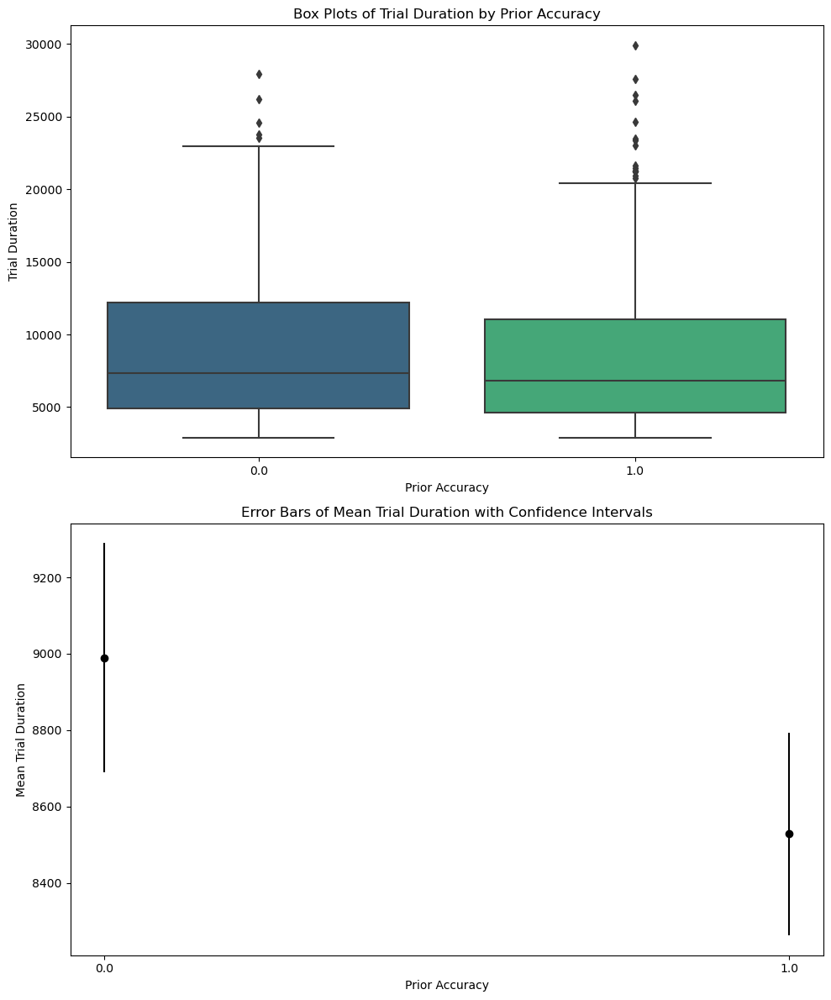

In [20]:
#Total trial duration vs. Prior Accuracy

durPeriodTotal_by_prior_accuracy = [data[data['prior_accuracy'] == level]['durPeriodTotal'] for level in data['prior_accuracy'].unique()]
durPeriodTotaln_by_prior_accuracy = [group.dropna() for group in durPeriodTotal_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['durPeriodTotal']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*durPeriodTotal_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*durPeriodTotal_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of total trial duration by accuracy
mean_trialduration_by_prior_accuracy = data.groupby('prior_accuracy')['durPeriodTotal'].mean()
median_trialduration_by_prior_accuracy = data.groupby('prior_accuracy')['durPeriodTotal'].median()
sem_trialduration_by_prior_accuracy = data.groupby('prior_accuracy')['durPeriodTotal'].sem()
print("Mean Total Trial duration by Prior Accuracy:")
print(mean_trialduration_by_prior_accuracy)
print("Median Total Trial duration by Prior Accuracy:")
print(median_trialduration_by_prior_accuracy)
print("SEM Total Trial Duration by Prior Accuracy:")
print(sem_trialduration_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='durPeriodTotal', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('Trial Duration')
ax1.set_title('Box Plots of Trial Duration by Prior Accuracy')

ax2.errorbar(np.arange(len(mean_trialduration_by_prior_accuracy)), mean_trialduration_by_prior_accuracy, yerr=sem_trialduration_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Mean Trial Duration')
ax2.set_title('Error Bars of Mean Trial Duration with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_trialduration_by_prior_accuracy)))
ax2.set_xticklabels(mean_trialduration_by_prior_accuracy.index)

plt.tight_layout()
plt.show()

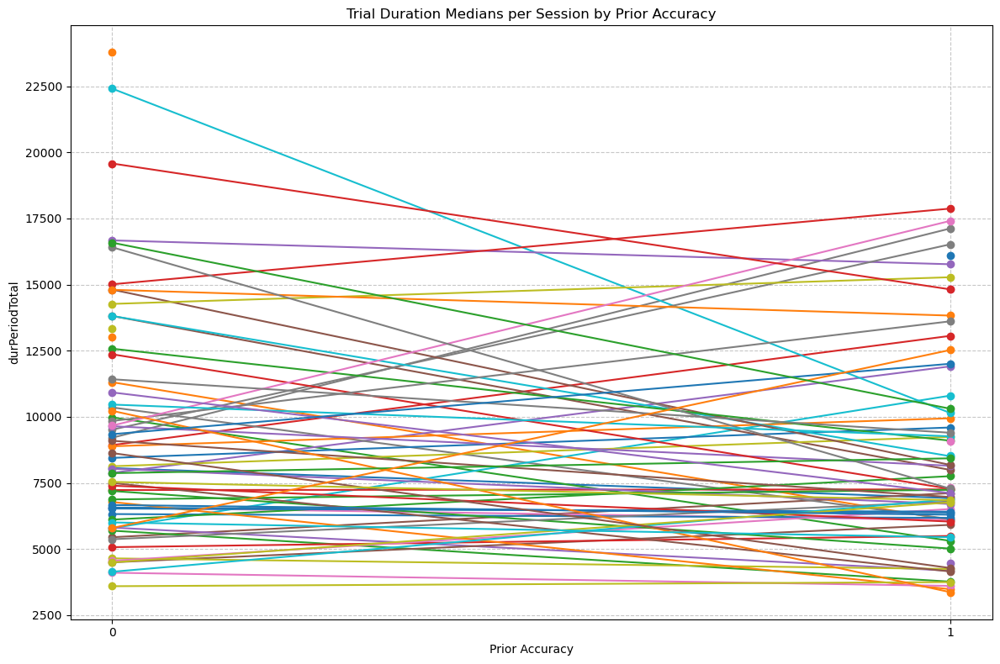

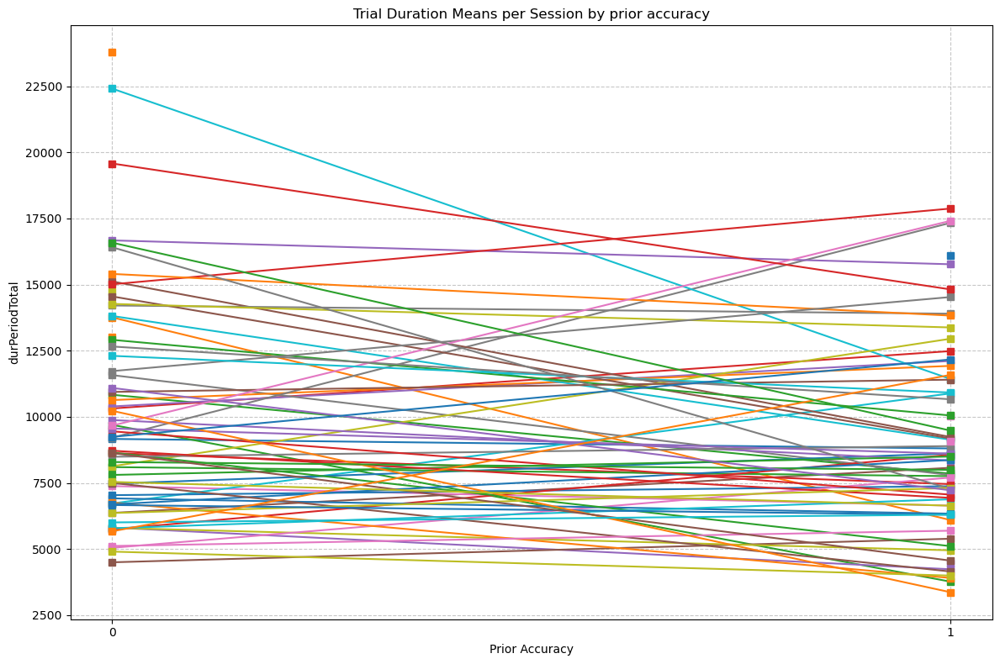

In [21]:
# Trial duration per session by prior accuracy per session

#Medians
session_dur_trial = data.groupby(['session', 'prior_accuracy'])['durPeriodTotal'].median().unstack()

sessions = data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_prior_accuracy = session_dur_trial.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        median_durtrial_session = session_dur_trial.loc[session][available_prior_accuracy]
        plt.plot(median_durtrial_session.index, median_durtrial_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Trial Duration Medians per Session by Prior Accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('durPeriodTotal')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
#plt.legend()
plt.show()

session_dur_trial_mean = data.groupby(['session', 'prior_accuracy'])['durPeriodTotal'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_prior_accuracy = session_dur_trial_mean.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        mean_durtrial_session = session_dur_trial_mean.loc[session][available_prior_accuracy]
        plt.plot(mean_durtrial_session.index, mean_durtrial_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Trial Duration Means per Session by prior accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('durPeriodTotal')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
#plt.legend()
plt.tight_layout()
plt.show()

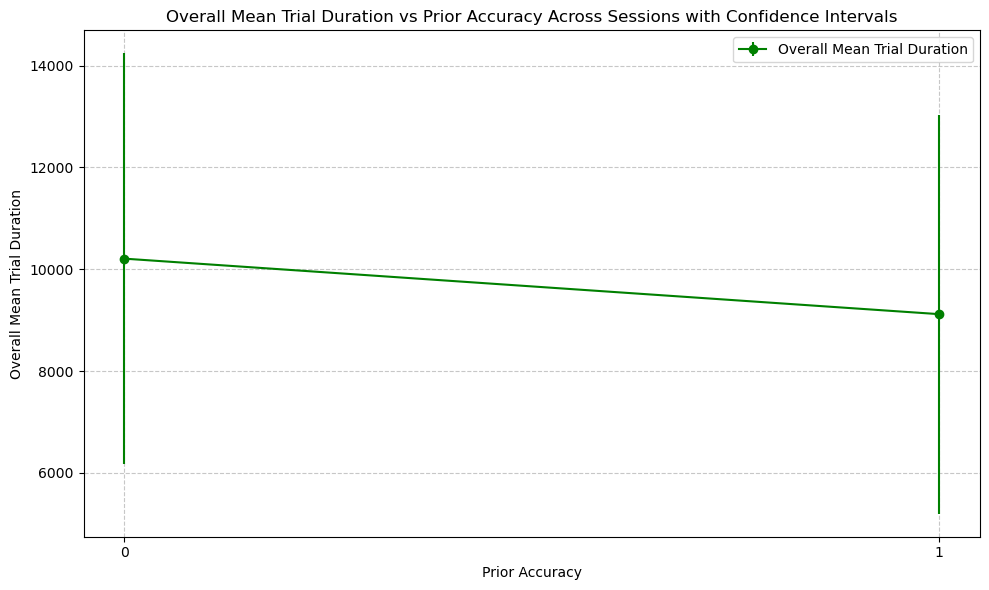

Overall Mean Trial Duration per Prior Accuracy Across Sessions:
prior_accuracy
0.0    0.601972
1.0    0.480194
dtype: float64


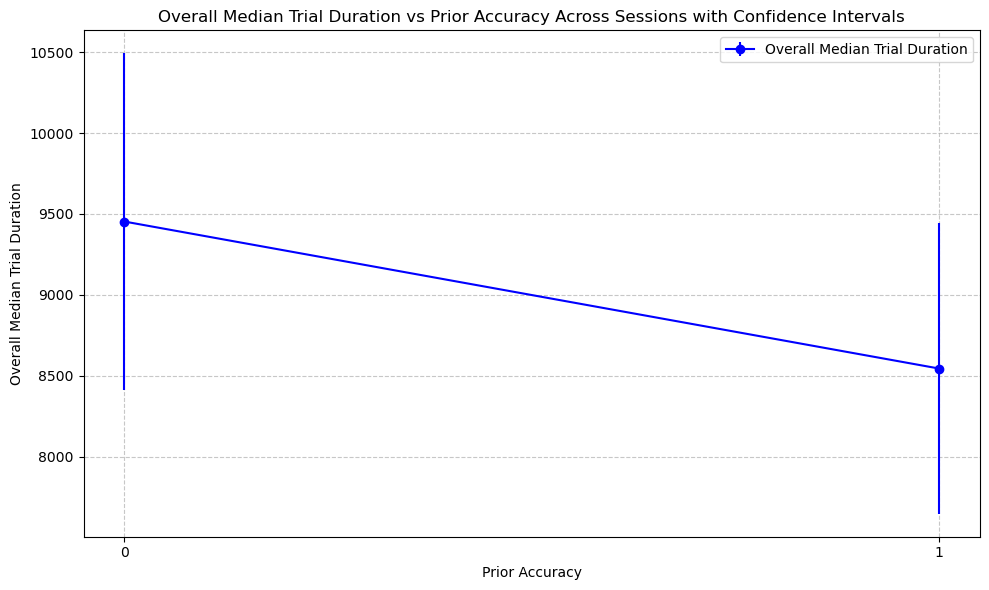


Overall Median Trial Duration per Prior Accuracy Across Sessions:
prior_accuracy
0.0    9453.313433
1.0    8544.942857
dtype: float64


In [26]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_durPeriodTotal = data.groupby(['session', 'prior_accuracy'])['durPeriodTotal'].mean().unstack()
session_median_durPeriodTotal = data.groupby(['session', 'prior_accuracy'])['durPeriodTotal'].median().unstack()

overall_mean_durPeriodTotal = session_mean_durPeriodTotal.mean()
overall_median_durPeriodTotal = session_median_durPeriodTotal.mean()

session_std_durPeriodTotal = data.groupby(['session', 'prior_accuracy'])['durPeriodTotal'].std().unstack()
session_count_durPeriodTotal = data.groupby(['session', 'prior_accuracy'])['durPeriodTotal'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_durPeriodTotal.mean() / np.sqrt(session_count_durPeriodTotal.mean())

overall_conf_interval_median = 1.96 * session_median_durPeriodTotal.std() / np.sqrt(session_median_durPeriodTotal.count())

# Mean trial duration across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_durPeriodTotal.index, overall_mean_durPeriodTotal.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Trial Duration')
plt.title('Overall Mean Trial Duration vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Mean Trial Duration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("Overall Mean Trial Duration per Prior Accuracy Across Sessions:")
print(overall_mean_accuracy)

# Median trial duration across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_durPeriodTotal.index, overall_median_durPeriodTotal.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Trial Duration')
plt.title('Overall Median Trial Duration vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Median Trial Duration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("\nOverall Median Trial Duration per Prior Accuracy Across Sessions:")
print(overall_median_durPeriodTotal)

### Duration of Exploration and Decision Periods vs. Prior Accuracy

Shapiro-Wilk test for 0.0: p-value = 5.191908043492244e-19
Shapiro-Wilk test for 1.0: p-value = 9.117164922987379e-21
Levene's test for homogeneity of variances: p-value = 0.7067533263096624
Kruskal-Wallis test:
H-statistic: 0.5147853935388517
p-value: 0.47307460134309565
Shapiro-Wilk test for 0.0: p-value = 8.821693166436106e-21
Shapiro-Wilk test for 1.0: p-value = 1.7841687758854575e-24
Levene's test for homogeneity of variances: p-value = 0.18617446797858406
Kruskal-Wallis test:
H-statistic: 1.7569174237853218
p-value: 0.18500947373655638
Mean Duration of Exploration by Prior Accuracy:
[6036.64686469 5845.05121294]
Median Duration of Exploration by Prior Accuracy:
[4530. 4282.]
SEM Duration of Exploration by Prior Accuracy:
[250.25158118 215.53384647]
Mean Duration of Decision by Prior Accuracy:
[2952.99009901 2682.99730458]
Median Duration of Decision by Prior Accuracy:
[1924. 1850.]
SEM Duration of Decision by Prior Accuracy:
[142.68212864 119.60625316]


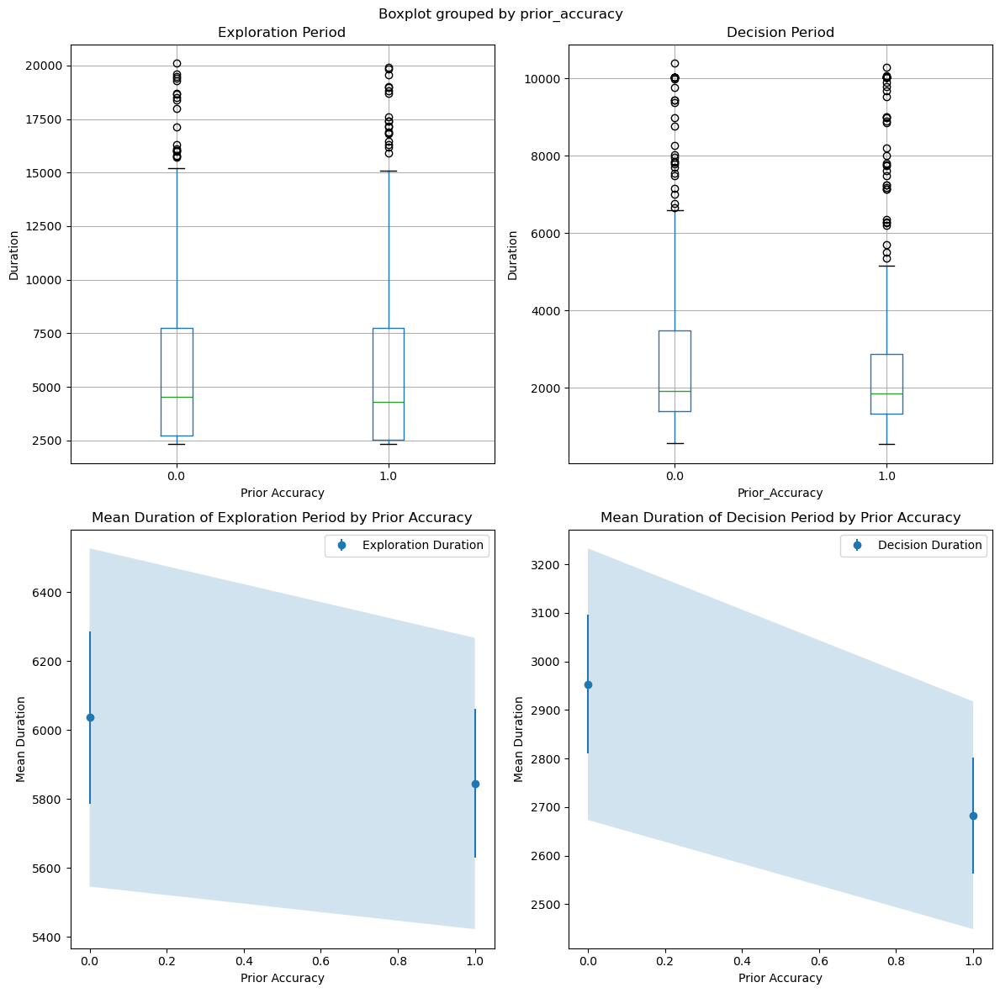

In [27]:
# Duration of both exploration and decision periods by.prior accuracy

DurExploration_by_prior_accuracy = [data[data['prior_accuracy'] == level]['durExplorationPeriod'] for level in data['prior_accuracy'].unique()]
DurExploration_by_prior_accuracy = [group.dropna() for group in DurExploration_by_prior_accuracy]

DurDecision_by_prior_accuracy = [data[data['prior_accuracy'] == level]['durDecisionPeriod'] for level in data['prior_accuracy'].unique()]
DurDecision_by_prior_accuracy = [group.dropna() for group in DurDecision_by_prior_accuracy]

# Shapiro-Wilk test for normality - Exploration
for group_name, group_data in data.groupby('prior_accuracy')['durExplorationPeriod']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances - Exploration
stat, p = levene(*DurExploration_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Exploration
H, p = kruskal(*DurExploration_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Shapiro-Wilk test for normality - Decision
for group_name, group_data in data.groupby('prior_accuracy')['durDecisionPeriod']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances - Decision
stat, p = levene(*DurDecision_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Decision
H, p = kruskal(*DurDecision_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of duration of exploration period by prior accuracy
mean_exp_duration_by_prior_accuracy = data.groupby('prior_accuracy')['durExplorationPeriod'].mean().values
median_exp_duration_by_prior_accuracy = data.groupby('prior_accuracy')['durExplorationPeriod'].median().values
sem_exp_duration_by_prior_accuracy = data.groupby('prior_accuracy')['durExplorationPeriod'].sem().values

# Confidence intervals for exploration
exploration_conf_intervals = 1.96 * sem_exp_duration_by_prior_accuracy  

print("Mean Duration of Exploration by Prior Accuracy:")
print(mean_exp_duration_by_prior_accuracy)
print("Median Duration of Exploration by Prior Accuracy:")
print(median_exp_duration_by_prior_accuracy)
print("SEM Duration of Exploration by Prior Accuracy:")
print(sem_exp_duration_by_prior_accuracy)

# Mean and SEM of duration of decision period by prior accuracy
mean_dec_duration_by_prior_accuracy = data.groupby('prior_accuracy')['durDecisionPeriod'].mean().values
sem_dec_duration_by_prior_accuracy = data.groupby('prior_accuracy')['durDecisionPeriod'].sem().values
median_dec_duration_by_prior_accuracy = data.groupby('prior_accuracy')['durDecisionPeriod'].median().values

# Confidence intervals for decision 
decision_conf_intervals = 1.96 * sem_dec_duration_by_prior_accuracy  

print("Mean Duration of Decision by Prior Accuracy:")
print(mean_dec_duration_by_prior_accuracy)
print("Median Duration of Decision by Prior Accuracy:")
print(median_dec_duration_by_prior_accuracy)
print("SEM Duration of Decision by Prior Accuracy:")
print(sem_dec_duration_by_prior_accuracy)

# Plots
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))

# Exploration Period Boxplot
data.boxplot(column='durExplorationPeriod', by='prior_accuracy', ax=axs[0, 0])
axs[0, 0].set_title('Exploration Period')
axs[0, 0].set_xlabel('Prior Accuracy')
axs[0, 0].set_ylabel('Duration')

# Decision Period Boxplot
data.boxplot(column='durDecisionPeriod', by='prior_accuracy', ax=axs[0, 1])
axs[0, 1].set_title('Decision Period')
axs[0, 1].set_xlabel('Prior_Accuracy')
axs[0, 1].set_ylabel('Duration')

# Error bars with confidence intervals
axs[1, 0].errorbar(np.arange(len(mean_exp_duration_by_prior_accuracy)), mean_exp_duration_by_prior_accuracy, yerr=sem_exp_duration_by_prior_accuracy, fmt='o', label='Exploration Duration')
axs[1, 0].fill_between(np.arange(len(mean_exp_duration_by_prior_accuracy)), mean_exp_duration_by_prior_accuracy - exploration_conf_intervals, mean_exp_duration_by_prior_accuracy + exploration_conf_intervals, alpha=0.2)
axs[1, 0].set_xlabel('Prior Accuracy')
axs[1, 0].set_ylabel('Mean Duration')
axs[1, 0].set_title('Mean Duration of Exploration Period by Prior Accuracy')
axs[1, 0].legend()

axs[1, 1].errorbar(np.arange(len(mean_dec_duration_by_prior_accuracy)), mean_dec_duration_by_prior_accuracy, yerr=sem_dec_duration_by_prior_accuracy, fmt='o', label='Decision Duration')
axs[1, 1].fill_between(np.arange(len(mean_dec_duration_by_prior_accuracy)), mean_dec_duration_by_prior_accuracy - decision_conf_intervals, mean_dec_duration_by_prior_accuracy + decision_conf_intervals, alpha=0.2)
axs[1, 1].set_xlabel('Prior Accuracy')
axs[1, 1].set_ylabel('Mean Duration')
axs[1, 1].set_title('Mean Duration of Decision Period by Prior Accuracy')
axs[1, 1].legend()

plt.tight_layout()
plt.show()

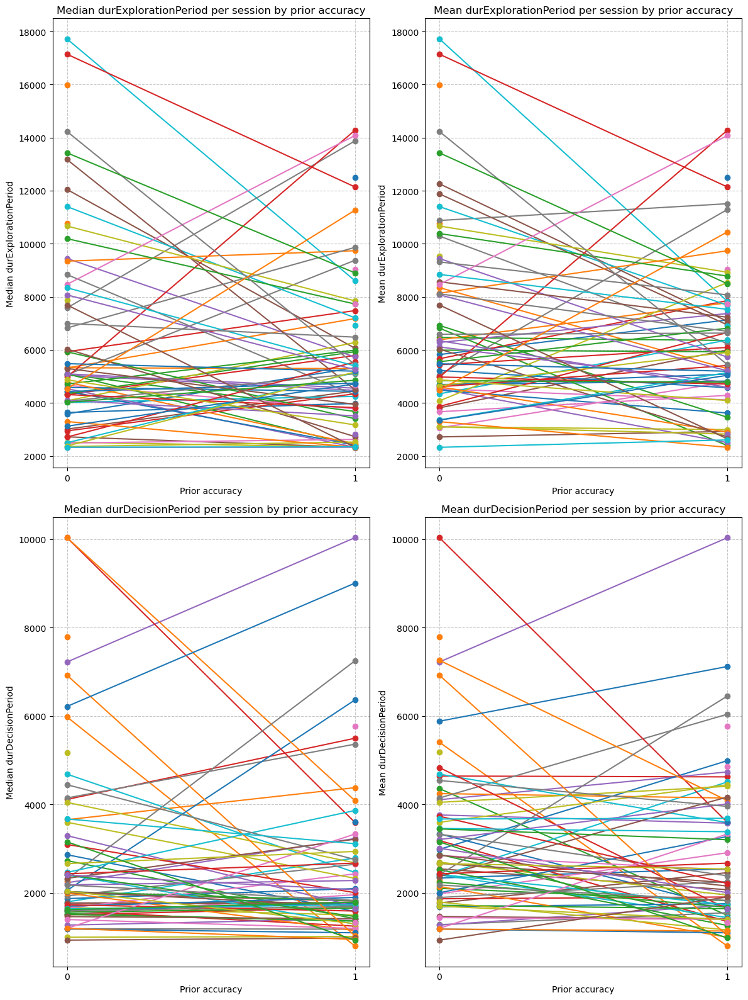

In [28]:
# Duration of both exploration and decision periods vs. prior accuracy per session

# Median durExplorationPeriod per session by prior accuracy 
durExplorationPeriod_per_trial_prior_accuracy = data.groupby(['session', 'trialno', 'prior_accuracy'])['durExplorationPeriod'].sum().reset_index()
durExplorationPeriod_per_trial_prior_accuracy.dropna(inplace=True)
median_durExplorationPeriod_per_session_prior_accuracy = durExplorationPeriod_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['durExplorationPeriod'].median().unstack()

plt.figure(figsize=(12, 16))

all_sessions = median_durExplorationPeriod_per_session_prior_accuracy.index

plt.subplot(2, 2, 1)
for session in all_sessions:
    session_data = median_durExplorationPeriod_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Median durExplorationPeriod per session by prior accuracy')
plt.xlabel('Prior accuracy')
plt.ylabel('Median durExplorationPeriod')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()

# Mean durExplorationPeriod per session by prior accuracy
mean_durExplorationPeriod_per_session_prior_accuracy = durExplorationPeriod_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['durExplorationPeriod'].mean().unstack()

plt.subplot(2, 2, 2)
for session in all_sessions:
    session_data = mean_durExplorationPeriod_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Mean durExplorationPeriod per session by prior accuracy')
plt.xlabel('Prior accuracy')
plt.ylabel('Mean durExplorationPeriod')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()

# Median durDecisionPeriod per session by prior accuracy
durDecisionPeriod_per_trial_prior_accuracy = data.groupby(['session', 'trialno', 'prior_accuracy'])['durDecisionPeriod'].sum().reset_index()
durDecisionPeriod_per_trial_prior_accuracy.dropna(inplace=True)
median_durDecisionPeriod_per_session_prior_accuracy = durDecisionPeriod_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['durDecisionPeriod'].median().unstack()

plt.subplot(2, 2, 3)
for session in all_sessions:
    session_data = median_durDecisionPeriod_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Median durDecisionPeriod per session by prior accuracy')
plt.xlabel('Prior accuracy')
plt.ylabel('Median durDecisionPeriod')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()

# Mean durDecisionPeriod per session by prior accuracy 
mean_durDecisionPeriod_per_session_prior_accuracy = durDecisionPeriod_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['durDecisionPeriod'].mean().unstack()

plt.subplot(2, 2, 4)
for session in all_sessions:
    session_data = mean_durDecisionPeriod_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Mean durDecisionPeriod per session by prior accuracy')
plt.xlabel('Prior accuracy')
plt.ylabel('Mean durDecisionPeriod')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()

plt.tight_layout()
plt.show()

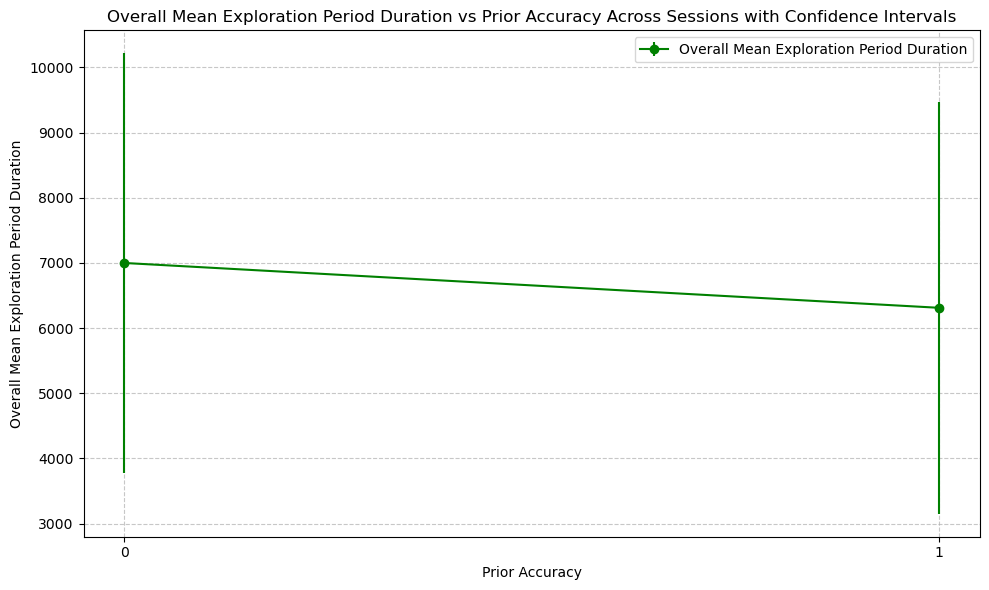

Overall Mean Exploration Period Duration per Prior Accuracy Across Sessions:
prior_accuracy
0.0    6998.946138
1.0    6311.075880
dtype: float64


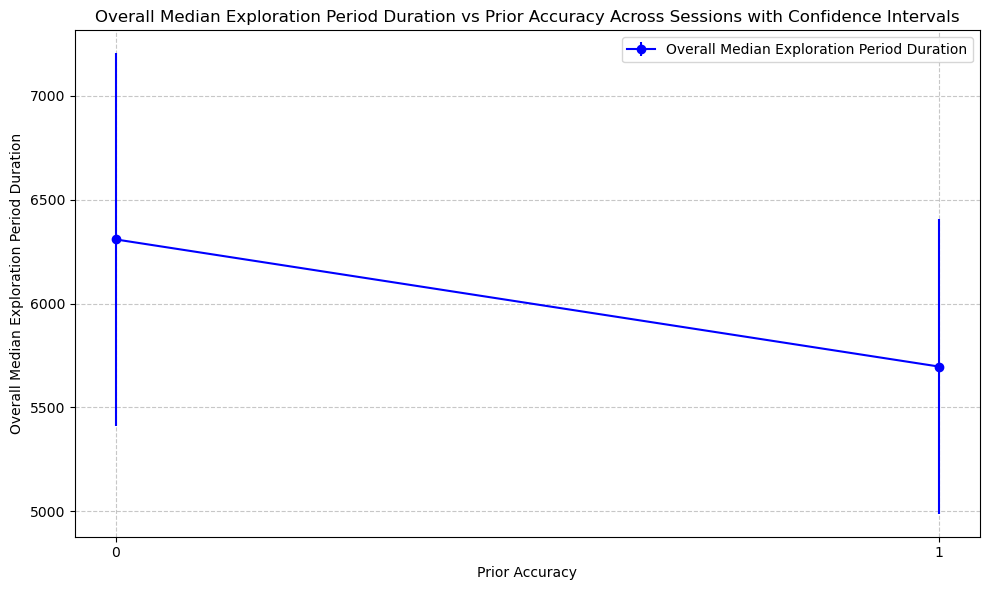


Overall Median Exploration Period Duration per Prior Accuracy Across Sessions:
prior_accuracy
0.0    6308.328358
1.0    5696.857143
dtype: float64


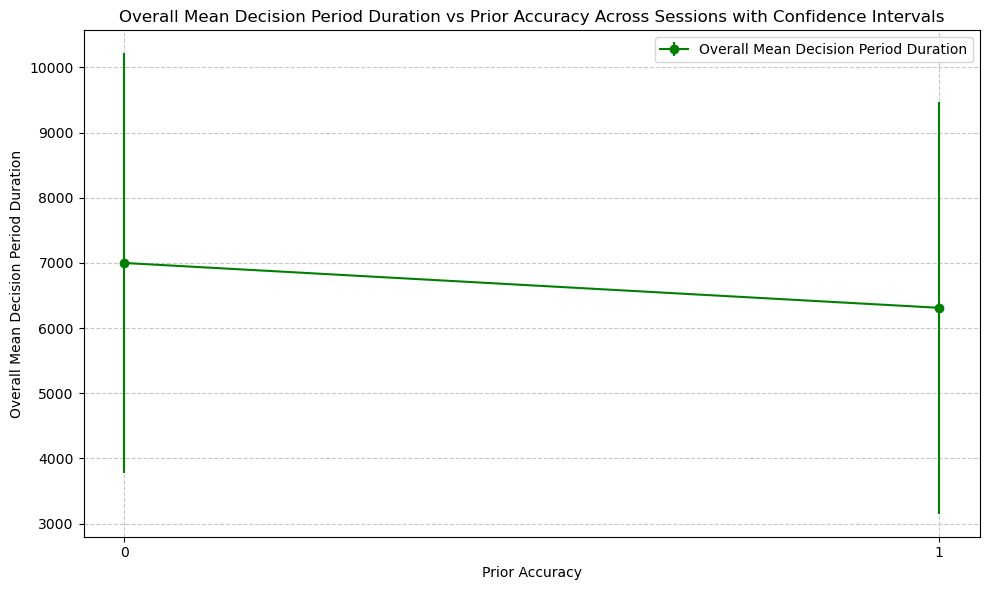

Overall Mean Decision Period Duration per Prior Accuracy Across Sessions:
prior_accuracy
0.0    6998.946138
1.0    6311.075880
dtype: float64


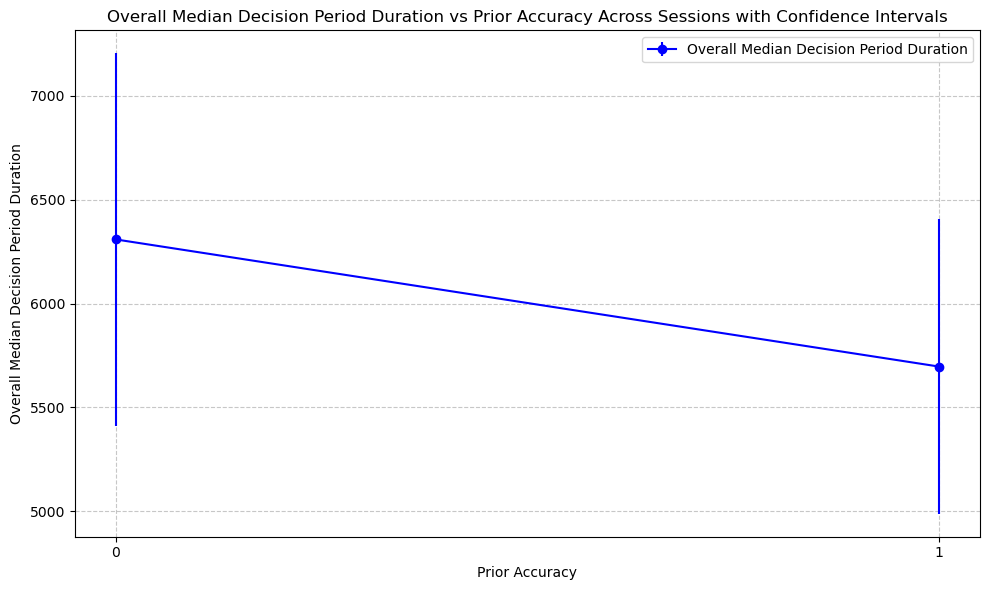


Overall Median Decision Period Duration per Prior Accuracy Across Sessions:
prior_accuracy
0.0    6308.328358
1.0    5696.857143
dtype: float64


In [29]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_exp_period = data.groupby(['session', 'prior_accuracy'])['durExplorationPeriod'].mean().unstack()
session_median_exp_period = data.groupby(['session', 'prior_accuracy'])['durExplorationPeriod'].median().unstack()

overall_mean_exp_period = session_mean_exp_period.mean()
overall_median_exp_period = session_median_exp_period.mean()

session_std_exp_period = data.groupby(['session', 'prior_accuracy'])['durExplorationPeriod'].std().unstack()
session_count_exp_period = data.groupby(['session', 'prior_accuracy'])['durExplorationPeriod'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_exp_period.mean() / np.sqrt(session_count_exp_period.mean())

overall_conf_interval_median = 1.96 * session_median_exp_period.std() / np.sqrt(session_median_exp_period.count())

# Mean exploration period duration across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_exp_period.index, overall_mean_exp_period.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Exploration Period Duration')
plt.title('Overall Mean Exploration Period Duration vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Mean Exploration Period Duration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("Overall Mean Exploration Period Duration per Prior Accuracy Across Sessions:")
print(overall_mean_exp_period)

# Median exploration period duration sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_exp_period.index, overall_median_exp_period.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Exploration Period Duration')
plt.title('Overall Median Exploration Period Duration vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Median Exploration Period Duration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("\nOverall Median Exploration Period Duration per Prior Accuracy Across Sessions:")
print(overall_median_exp_period)

session_mean_dec_period = data.groupby(['session', 'prior_accuracy'])['durExplorationPeriod'].mean().unstack()
session_median_dec_period = data.groupby(['session', 'prior_accuracy'])['durExplorationPeriod'].median().unstack()

overall_mean_dec_period = session_mean_dec_period.mean()
overall_median_dec_period = session_median_dec_period.mean()

session_std_dec_period = data.groupby(['session', 'prior_accuracy'])['durExplorationPeriod'].std().unstack()
session_count_dec_period = data.groupby(['session', 'prior_accuracy'])['durExplorationPeriod'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_dec_period.mean() / np.sqrt(session_count_dec_period.mean())

overall_conf_interval_median = 1.96 * session_median_dec_period.std() / np.sqrt(session_median_dec_period.count())

# Mean decision period duration across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_dec_period.index, overall_mean_dec_period.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Decision Period Duration')
plt.title('Overall Mean Decision Period Duration vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Mean Decision Period Duration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("Overall Mean Decision Period Duration per Prior Accuracy Across Sessions:")
print(overall_mean_dec_period)

# Median accuracy decision period duration sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_dec_period.index, overall_median_dec_period.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Decision Period Duration')
plt.title('Overall Median Decision Period Duration vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Median Decision Period Duration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("\nOverall Median Decision Period Duration per Prior Accuracy Across Sessions:")
print(overall_median_dec_period)

### Look duration of bottom images (exploration period) vs. Prior Accuracy

Shapiro-Wilk test for 0.0: p-value = 2.6645049345483604e-17
Shapiro-Wilk test for 1.0: p-value = 1.536576819003527e-14
Levene's test for homogeneity of variances: p-value = 0.854656496660902
Kruskal-Wallis test:
H-statistic: 0.10008447127744062
p-value: 0.7517282887608012
Mean Look Duration during Exploration of Bottom cards by Prior Accuracy:
prior_accuracy
0.0    3411.353135
1.0    3310.506739
Name: durLookBottomExploration, dtype: float64
Median Look Duration during Exploration of Bottom cards by Prior Accuracy:
prior_accuracy
0.0    2588.0
1.0    2618.0
Name: durLookBottomExploration, dtype: float64
SEM Look Duration during Exploration of Bottom Cards by Prior Accuracy:
prior_accuracy
0.0    166.663510
1.0    137.716159
Name: durLookBottomExploration, dtype: float64


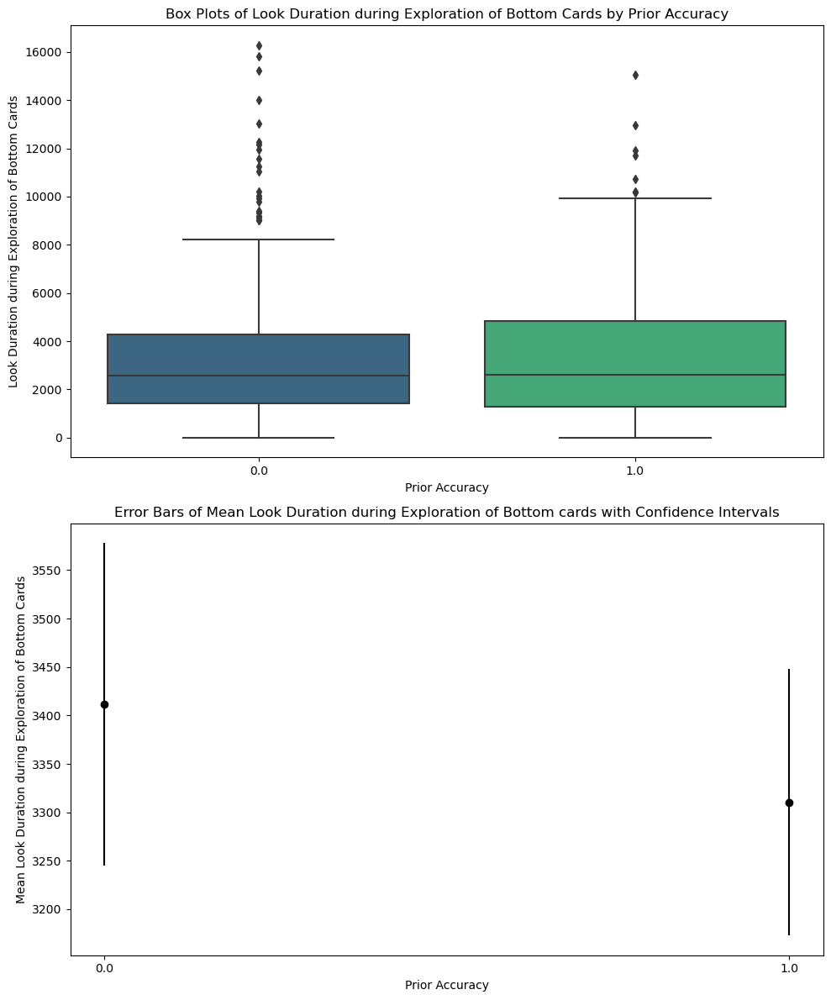

In [30]:
# durLookBottomExploration vs prior accuracy

LookDurBottomExploration_by_prior_accuracy = [data[data['prior_accuracy'] == level]['durLookBottomExploration'] for level in data['prior_accuracy'].unique()]
LookDurBottomExploration_by_prior_accuracy = [group.dropna() for group in LookDurBottomExploration_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['durLookBottomExploration']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*LookDurBottomExploration_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*LookDurBottomExploration_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of exploration of bottom cards duration by prior accuracy
mean_gazeduration_by_prior_accuracy = data.groupby('prior_accuracy')['durLookBottomExploration'].mean()
median_gazeduration_by_prior_accuracy = data.groupby('prior_accuracy')['durLookBottomExploration'].median()
sem_gazeduration_by_prior_accuracy = data.groupby('prior_accuracy')['durLookBottomExploration'].sem()
print("Mean Look Duration during Exploration of Bottom cards by Prior Accuracy:")
print(mean_gazeduration_by_prior_accuracy)
print("Median Look Duration during Exploration of Bottom cards by Prior Accuracy:")
print(median_gazeduration_by_prior_accuracy)
print("SEM Look Duration during Exploration of Bottom Cards by Prior Accuracy:")
print(sem_gazeduration_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='durLookBottomExploration', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('Look Duration during Exploration of Bottom Cards')
ax1.set_title('Box Plots of Look Duration during Exploration of Bottom Cards by Prior Accuracy')

ax2.errorbar(np.arange(len(mean_gazeduration_by_prior_accuracy)), mean_gazeduration_by_prior_accuracy, yerr=sem_gazeduration_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Mean Look Duration during Exploration of Bottom Cards')
ax2.set_title('Error Bars of Mean Look Duration during Exploration of Bottom cards with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_gazeduration_by_prior_accuracy)))
ax2.set_xticklabels(mean_gazeduration_by_prior_accuracy.index)

plt.tight_layout()
plt.show()

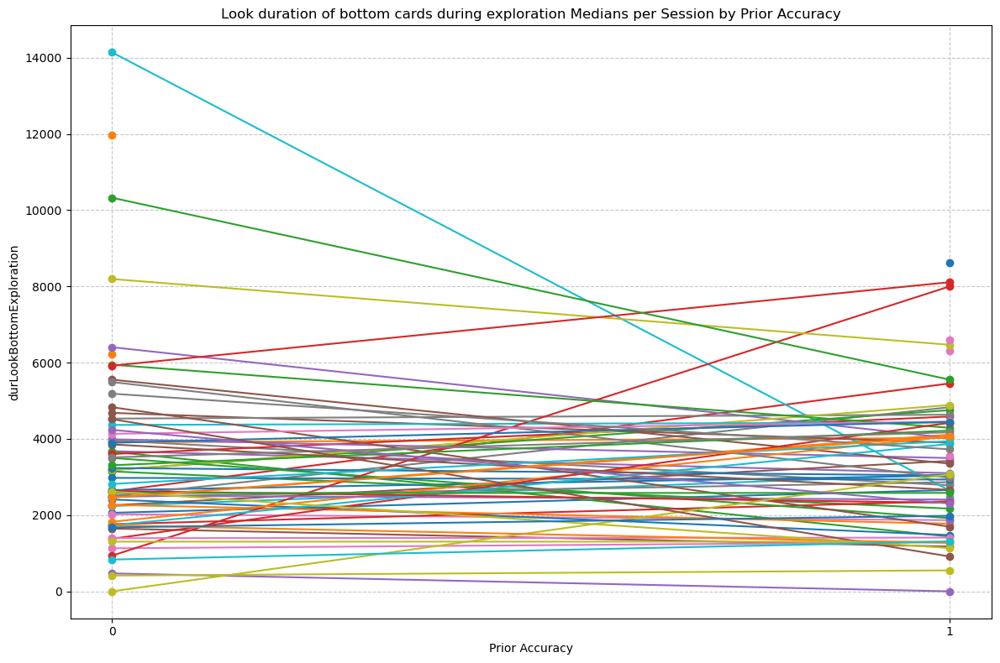

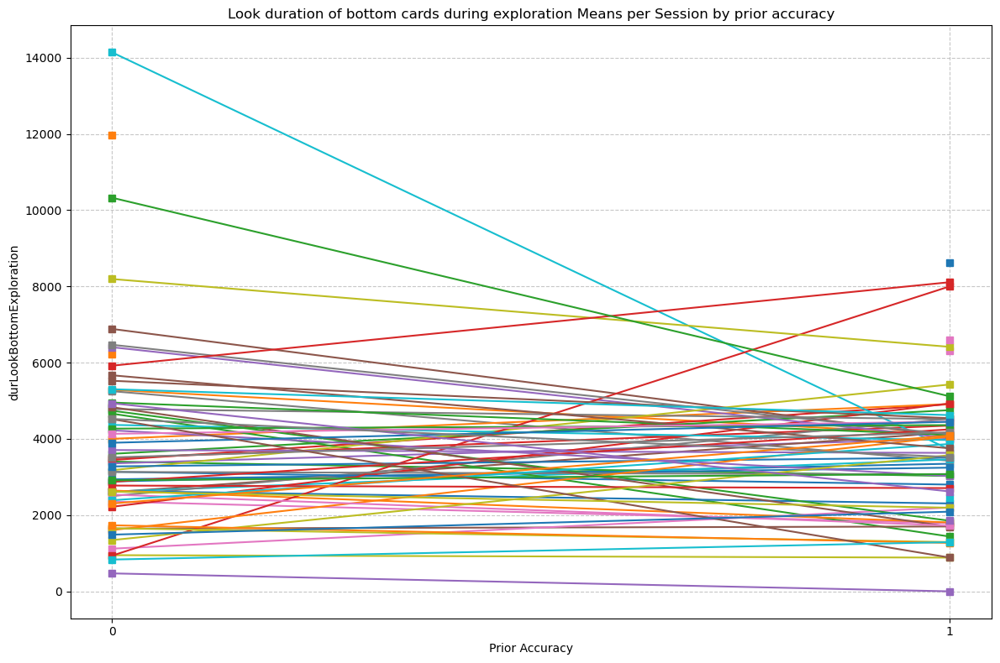

In [31]:
#look duration of bottom cards during exploration per session by prior accuracy per session

#Medians
session_look_exploration = data.groupby(['session', 'prior_accuracy'])['durLookBottomExploration'].median().unstack()

sessions = data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_prior_accuracy = session_look_exploration.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        median_durLookBottom_session = session_look_exploration.loc[session][available_prior_accuracy]
        plt.plot(median_durLookBottom_session.index, median_durLookBottom_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Look duration of bottom cards during exploration Medians per Session by Prior Accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('durLookBottomExploration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
#plt.legend()
plt.show()

session_look_exploration_mean = data.groupby(['session', 'prior_accuracy'])['durLookBottomExploration'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_prior_accuracy = session_look_exploration_mean.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        mean_durLookBottom_session = session_look_exploration_mean.loc[session][available_prior_accuracy]
        plt.plot(mean_durLookBottom_session.index, mean_durLookBottom_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Look duration of bottom cards during exploration Means per Session by prior accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('durLookBottomExploration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
#plt.legend()
plt.tight_layout()
plt.show()

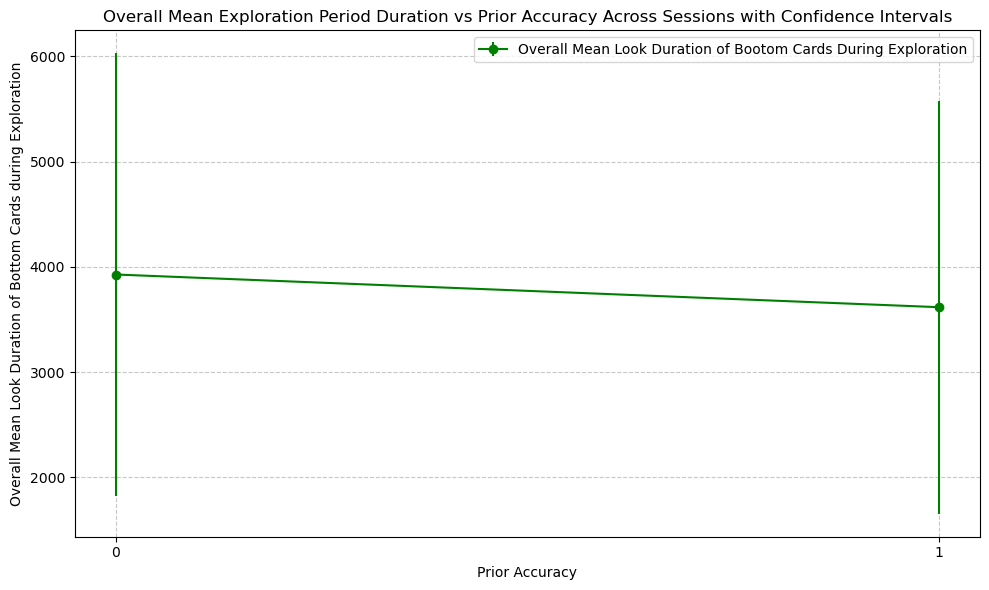

Overall Mean Look Duration of Bootom Cards During Exploration per Prior Accuracy Across Sessions:
prior_accuracy
0.0    3927.881142
1.0    3617.364656
dtype: float64


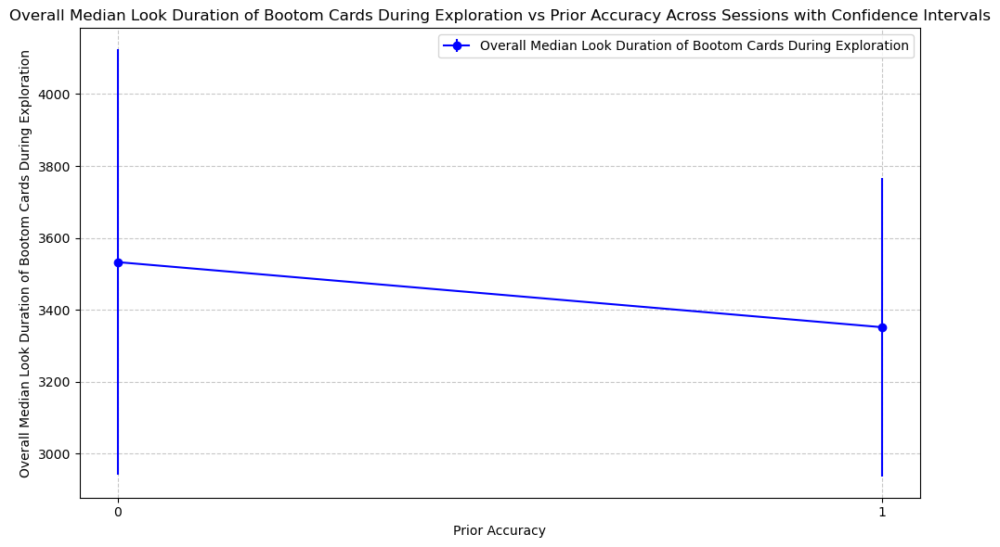


Overall Median Look Duration of Bootom Cards During Exploration per Prior Accuracy Across Sessions:
prior_accuracy
0.0    3532.507463
1.0    3351.485714
dtype: float64


In [32]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_exp_durLookBottom = data.groupby(['session', 'prior_accuracy'])['durLookBottomExploration'].mean().unstack()
session_median_exp_durLookBottom = data.groupby(['session', 'prior_accuracy'])['durLookBottomExploration'].median().unstack()

overall_mean_exp_durLookBottom = session_mean_exp_durLookBottom.mean()
overall_median_exp_durLookBottom = session_median_exp_durLookBottom.mean()

session_std_exp_durLookBottom = data.groupby(['session', 'prior_accuracy'])['durLookBottomExploration'].std().unstack()
session_count_exp_durLookBottom = data.groupby(['session', 'prior_accuracy'])['durLookBottomExploration'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_exp_durLookBottom.mean() / np.sqrt(session_count_exp_durLookBottom.mean())

overall_conf_interval_median = 1.96 * session_median_exp_durLookBottom.std() / np.sqrt(session_median_exp_durLookBottom.count())

# Mean exploration look duration of bottom cards across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_exp_durLookBottom.index, overall_mean_exp_durLookBottom.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Look Duration of Bootom Cards During Exploration')
plt.title('Overall Mean Exploration Period Duration vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Mean Look Duration of Bottom Cards during Exploration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("Overall Mean Look Duration of Bootom Cards During Exploration per Prior Accuracy Across Sessions:")
print(overall_mean_exp_durLookBottom)

# Median exploration look duration of bottom cards across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_exp_durLookBottom.index, overall_median_exp_durLookBottom.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Look Duration of Bootom Cards During Exploration')
plt.title('Overall Median Look Duration of Bootom Cards During Exploration vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Median Look Duration of Bootom Cards During Exploration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("\nOverall Median Look Duration of Bootom Cards During Exploration per Prior Accuracy Across Sessions:")
print(overall_median_exp_durLookBottom)

### Look Duration of Top card (decision period) vs. Prior Accuracy

Shapiro-Wilk test for 0.0: p-value = 1.7996394551669798e-18
Shapiro-Wilk test for 1.0: p-value = 1.6624493746339475e-22
Levene's test for homogeneity of variances: p-value = 0.9216738664541536
Kruskal-Wallis test:
H-statistic: 0.39088745859046525
p-value: 0.5318332844126222
Mean LookDurInTDecision by Prior Accuracy:
prior_accuracy
0.0    1486.303630
1.0    1455.514825
Name: LookDurInTDecision, dtype: float64
Median LookDurInTDecision by Prior Accuracy:
prior_accuracy
0.0    1038.0
1.0    1046.0
Name: LookDurInTDecision, dtype: float64
SEM LookDurInTDecision by Prior Accuracy:
prior_accuracy
0.0    79.288335
1.0    75.173068
Name: LookDurInTDecision, dtype: float64


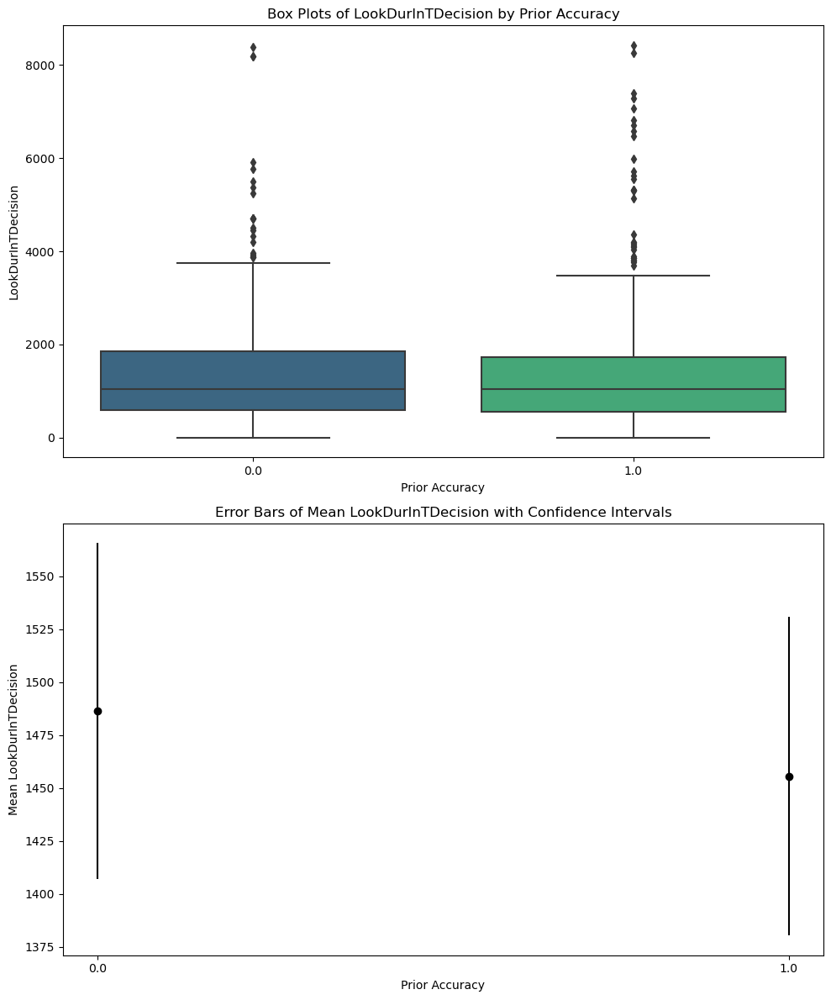

In [33]:
#Look Top Card (decision period) by Prior Accuracy

LookDurInTDecision_by_prior_accuracy = [data[data['prior_accuracy'] == level]['LookDurInTDecision'] for level in data['prior_accuracy'].unique()]
LookDurInTDecision_by_prior_accuracy = [group.dropna() for group in LookDurInTDecision_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['LookDurInTDecision']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*LookDurInTDecision_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*LookDurInTDecision_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of total trial duration by accuracy
mean_LookDurInTDecision_by_prior_accuracy = data.groupby('prior_accuracy')['LookDurInTDecision'].mean()
median_LookDurInTDecision_by_prior_accuracy = data.groupby('prior_accuracy')['LookDurInTDecision'].median()
sem_LookDurInTDecision_by_prior_accuracy = data.groupby('prior_accuracy')['LookDurInTDecision'].sem()
print("Mean LookDurInTDecision by Prior Accuracy:")
print(mean_LookDurInTDecision_by_prior_accuracy)
print("Median LookDurInTDecision by Prior Accuracy:")
print(median_LookDurInTDecision_by_prior_accuracy)
print("SEM LookDurInTDecision by Prior Accuracy:")
print(sem_LookDurInTDecision_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='LookDurInTDecision', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('LookDurInTDecision')
ax1.set_title('Box Plots of LookDurInTDecision by Prior Accuracy')

ax2.errorbar(np.arange(len(mean_LookDurInTDecision_by_prior_accuracy)), mean_LookDurInTDecision_by_prior_accuracy, yerr=sem_LookDurInTDecision_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Mean LookDurInTDecision')
ax2.set_title('Error Bars of Mean LookDurInTDecision with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_LookDurInTDecision_by_prior_accuracy)))
ax2.set_xticklabels(mean_LookDurInTDecision_by_prior_accuracy.index)

plt.tight_layout()
plt.show()

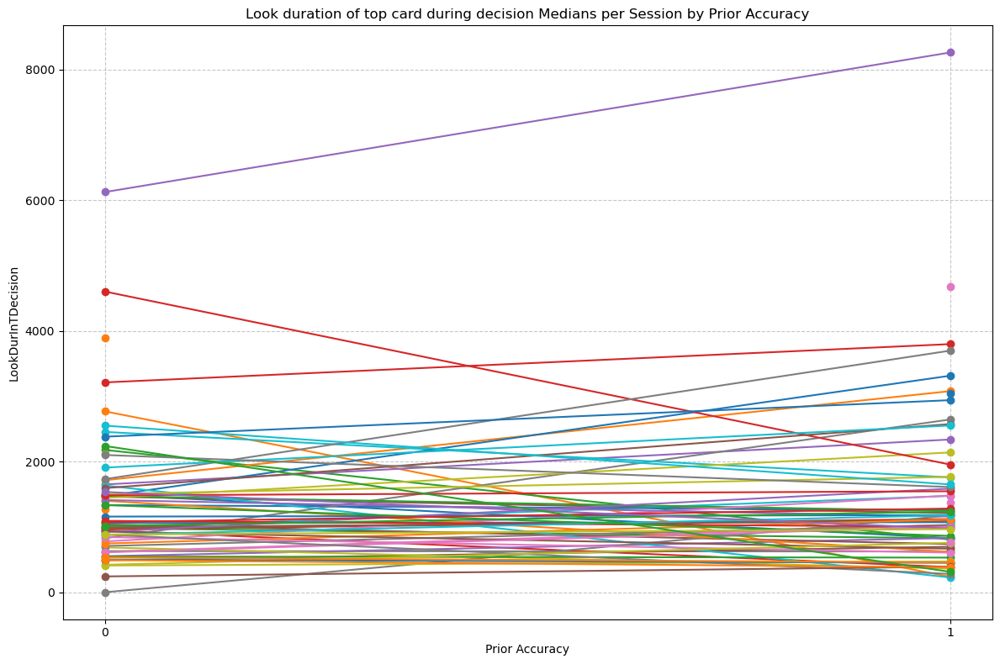

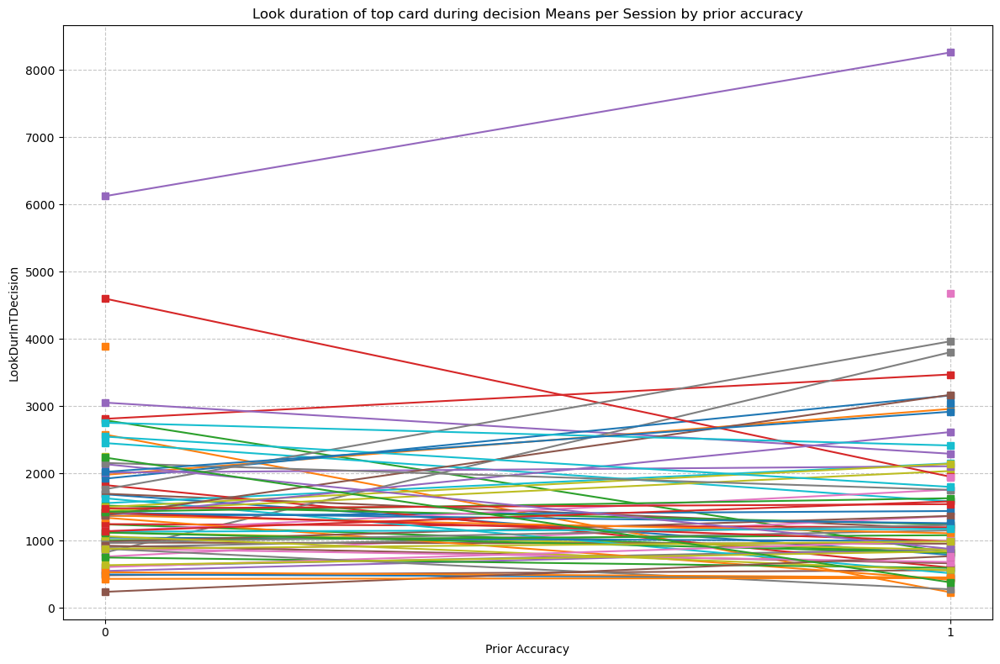

In [34]:
#look duration of top card during decision per session by prior accuracy per session

#Medians
session_look_decision = data.groupby(['session', 'prior_accuracy'])['LookDurInTDecision'].median().unstack()

sessions = data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_prior_accuracy = session_look_decision.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        median_LookDurInTDecision_session = session_look_decision.loc[session][available_prior_accuracy]
        plt.plot(median_LookDurInTDecision_session.index, median_LookDurInTDecision_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Look duration of top card during decision Medians per Session by Prior Accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('LookDurInTDecision')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
#plt.legend()
plt.show()

session_look_decision_mean = data.groupby(['session', 'prior_accuracy'])['LookDurInTDecision'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_prior_accuracy = session_look_decision_mean.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        mean_LookDurInTDecision_session = session_look_decision_mean.loc[session][available_prior_accuracy]
        plt.plot(mean_LookDurInTDecision_session.index, mean_LookDurInTDecision_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Look duration of top card during decision Means per Session by prior accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('LookDurInTDecision')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
#plt.legend()
plt.tight_layout()
plt.show()

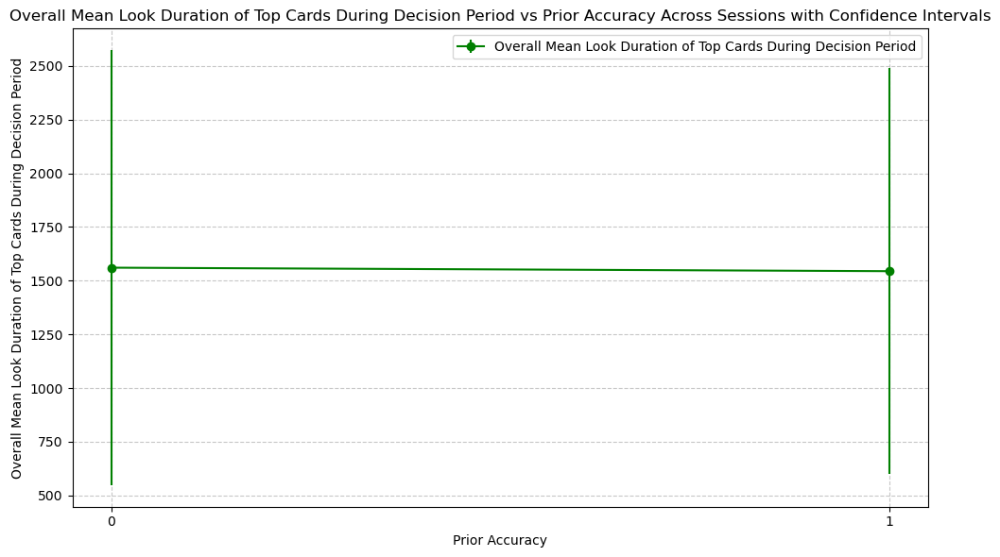

Overall Mean Look Duration of Top Cards During Decision Period per Prior Accuracy Across Sessions:
prior_accuracy
0.0    1560.636899
1.0    1544.351345
dtype: float64


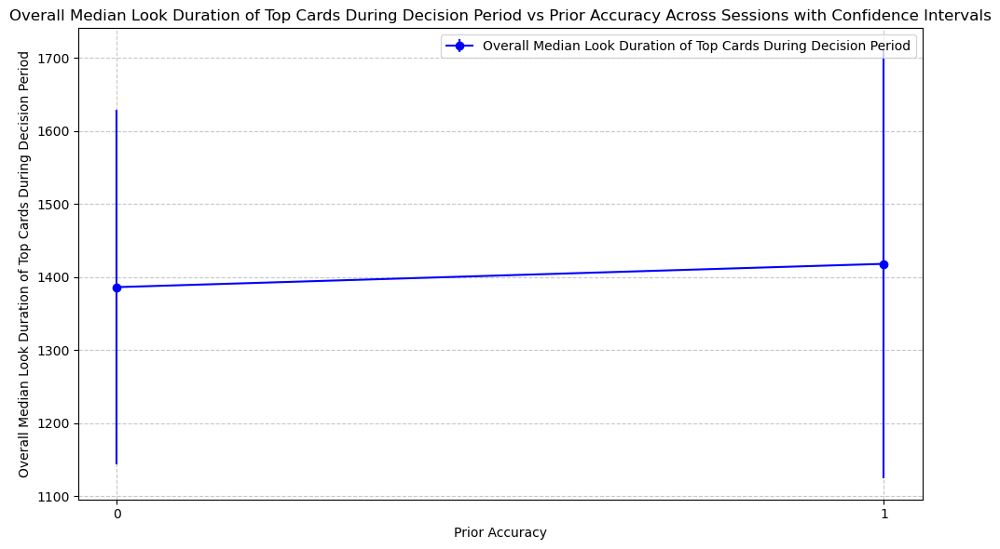


Overall Median Look Duration of Top Cards During Decision Period per Prior Accuracy Across Sessions:
prior_accuracy
0.0    1386.432836
1.0    1418.328571
dtype: float64


In [35]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_dec_LookTotDurInT = data.groupby(['session', 'prior_accuracy'])['LookDurInTDecision'].mean().unstack()
session_median_dec_LookTotDurInT = data.groupby(['session', 'prior_accuracy'])['LookDurInTDecision'].median().unstack()

overall_mean_dec_LookTotDurInT = session_mean_dec_LookTotDurInT.mean()
overall_median_dec_LookTotDurInT = session_median_dec_LookTotDurInT.mean()

session_std_dec_LookTotDurInT = data.groupby(['session', 'prior_accuracy'])['LookDurInTDecision'].std().unstack()
session_count_dec_LookTotDurInT = data.groupby(['session', 'prior_accuracy'])['LookDurInTDecision'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_dec_LookTotDurInT.mean() / np.sqrt(session_count_dec_LookTotDurInT.mean())

overall_conf_interval_median = 1.96 * session_median_dec_LookTotDurInT.std() / np.sqrt(session_median_dec_LookTotDurInT.count())

# Mean LookTotDurInT during decision period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_dec_LookTotDurInT.index, overall_mean_dec_LookTotDurInT.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Look Duration of Top Cards During Decision Period')
plt.title('Overall Mean Look Duration of Top Cards During Decision Period vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Mean Look Duration of Top Cards During Decision Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("Overall Mean Look Duration of Top Cards During Decision Period per Prior Accuracy Across Sessions:")
print(overall_mean_dec_LookTotDurInT)

# Median LookTotDurInT during decision period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_dec_LookTotDurInT.index, overall_median_dec_LookTotDurInT.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Look Duration of Top Cards During Decision Period')
plt.title('Overall Median Look Duration of Top Cards During Decision Period vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Median Look Duration of Top Cards During Decision Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("\nOverall Median Look Duration of Top Cards During Decision Period per Prior Accuracy Across Sessions:")
print(overall_median_dec_LookTotDurInT)

### Total Number of fixations vs. Prior Accuracy

Shapiro-Wilk test for 0.0: p-value = 5.906318693234998e-16
Shapiro-Wilk test for 1.0: p-value = 6.251017423393454e-14
Levene's test for homogeneity of variances: p-value = 0.3885942189490572
Kruskal-Wallis test:
H-statistic: 0.23226732323431593
p-value: 0.6298477150906463
Mean FixNb by Prior Accuracy:
prior_accuracy
0.0    15.963696
1.0    15.725067
Name: FixNb, dtype: float64
Median FixNb by Prior Accuracy:
prior_accuracy
0.0    14.0
1.0    14.0
Name: FixNb, dtype: float64
SEM FixNb by Prior Accuracy:
prior_accuracy
0.0    0.496294
1.0    0.442777
Name: FixNb, dtype: float64


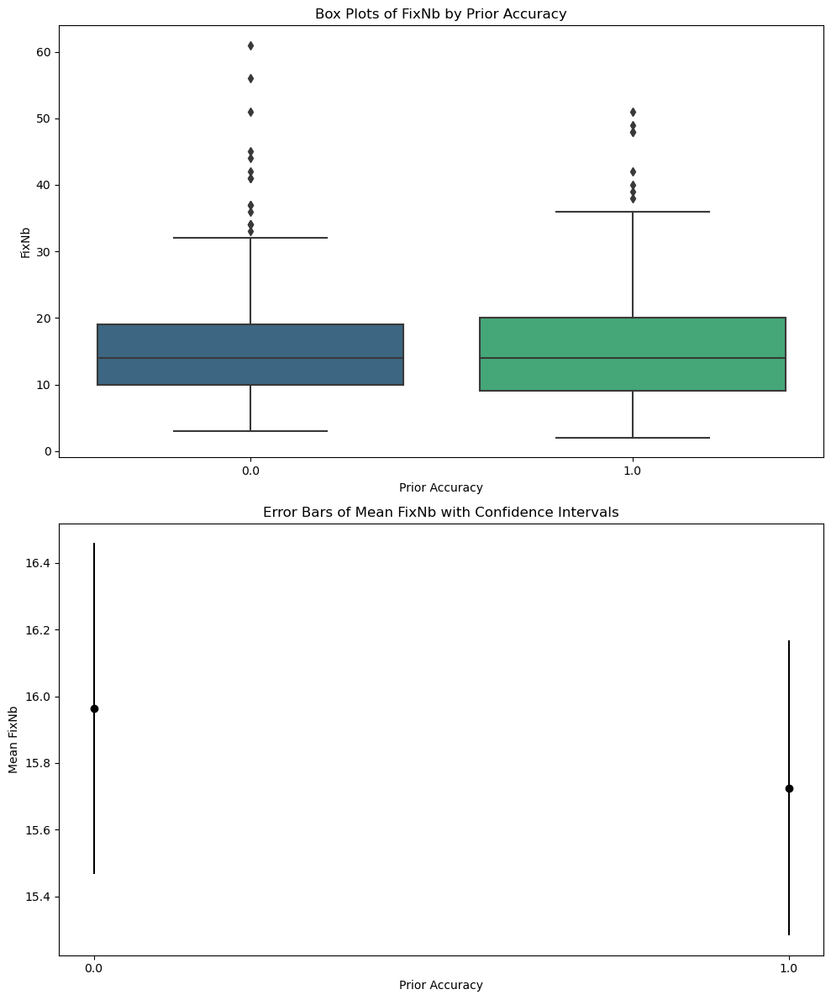

In [36]:
#Fixations by Prior Accuracy

FixNb_by_prior_accuracy = [data[data['prior_accuracy'] == level]['FixNb'] for level in data['prior_accuracy'].unique()]
FixNb_by_prior_accuracy = [group.dropna() for group in FixNb_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['FixNb']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*FixNb_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*FixNb_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of FixNb by accuracy
mean_FixNb_by_prior_accuracy = data.groupby('prior_accuracy')['FixNb'].mean()
median_FixNb_by_prior_accuracy = data.groupby('prior_accuracy')['FixNb'].median()
sem_FixNb_by_prior_accuracy = data.groupby('prior_accuracy')['FixNb'].sem()
print("Mean FixNb by Prior Accuracy:")
print(mean_FixNb_by_prior_accuracy)
print("Median FixNb by Prior Accuracy:")
print(median_FixNb_by_prior_accuracy)
print("SEM FixNb by Prior Accuracy:")
print(sem_FixNb_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='FixNb', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('FixNb')
ax1.set_title('Box Plots of FixNb by Prior Accuracy')

ax2.errorbar(np.arange(len(mean_FixNb_by_prior_accuracy)), mean_FixNb_by_prior_accuracy, yerr=sem_FixNb_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Mean FixNb')
ax2.set_title('Error Bars of Mean FixNb with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_FixNb_by_prior_accuracy)))
ax2.set_xticklabels(mean_FixNb_by_prior_accuracy.index)

plt.tight_layout()
plt.show()

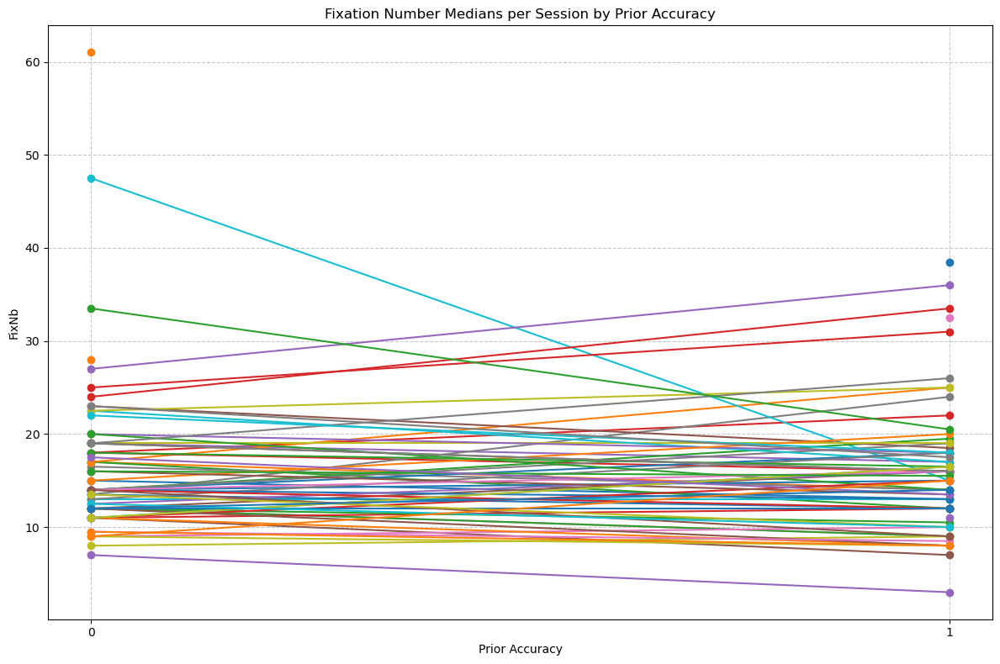

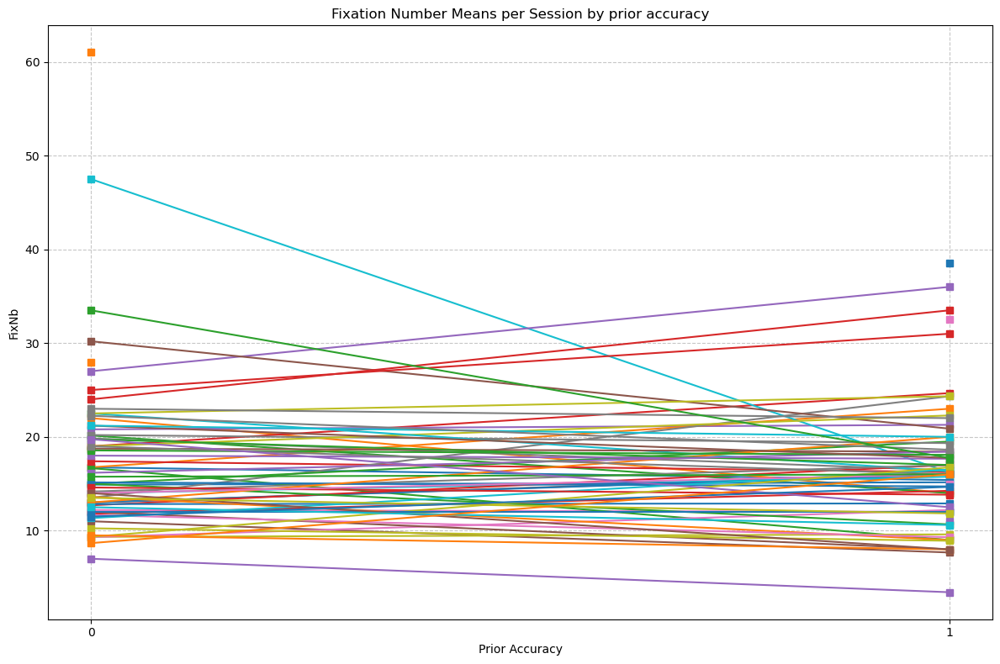

In [37]:
# Total number of fixations per session by prior accuracy per session

#Medians
session_FixNb = data.groupby(['session', 'prior_accuracy'])['FixNb'].median().unstack()

sessions = data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_prior_accuracy = session_FixNb.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        median_FixNb_session = session_FixNb.loc[session][available_prior_accuracy]
        plt.plot(median_FixNb_session.index, median_FixNb_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Fixation Number Medians per Session by Prior Accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('FixNb')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
#plt.legend()
plt.show()

session_FixNb_mean = data.groupby(['session', 'prior_accuracy'])['FixNb'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_prior_accuracy = session_FixNb_mean.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        mean_FixNb_session = session_FixNb_mean.loc[session][available_prior_accuracy]
        plt.plot(mean_FixNb_session.index, mean_FixNb_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation Number Means per Session by prior accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('FixNb')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
#plt.legend()
plt.tight_layout()
plt.show()

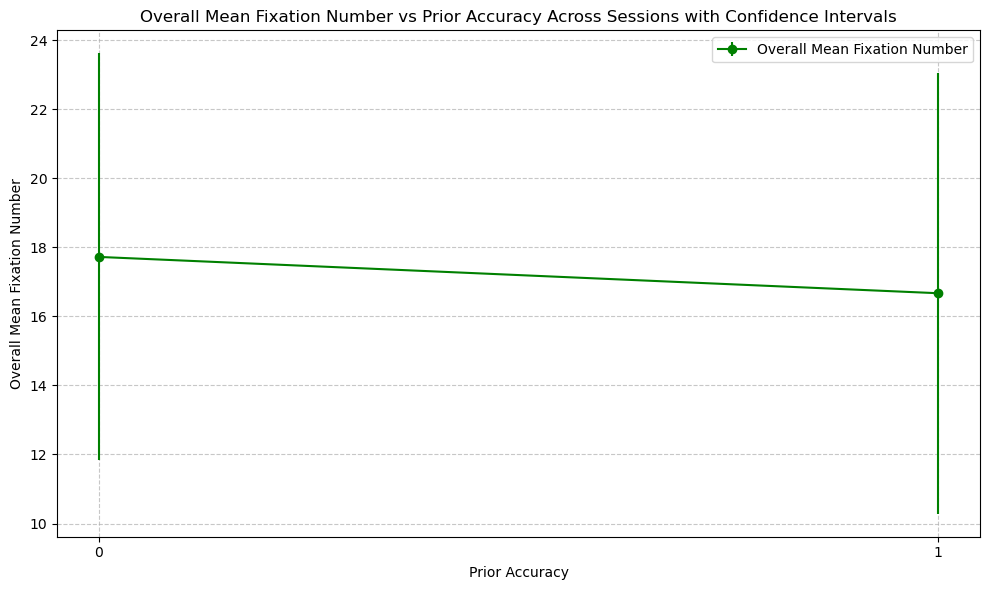

Overall Mean Fixation Number per Prior Accuracy Across Sessions:
prior_accuracy
0.0    17.719273
1.0    16.668059
dtype: float64


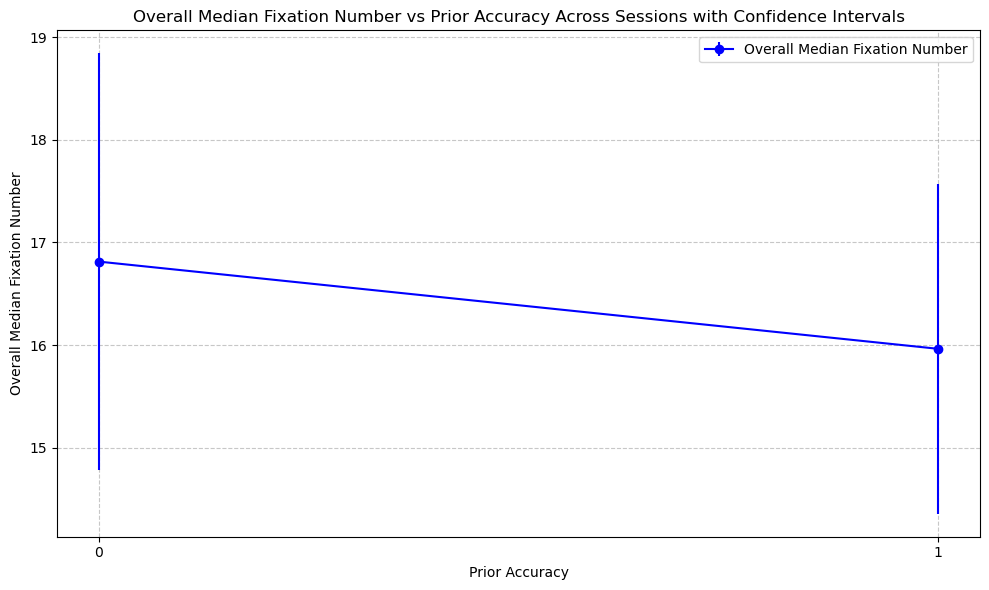


Overall Median Fixation Number per Prior Accuracy Across Sessions:
prior_accuracy
0.0    16.813433
1.0    15.964286
dtype: float64


In [38]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_FixNb = data.groupby(['session', 'prior_accuracy'])['FixNb'].mean().unstack()
session_median_FixNb = data.groupby(['session', 'prior_accuracy'])['FixNb'].median().unstack()

overall_mean_FixNb = session_mean_FixNb.mean()
overall_median_FixNb = session_median_FixNb.mean()

session_std_FixNb = data.groupby(['session', 'prior_accuracy'])['FixNb'].std().unstack()
session_count_FixNb= data.groupby(['session', 'prior_accuracy'])['FixNb'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_FixNb.mean() / np.sqrt(session_count_FixNb.mean())

overall_conf_interval_median = 1.96 * session_median_FixNb.std() / np.sqrt(session_median_FixNb.count())

# Mean FixNb across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_FixNb.index, overall_mean_FixNb.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Fixation Number')
plt.title('Overall Mean Fixation Number vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Mean Fixation Number')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("Overall Mean Fixation Number per Prior Accuracy Across Sessions:")
print(overall_mean_FixNb)

# Median FixNb across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_FixNb.index, overall_median_FixNb.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Fixation Number')
plt.title('Overall Median Fixation Number vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Median Fixation Number')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("\nOverall Median Fixation Number per Prior Accuracy Across Sessions:")
print(overall_median_FixNb)

### Number of fixations in exploration and decision periods vs. Prior Accuracy

Shapiro-Wilk test for 0.0: p-value = 3.635294352561908e-18
Shapiro-Wilk test for 1.0: p-value = 7.897198370755012e-15
Levene's test for homogeneity of variances: p-value = 0.8416482138740267
Kruskal-Wallis test:
H-statistic: 0.01175023592552437
p-value: 0.9136795868423744
Shapiro-Wilk test for 0.0: p-value = 2.57109387309802e-18
Shapiro-Wilk test for 1.0: p-value = 1.8421155853811978e-23
Levene's test for homogeneity of variances: p-value = 0.9435159971417111
Kruskal-Wallis test:
H-statistic: 0.13803222069974178
p-value: 0.7102451408531517
Mean Fixation Number during Exploration by Prior Accuracy:
[10.82508251 10.59568733]
Median Fixation Number during Exploration by Prior Accuracy:
[9. 9.]
SEM Fixation Number during Exploration by Prior Accuracy:
[0.43510684 0.35958656]
Mean Fixation Number during Decision by Prior Accuracy:
[5.13861386 5.12938005]
Median Fixation Number during Decision by Prior Accuracy:
[4. 4.]
SEM Fixation Number during Decision by Prior Accuracy:
[0.20005295 0.192

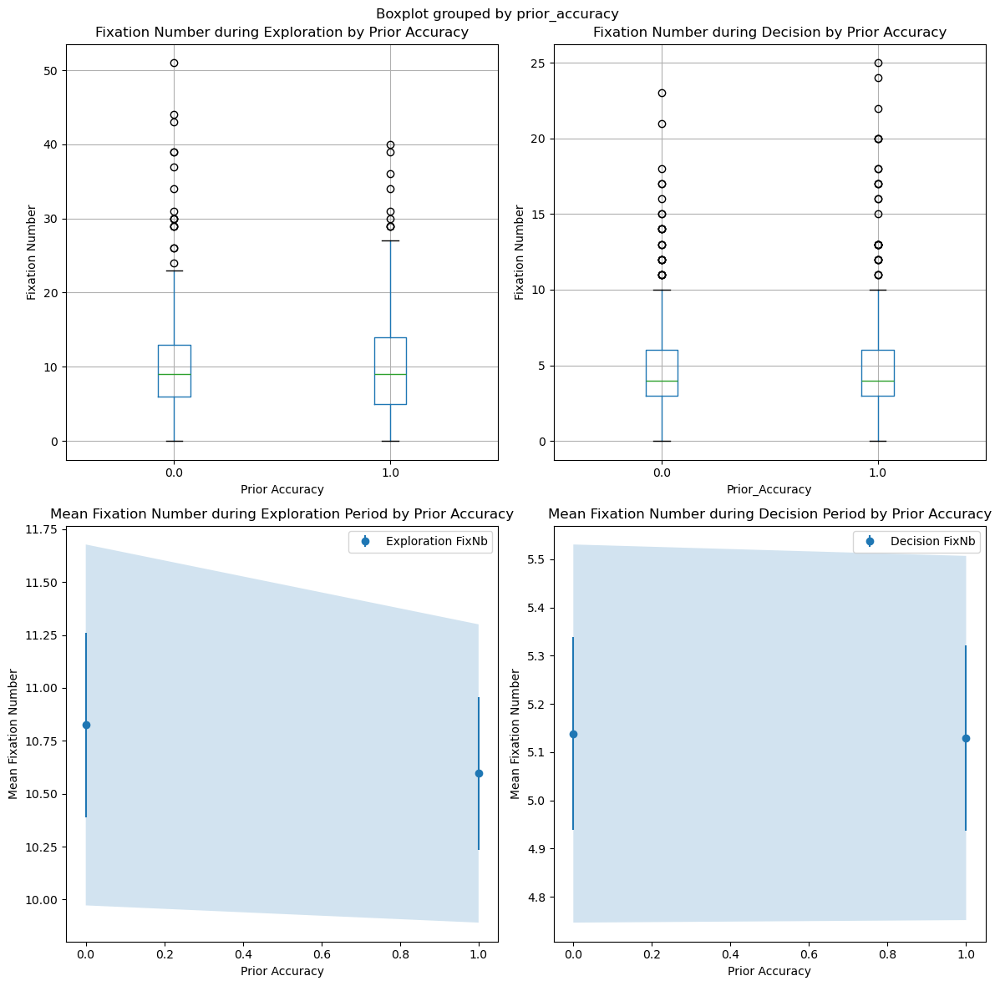

In [39]:
#Fixation Number exploration vs. decision periods by prior accuracy

FixNbExploration_by_prior_accuracy = [data[data['prior_accuracy'] == level]['FixNbExplorationPeriod'] for level in data['prior_accuracy'].unique()]
FixNbExploration_by_prior_accuracy = [group.dropna() for group in FixNbExploration_by_prior_accuracy]

FixNbDecision_by_prior_accuracy = [data[data['prior_accuracy'] == level]['FixNbDecisionPeriod'] for level in data['prior_accuracy'].unique()]
FixNbDecision_by_prior_accuracy = [group.dropna() for group in FixNbDecision_by_prior_accuracy]

# Shapiro-Wilk test for normality - Exploration
for group_name, group_data in data.groupby('prior_accuracy')['FixNbExplorationPeriod']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances - Exploration
stat, p = levene(*FixNbExploration_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Exploration
H, p = kruskal(*FixNbExploration_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Shapiro-Wilk test for normality - Decision
for group_name, group_data in data.groupby('prior_accuracy')['FixNbDecisionPeriod']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances - Decision
stat, p = levene(*FixNbDecision_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test - Decision
H, p = kruskal(*FixNbDecision_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of duration of exploration period by prior accuracy
mean_exp_FixNb_by_prior_accuracy = data.groupby('prior_accuracy')['FixNbExplorationPeriod'].mean().values
median_exp_FixNb_by_prior_accuracy = data.groupby('prior_accuracy')['FixNbExplorationPeriod'].median().values
sem_exp_FixNb_by_prior_accuracy = data.groupby('prior_accuracy')['FixNbExplorationPeriod'].sem().values

# Confidence intervals for exploration
FixNbexploration_conf_intervals = 1.96 * sem_exp_FixNb_by_prior_accuracy  

print("Mean Fixation Number during Exploration by Prior Accuracy:")
print(mean_exp_FixNb_by_prior_accuracy)
print("Median Fixation Number during Exploration by Prior Accuracy:")
print(median_exp_FixNb_by_prior_accuracy)
print("SEM Fixation Number during Exploration by Prior Accuracy:")
print(sem_exp_FixNb_by_prior_accuracy)

# Mean and SEM of duration of decision period by prior accuracy
mean_dec_FixNb_by_prior_accuracy = data.groupby('prior_accuracy')['FixNbDecisionPeriod'].mean().values
median_dec_FixNb_by_prior_accuracy = data.groupby('prior_accuracy')['FixNbDecisionPeriod'].median().values
sem_dec_FixNb_by_prior_accuracy = data.groupby('prior_accuracy')['FixNbDecisionPeriod'].sem().values

# Confidence intervals for decision 
FixNbdecision_conf_intervals = 1.96 * sem_dec_FixNb_by_prior_accuracy  

print("Mean Fixation Number during Decision by Prior Accuracy:")
print(mean_dec_FixNb_by_prior_accuracy)
print("Median Fixation Number during Decision by Prior Accuracy:")
print(median_dec_FixNb_by_prior_accuracy)
print("SEM Fixation Number during Decision by Prior Accuracy:")
print(sem_dec_FixNb_by_prior_accuracy)

# Plots
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))

# Exploration Period Boxplot
data.boxplot(column='FixNbExplorationPeriod', by='prior_accuracy', ax=axs[0, 0])
axs[0, 0].set_title('Fixation Number during Exploration by Prior Accuracy')
axs[0, 0].set_xlabel('Prior Accuracy')
axs[0, 0].set_ylabel('Fixation Number')

# Decision Period Boxplot
data.boxplot(column='FixNbDecisionPeriod', by='prior_accuracy', ax=axs[0, 1])
axs[0, 1].set_title('Fixation Number during Decision by Prior Accuracy')
axs[0, 1].set_xlabel('Prior_Accuracy')
axs[0, 1].set_ylabel('Fixation Number')

# Error bars with confidence intervals
axs[1, 0].errorbar(np.arange(len(mean_exp_FixNb_by_prior_accuracy)), mean_exp_FixNb_by_prior_accuracy, yerr=sem_exp_FixNb_by_prior_accuracy, fmt='o', label='Exploration FixNb')
axs[1, 0].fill_between(np.arange(len(mean_exp_FixNb_by_prior_accuracy)), mean_exp_FixNb_by_prior_accuracy - FixNbexploration_conf_intervals, mean_exp_FixNb_by_prior_accuracy + FixNbexploration_conf_intervals, alpha=0.2)
axs[1, 0].set_xlabel('Prior Accuracy')
axs[1, 0].set_ylabel('Mean Fixation Number')
axs[1, 0].set_title('Mean Fixation Number during Exploration Period by Prior Accuracy')
axs[1, 0].legend()

axs[1, 1].errorbar(np.arange(len(mean_dec_FixNb_by_prior_accuracy)), mean_dec_FixNb_by_prior_accuracy, yerr=sem_dec_FixNb_by_prior_accuracy, fmt='o', label='Decision FixNb')
axs[1, 1].fill_between(np.arange(len(mean_dec_FixNb_by_prior_accuracy)), mean_dec_FixNb_by_prior_accuracy - FixNbdecision_conf_intervals, mean_dec_FixNb_by_prior_accuracy + FixNbdecision_conf_intervals, alpha=0.2)
axs[1, 1].set_xlabel('Prior Accuracy')
axs[1, 1].set_ylabel('Mean Fixation Number')
axs[1, 1].set_title('Mean Fixation Number during Decision Period by Prior Accuracy')
axs[1, 1].legend()

plt.tight_layout()
plt.show()

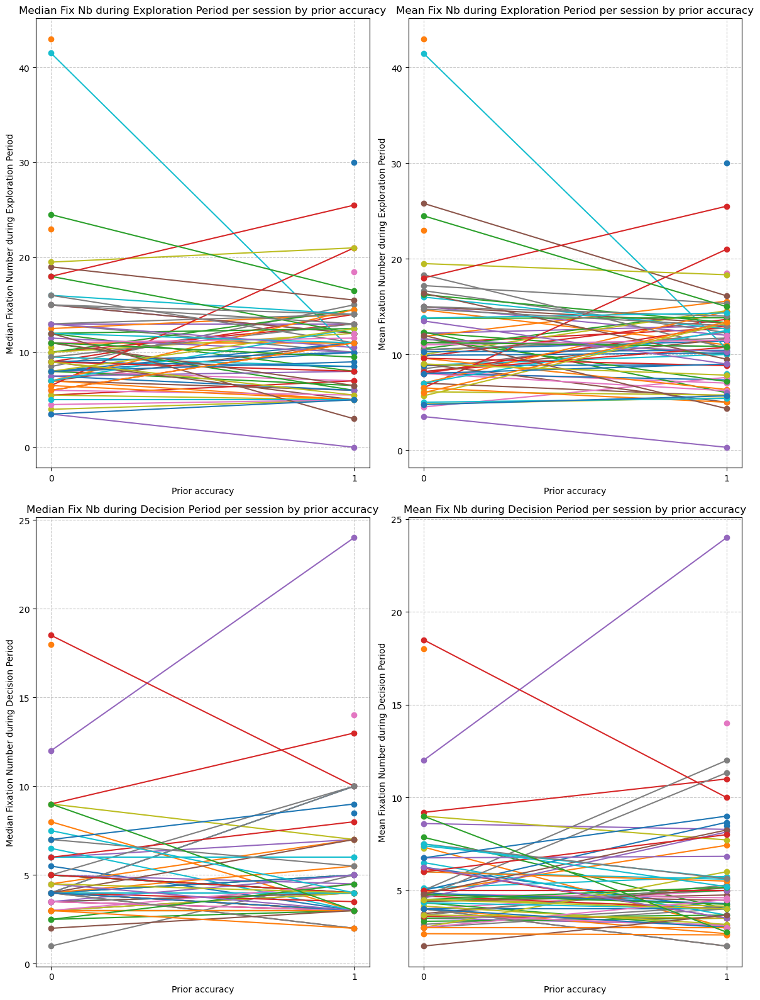

In [40]:
# Fixation number for both exploration and decision periods vs. prior accuracy per session

# Median Fixation Number during Exploration Period per session by prior accuracy 
FixNbExplorationPeriod_per_trial_prior_accuracy = data.groupby(['session', 'trialno', 'prior_accuracy'])['FixNbExplorationPeriod'].sum().reset_index()
FixNbExplorationPeriod_per_trial_prior_accuracy.dropna(inplace=True)
median_FixNbExplorationPeriod_per_session_prior_accuracy = FixNbExplorationPeriod_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['FixNbExplorationPeriod'].median().unstack()

plt.figure(figsize=(12, 16))

all_sessions = median_FixNbExplorationPeriod_per_session_prior_accuracy.index

plt.subplot(2, 2, 1)
for session in all_sessions:
    session_data = median_FixNbExplorationPeriod_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Median Fix Nb during Exploration Period per session by prior accuracy')
plt.xlabel('Prior accuracy')
plt.ylabel('Median Fixation Number during Exploration Period')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()

# Mean Fixation Number during Exploration Period  per session by prior accuracy
mean_FixNbExplorationPeriod_per_session_prior_accuracy = FixNbExplorationPeriod_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['FixNbExplorationPeriod'].mean().unstack()

plt.subplot(2, 2, 2)
for session in all_sessions:
    session_data = mean_FixNbExplorationPeriod_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Mean Fix Nb during Exploration Period per session by prior accuracy')
plt.xlabel('Prior accuracy')
plt.ylabel('Mean Fixation Number during Exploration Period')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()

# Median Fixation Number during Decision Period  per session by prior accuracy
FixNbDecisionPeriod_per_trial_prior_accuracy = data.groupby(['session', 'trialno', 'prior_accuracy'])['FixNbDecisionPeriod'].sum().reset_index()
FixNbDecisionPeriod_per_trial_prior_accuracy.dropna(inplace=True)
median_FixNbDecisionPeriod_per_session_prior_accuracy = FixNbDecisionPeriod_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['FixNbDecisionPeriod'].median().unstack()

plt.subplot(2, 2, 3)
for session in all_sessions:
    session_data = median_FixNbDecisionPeriod_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Median Fix Nb during Decision Period per session by prior accuracy')
plt.xlabel('Prior accuracy')
plt.ylabel('Median Fixation Number during Decision Period')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()

# Mean Fixation Number during Decision Period  per session by prior accuracy
mean_FixNbDecisionPeriod_per_session_prior_accuracy = FixNbDecisionPeriod_per_trial_prior_accuracy.groupby(['session', 'prior_accuracy'])['FixNbDecisionPeriod'].mean().unstack()

plt.subplot(2, 2, 4)
for session in all_sessions:
    session_data = mean_FixNbDecisionPeriod_per_session_prior_accuracy.loc[session].dropna()
    plt.plot(session_data.index, session_data, marker='o', linestyle='-', label=f'Session {session}')
plt.title('Mean Fix Nb during Decision Period per session by prior accuracy')
plt.xlabel('Prior accuracy')
plt.ylabel('Mean Fixation Number during Decision Period')
plt.xticks([0, 1]) 
plt.grid(True, linestyle='--', alpha=0.7)
#plt.legend()

plt.tight_layout()
plt.show()

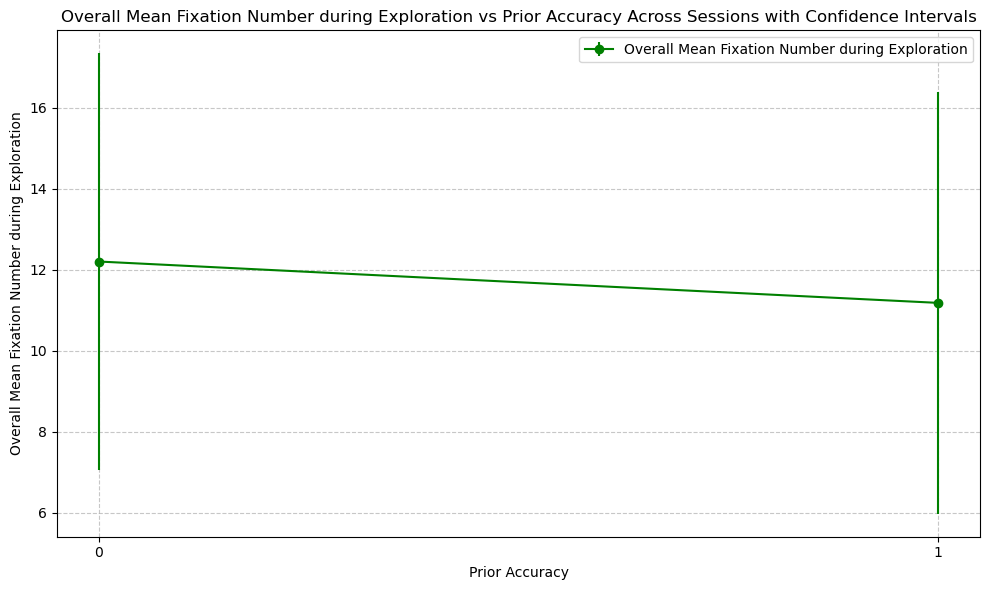

Overall Mean Fixation Number during Exploration per Prior Accuracy Across Sessions:
prior_accuracy
0.0    12.204963
1.0    11.184850
dtype: float64


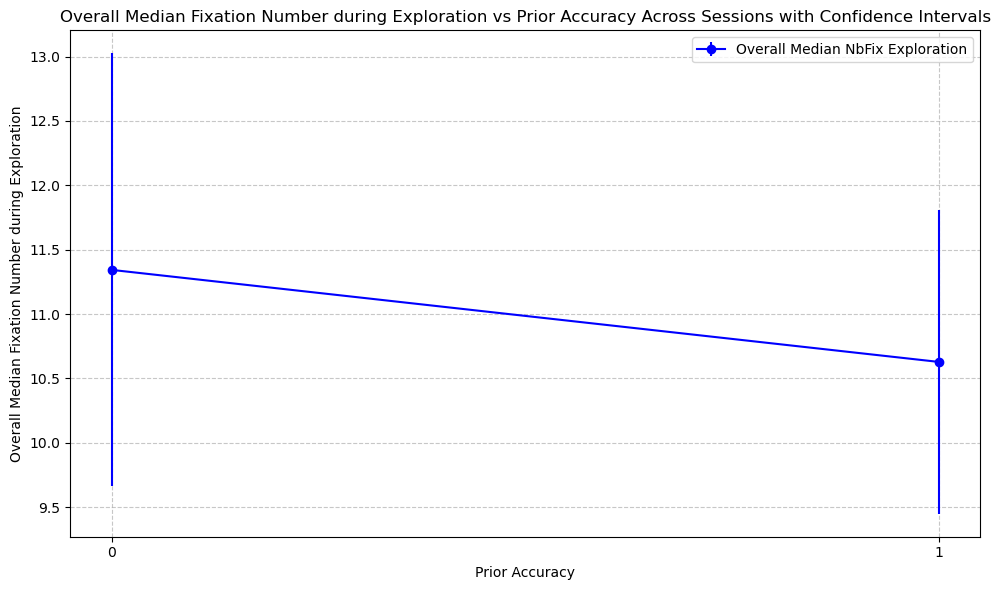


Overall Median Fixation Number during Exploration per Prior Accuracy Across Sessions:
prior_accuracy
0.0    11.343284
1.0    10.628571
dtype: float64


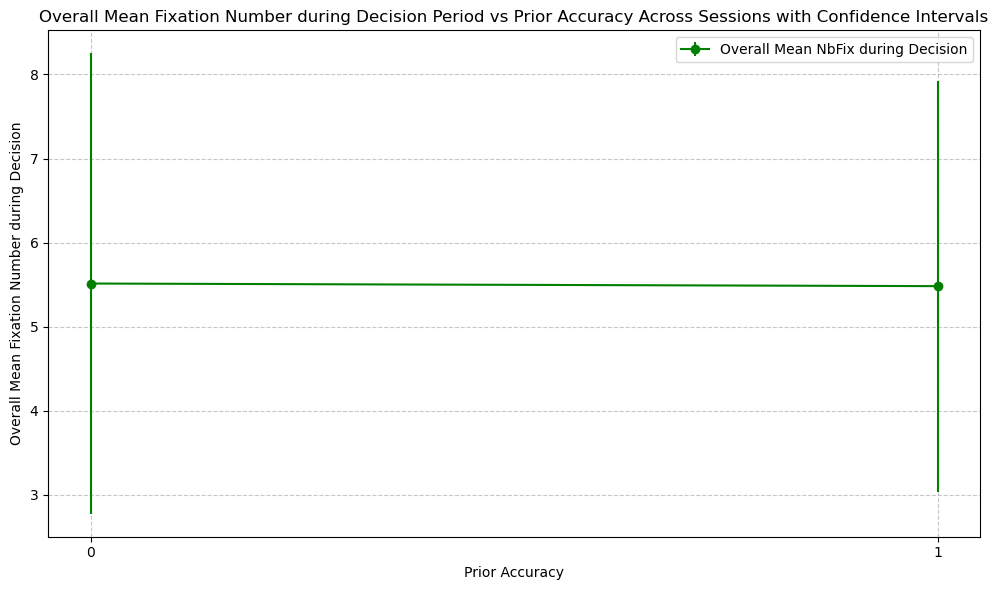

Overall Mean Fixation Number during Decision per Prior Accuracy Across Sessions:
prior_accuracy
0.0    5.514309
1.0    5.483209
dtype: float64


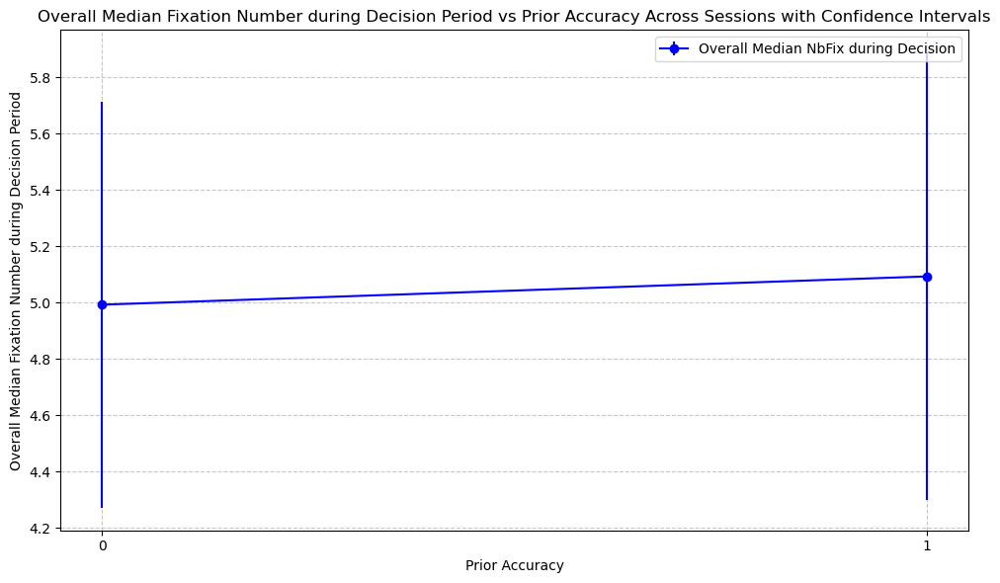


Overall Median Fixation Number during Decision Period per Prior Accuracy Across Sessions:
prior_accuracy
0.0    4.992537
1.0    5.092857
dtype: float64


In [42]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_exp_NbFix = data.groupby(['session', 'prior_accuracy'])['FixNbExplorationPeriod'].mean().unstack()  
session_median_exp_NbFix = data.groupby(['session', 'prior_accuracy'])['FixNbExplorationPeriod'].median().unstack()

overall_mean_exp_NbFix = session_mean_exp_NbFix.mean()
overall_median_exp_NbFix = session_median_exp_NbFix.mean()

session_std_exp_NbFix = data.groupby(['session', 'prior_accuracy'])['FixNbExplorationPeriod'].std().unstack()
session_count_exp_NbFix = data.groupby(['session', 'prior_accuracy'])['FixNbExplorationPeriod'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_exp_NbFix.mean() / np.sqrt(session_count_exp_NbFix.mean())

overall_conf_interval_median = 1.96 * session_median_exp_NbFix.std() / np.sqrt(session_median_exp_NbFix.count())

# Mean NbFix during exploration period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_exp_NbFix.index, overall_mean_exp_NbFix.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Fixation Number during Exploration')
plt.title('Overall Mean Fixation Number during Exploration vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Mean Fixation Number during Exploration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("Overall Mean Fixation Number during Exploration per Prior Accuracy Across Sessions:")
print(overall_mean_exp_NbFix)

# Median NbFix during exploration period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_exp_NbFix.index, overall_median_exp_NbFix.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median NbFix Exploration')
plt.title('Overall Median Fixation Number during Exploration vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Median Fixation Number during Exploration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("\nOverall Median Fixation Number during Exploration per Prior Accuracy Across Sessions:")
print(overall_median_exp_NbFix)

session_mean_dec_NbFix = data.groupby(['session', 'prior_accuracy'])['FixNbDecisionPeriod'].mean().unstack()
session_median_dec_NbFix = data.groupby(['session', 'prior_accuracy'])['FixNbDecisionPeriod'].median().unstack()

overall_mean_dec_NbFix = session_mean_dec_NbFix.mean()
overall_median_dec_NbFix = session_median_dec_NbFix.mean()

session_std_dec_NbFix = data.groupby(['session', 'prior_accuracy'])['FixNbDecisionPeriod'].std().unstack()
session_count_dec_NbFix = data.groupby(['session', 'prior_accuracy'])['FixNbDecisionPeriod'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_dec_NbFix.mean() / np.sqrt(session_count_dec_NbFix.mean())

overall_conf_interval_median = 1.96 * session_median_dec_NbFix.std() / np.sqrt(session_median_dec_NbFix.count())

# Mean NbFix during decision period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_dec_NbFix.index, overall_mean_dec_NbFix.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean NbFix during Decision')
plt.title('Overall Mean Fixation Number during Decision Period vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Mean Fixation Number during Decision')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("Overall Mean Fixation Number during Decision per Prior Accuracy Across Sessions:")
print(overall_mean_dec_NbFix)

# Median NbFix during decision period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_dec_NbFix.index, overall_median_dec_NbFix.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median NbFix during Decision')
plt.title('Overall Median Fixation Number during Decision Period vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Median Fixation Number during Decision Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("\nOverall Median Fixation Number during Decision Period per Prior Accuracy Across Sessions:")
print(overall_median_dec_NbFix)

### Number of fixations of bottom cards during exploration vs. Prior Accuracy

Shapiro-Wilk test for 0.0: p-value = 1.0932291023906352e-17
Shapiro-Wilk test for 1.0: p-value = 4.703889974466697e-15
Levene's test for homogeneity of variances: p-value = 0.9023480542547879
Kruskal-Wallis test:
H-statistic: 0.11441377615611509
p-value: 0.7351740045620423
Mean FixNbInBottomExploration by Prior Accuracy:
prior_accuracy
0.0    9.105611
1.0    8.832884
Name: FixNbInBottomExploration, dtype: float64
Median FixNbInBottomExploration by Prior Accuracy:
prior_accuracy
0.0    7.0
1.0    7.0
Name: FixNbInBottomExploration, dtype: float64
SEM FixNbInBottomExploration by Prior Accuracy:
prior_accuracy
0.0    0.433634
1.0    0.357517
Name: FixNbInBottomExploration, dtype: float64


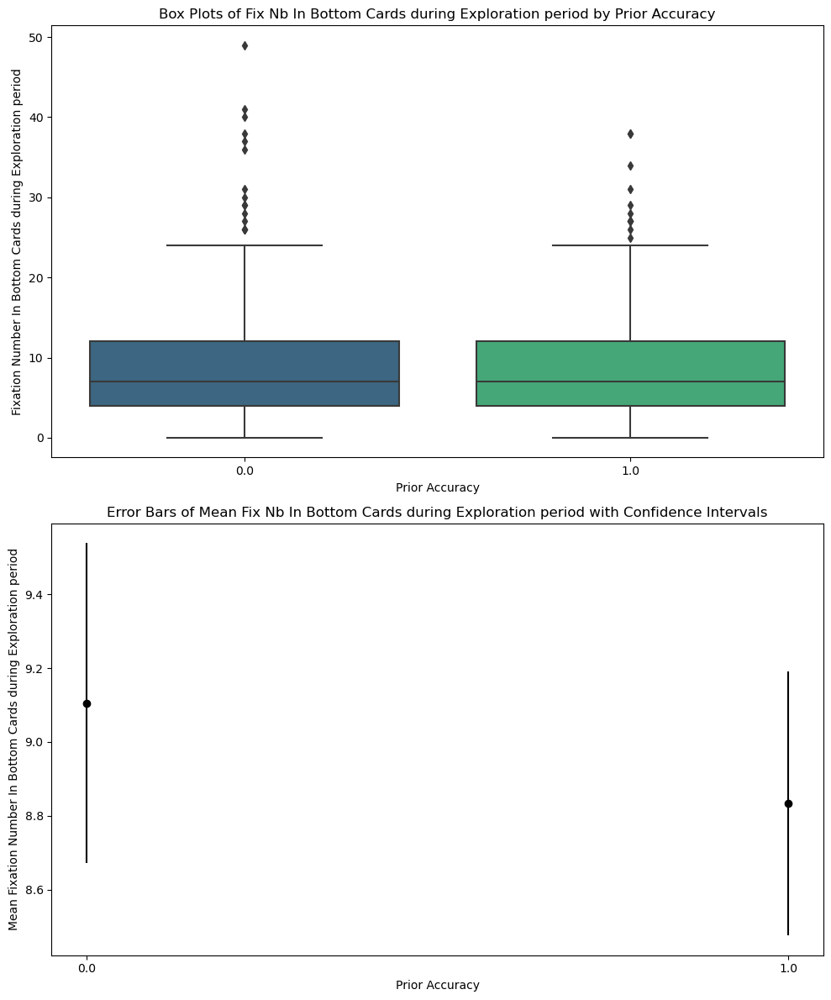

In [43]:
# Number of Fixations Bottom cards (exploration period) by Prior Accuracy

FixNbInBottomExploration_by_prior_accuracy = [data[data['prior_accuracy'] == level]['FixNbInBottomExploration'] for level in data['prior_accuracy'].unique()]
FixNbInBottomExploration_by_prior_accuracy = [group.dropna() for group in FixNbInBottomExploration_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['FixNbInBottomExploration']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*FixNbInBottomExploration_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*FixNbInBottomExploration_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of Fixation duration  of top card (decision period) by accuracy
mean_FixNbInBottomExploration_by_prior_accuracy = data.groupby('prior_accuracy')['FixNbInBottomExploration'].mean()
median_FixNbInBottomExploration_by_prior_accuracy = data.groupby('prior_accuracy')['FixNbInBottomExploration'].median()
sem_FixNbInBottomExploration_by_prior_accuracy = data.groupby('prior_accuracy')['FixNbInBottomExploration'].sem()
print("Mean FixNbInBottomExploration by Prior Accuracy:")
print(mean_FixNbInBottomExploration_by_prior_accuracy)
print("Median FixNbInBottomExploration by Prior Accuracy:")
print(median_FixNbInBottomExploration_by_prior_accuracy)
print("SEM FixNbInBottomExploration by Prior Accuracy:")
print(sem_FixNbInBottomExploration_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='FixNbInBottomExploration', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('Fixation Number In Bottom Cards during Exploration period')
ax1.set_title('Box Plots of Fix Nb In Bottom Cards during Exploration period by Prior Accuracy')

ax2.errorbar(np.arange(len(mean_FixNbInBottomExploration_by_prior_accuracy)), mean_FixNbInBottomExploration_by_prior_accuracy, yerr=sem_FixNbInBottomExploration_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Mean Fixation Number In Bottom Cards during Exploration period')
ax2.set_title('Error Bars of Mean Fix Nb In Bottom Cards during Exploration period with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_FixNbInBottomExploration_by_prior_accuracy)))
ax2.set_xticklabels(mean_FixNbInBottomExploration_by_prior_accuracy.index)

plt.tight_layout()
plt.show()

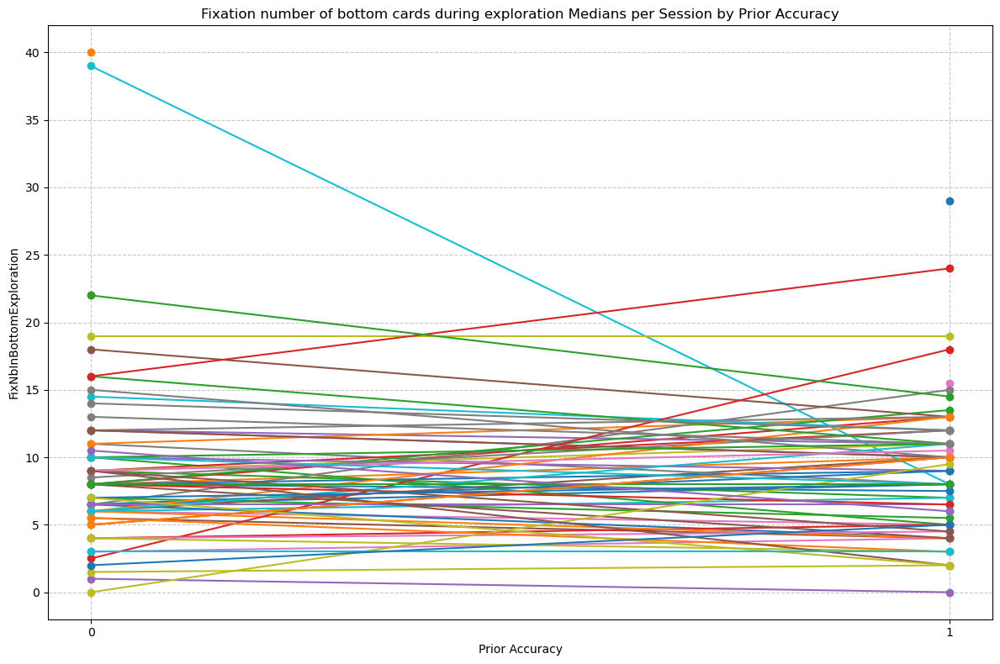

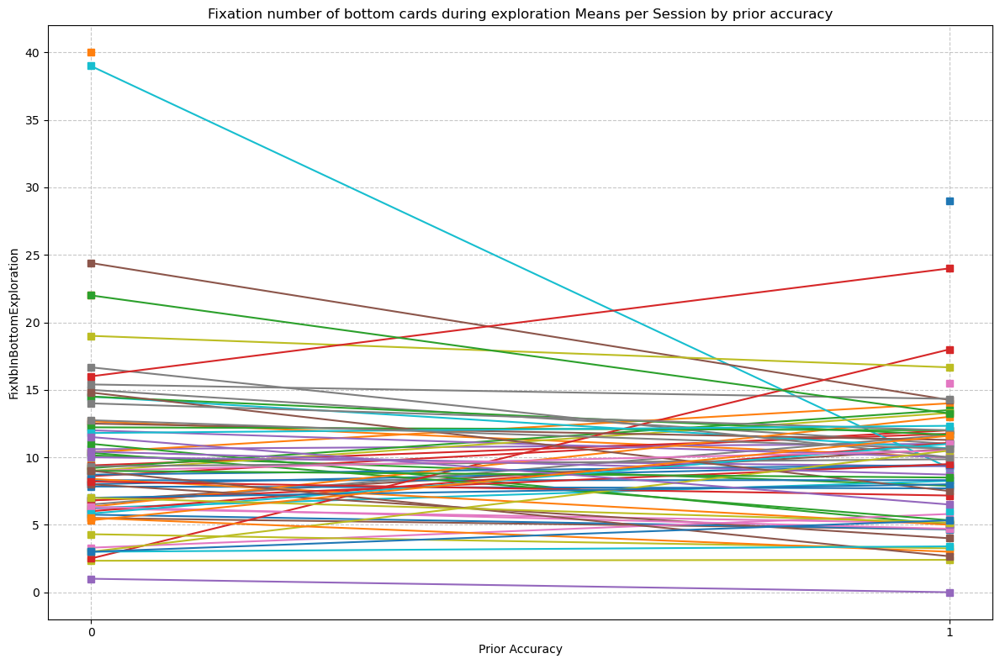

In [44]:
#Fixation Number of bottom cards during exploration per session by prior accuracy per session

#Medians
session_fix_exploration = data.groupby(['session', 'prior_accuracy'])['FixNbInBottomExploration'].median().unstack()

sessions = data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_prior_accuracy = session_fix_exploration.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        median_FixNbInBottomExploration_session = session_fix_exploration.loc[session][available_prior_accuracy]
        plt.plot(median_FixNbInBottomExploration_session.index, median_FixNbInBottomExploration_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Fixation number of bottom cards during exploration Medians per Session by Prior Accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('FixNbInBottomExploration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
#plt.legend()
plt.show()

session_fix_exploration_mean = data.groupby(['session', 'prior_accuracy'])['FixNbInBottomExploration'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_prior_accuracy = session_fix_exploration_mean.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        mean_FixNbInBottomExploration_session = session_fix_exploration_mean.loc[session][available_prior_accuracy]
        plt.plot(mean_FixNbInBottomExploration_session.index, mean_FixNbInBottomExploration_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation number of bottom cards during exploration Means per Session by prior accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('FixNbInBottomExploration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
#plt.legend()
plt.tight_layout()
plt.show()

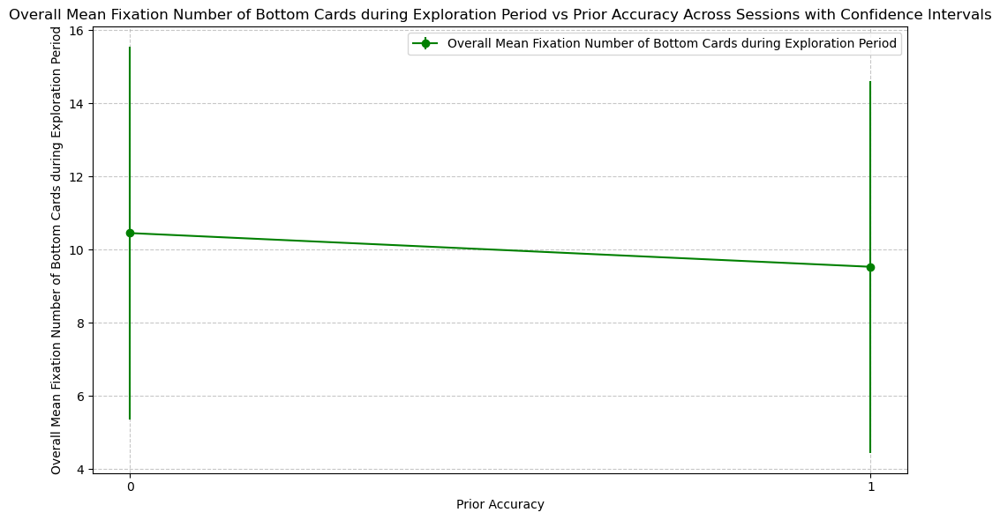

Overall Mean Fixation Number of Bottom Cards during Exploration Period per Prior Accuracy Across Sessions:
prior_accuracy
0.0    10.457030
1.0     9.535425
dtype: float64


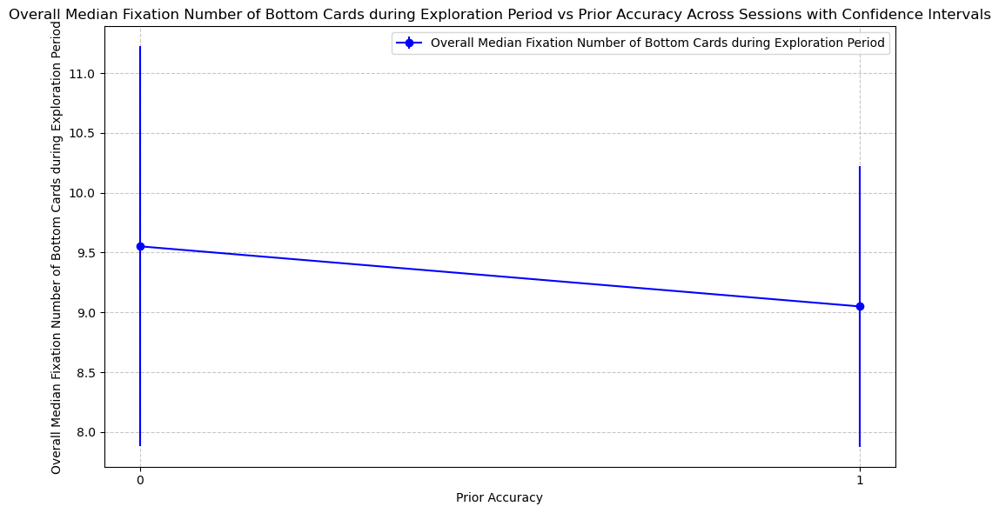


Overall Median Fixation Number of Bottom Cards during Exploration Period per Prior Accuracy Across Sessions:
prior_accuracy
0.0    9.552239
1.0    9.050000
dtype: float64


In [45]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_exp_FixNbInBottom = data.groupby(['session', 'prior_accuracy'])['FixNbInBottomExploration'].mean().unstack()
session_median_exp_FixNbInBottom = data.groupby(['session', 'prior_accuracy'])['FixNbInBottomExploration'].median().unstack()

overall_mean_exp_FixNbInBottom = session_mean_exp_FixNbInBottom.mean()
overall_median_exp_FixNbInBottom = session_median_exp_FixNbInBottom.mean()

session_std_exp_FixNbInBottom = data.groupby(['session', 'prior_accuracy'])['FixNbInBottomExploration'].std().unstack()
session_count_exp_FixNbInBottom = data.groupby(['session', 'prior_accuracy'])['FixNbInBottomExploration'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_exp_FixNbInBottom.mean() / np.sqrt(session_count_exp_FixNbInBottom.mean())

overall_conf_interval_median = 1.96 * session_median_exp_FixNbInBottom.std() / np.sqrt(session_median_exp_FixNbInBottom.count())

# Mean exploration fixation number of bottom cards across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_exp_FixNbInBottom.index, overall_mean_exp_FixNbInBottom.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Fixation Number of Bottom Cards during Exploration Period')
plt.title('Overall Mean Fixation Number of Bottom Cards during Exploration Period vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Mean Fixation Number of Bottom Cards during Exploration Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("Overall Mean Fixation Number of Bottom Cards during Exploration Period per Prior Accuracy Across Sessions:")
print(overall_mean_exp_FixNbInBottom)

# Median exploration fixation number of bottom cards across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_exp_FixNbInBottom.index, overall_median_exp_FixNbInBottom.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Fixation Number of Bottom Cards during Exploration Period')
plt.title('Overall Median Fixation Number of Bottom Cards during Exploration Period vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Median Fixation Number of Bottom Cards during Exploration Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("\nOverall Median Fixation Number of Bottom Cards during Exploration Period per Prior Accuracy Across Sessions:")
print(overall_median_exp_FixNbInBottom)

### Number of fixations of top card (decision period) vs. Prior Accuracy

Shapiro-Wilk test for 0.0: p-value = 4.791449894080889e-19
Shapiro-Wilk test for 1.0: p-value = 6.305270065835805e-24
Levene's test for homogeneity of variances: p-value = 0.7812281746275616
Kruskal-Wallis test:
H-statistic: 0.3830219474858279
p-value: 0.5359903620713993
Mean FixNbInTDecision by Prior Accuracy:
prior_accuracy
0.0    3.719472
1.0    3.692722
Name: FixNbInTDecision, dtype: float64
SEM FixNbInTDecision by Prior Accuracy:
prior_accuracy
0.0    0.188377
1.0    0.185293
Name: FixNbInTDecision, dtype: float64


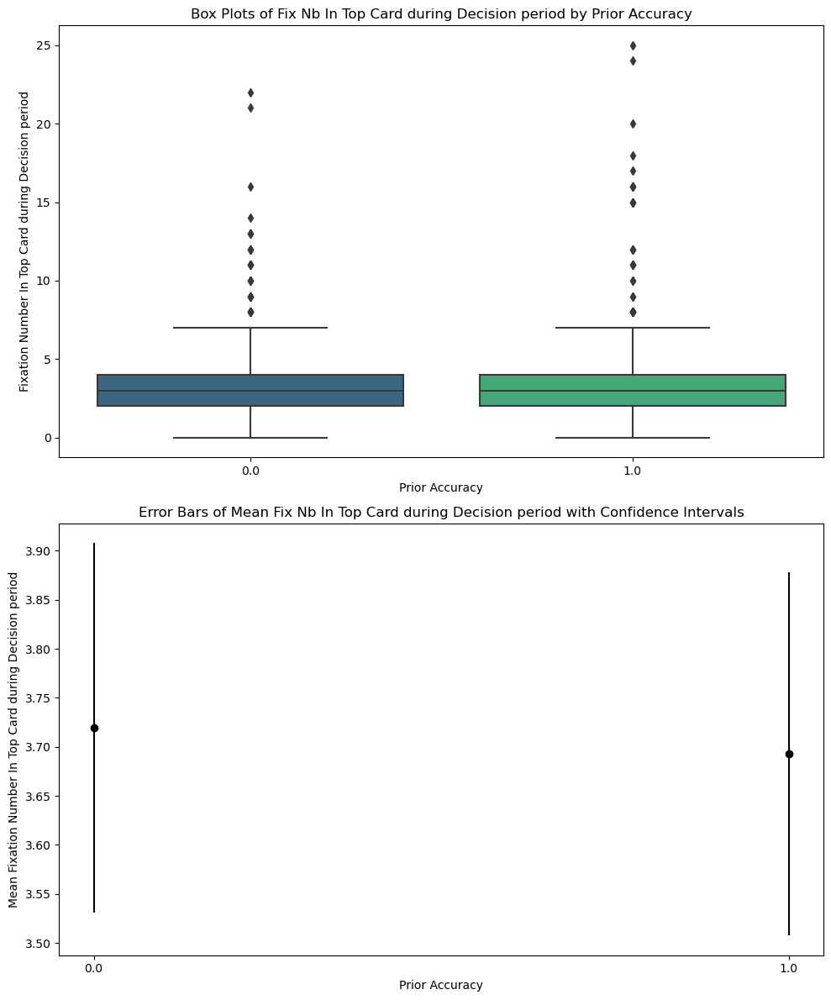

In [46]:
# Number of Fixations Top Card (decision period) by Prior Accuracy

FixNbInTDecision_by_prior_accuracy = [data[data['prior_accuracy'] == level]['FixNbInTDecision'] for level in data['prior_accuracy'].unique()]
FixNbInTDecision_by_prior_accuracy = [group.dropna() for group in FixNbInTDecision_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['FixNbInTDecision']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*FixNbInTDecision_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*FixNbInTDecision_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of Fixation duration  of top card (decision period) by accuracy
mean_FixNbInTDecision_by_prior_accuracy = data.groupby('prior_accuracy')['FixNbInTDecision'].mean()
sem_FixNbInTDecision_by_prior_accuracy = data.groupby('prior_accuracy')['FixNbInTDecision'].sem()
print("Mean FixNbInTDecision by Prior Accuracy:")
print(mean_FixNbInTDecision_by_prior_accuracy)
print("SEM FixNbInTDecision by Prior Accuracy:")
print(sem_FixNbInTDecision_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='FixNbInTDecision', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('Fixation Number In Top Card during Decision period')
ax1.set_title('Box Plots of Fix Nb In Top Card during Decision period by Prior Accuracy')

ax2.errorbar(np.arange(len(mean_FixNbInTDecision_by_prior_accuracy)), mean_FixNbInTDecision_by_prior_accuracy, yerr=sem_FixNbInTDecision_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Mean Fixation Number In Top Card during Decision period')
ax2.set_title('Error Bars of Mean Fix Nb In Top Card during Decision period with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_FixNbInTDecision_by_prior_accuracy)))
ax2.set_xticklabels(mean_FixNbInTDecision_by_prior_accuracy.index)

plt.tight_layout()
plt.show()

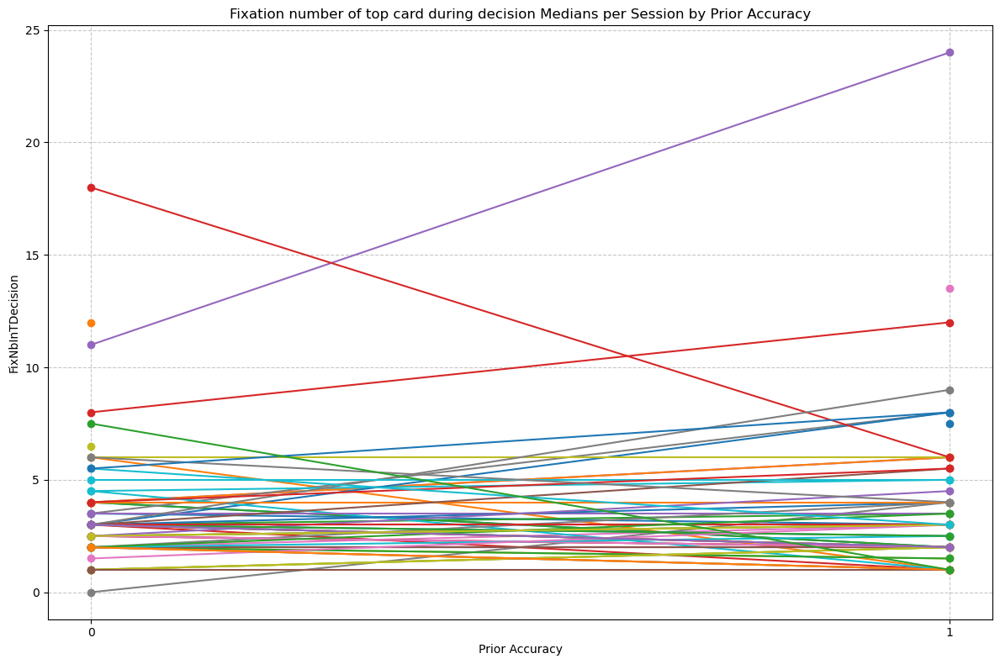

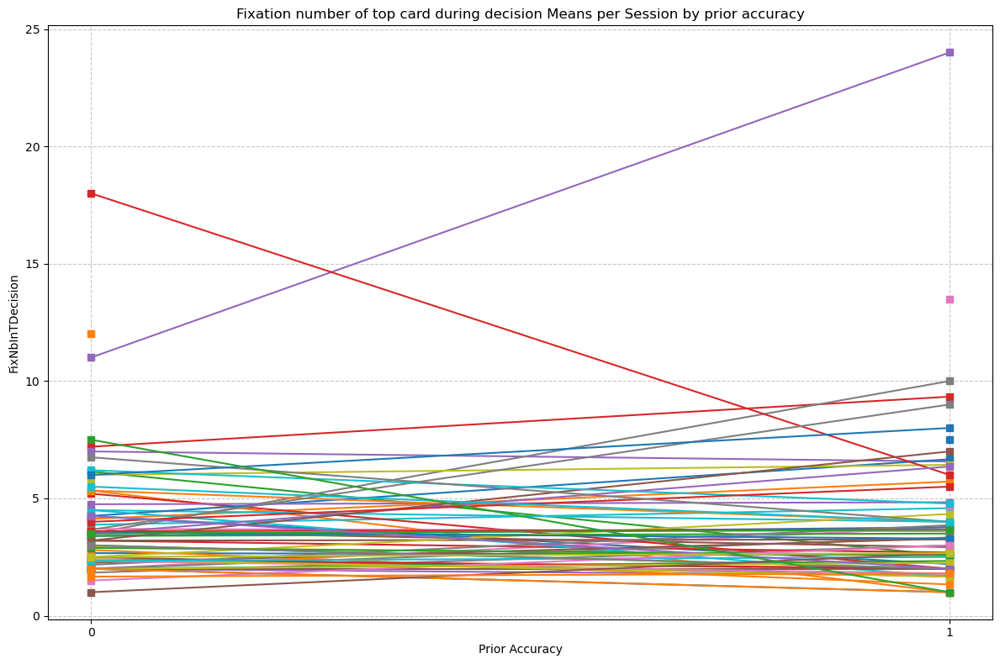

In [47]:
#Fixation Number of top card during decision per session by prior accuracy per session

#Medians
session_fix_decision = data.groupby(['session', 'prior_accuracy'])['FixNbInTDecision'].median().unstack()

sessions = data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_prior_accuracy = session_fix_decision.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        median_FixNbInTDecision_session = session_fix_decision.loc[session][available_prior_accuracy]
        plt.plot(median_FixNbInTDecision_session.index, median_FixNbInTDecision_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Fixation number of top card during decision Medians per Session by Prior Accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('FixNbInTDecision')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
#plt.legend()
plt.show()

session_fix_decision_mean = data.groupby(['session', 'prior_accuracy'])['FixNbInTDecision'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_prior_accuracy = session_fix_decision_mean.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        mean_FixNbInTDecision_session = session_fix_decision_mean.loc[session][available_prior_accuracy]
        plt.plot(mean_FixNbInTDecision_session.index, mean_FixNbInTDecision_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation number of top card during decision Means per Session by prior accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('FixNbInTDecision')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
#plt.legend()
plt.tight_layout()
plt.show()

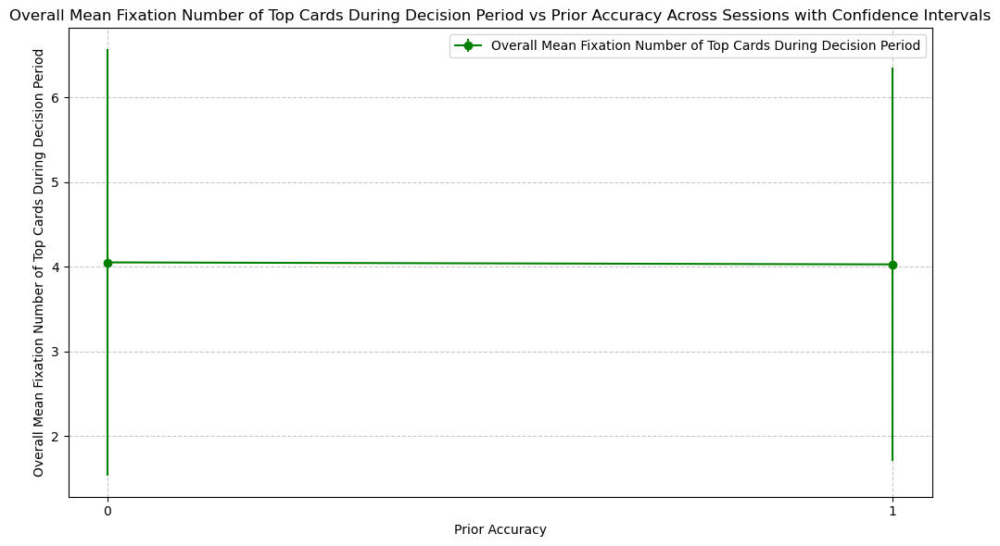

Overall Mean Fixation Number of Top Cards During Decision Period per Prior Accuracy Across Sessions:
prior_accuracy
0.0    4.051291
1.0    4.027524
dtype: float64


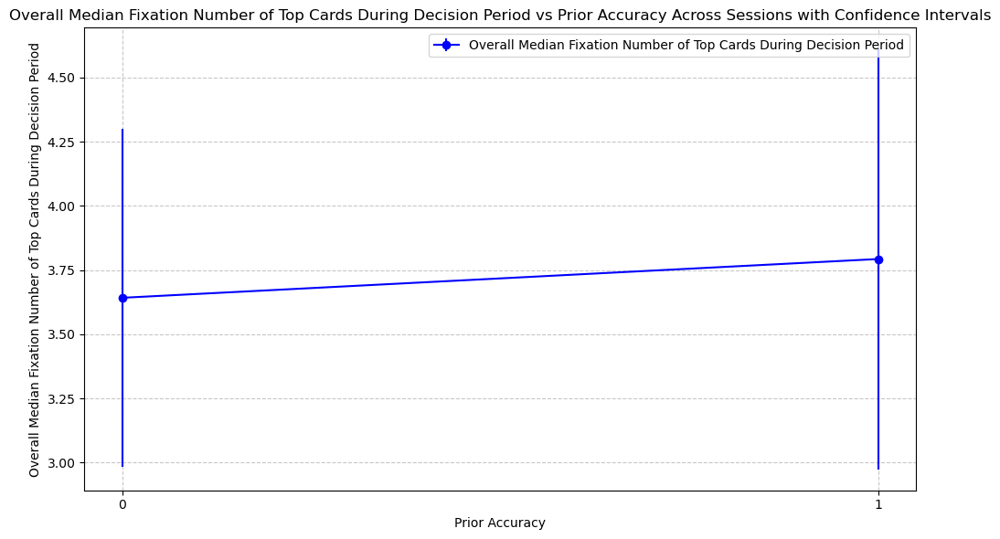


Overall Median Fixation Number of Top Cards During Decision Period per Prior Accuracy Across Sessions:
prior_accuracy
0.0    3.641791
1.0    3.792857
dtype: float64


In [48]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_dec_FixNbInT = data.groupby(['session', 'prior_accuracy'])['FixNbInTDecision'].mean().unstack()
session_median_dec_FixNbInT = data.groupby(['session', 'prior_accuracy'])['FixNbInTDecision'].median().unstack()

overall_mean_dec_FixNbInT = session_mean_dec_FixNbInT.mean()
overall_median_dec_FixNbInT = session_median_dec_FixNbInT.mean()

session_std_dec_FixNbInT = data.groupby(['session', 'prior_accuracy'])['FixNbInTDecision'].std().unstack()
session_count_dec_FixNbInT = data.groupby(['session', 'prior_accuracy'])['FixNbInTDecision'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_dec_FixNbInT.mean() / np.sqrt(session_count_dec_FixNbInT.mean())

overall_conf_interval_median = 1.96 * session_median_dec_FixNbInT.std() / np.sqrt(session_median_dec_FixNbInT.count())

# Mean FixNbInT during decision period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_dec_FixNbInT.index, overall_mean_dec_FixNbInT.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Fixation Number of Top Cards During Decision Period')
plt.title('Overall Mean Fixation Number of Top Cards During Decision Period vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Mean Fixation Number of Top Cards During Decision Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("Overall Mean Fixation Number of Top Cards During Decision Period per Prior Accuracy Across Sessions:")
print(overall_mean_dec_FixNbInT)

# Median FixNbInT during decision period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_dec_FixNbInT.index, overall_median_dec_FixNbInT.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Fixation Number of Top Cards During Decision Period')
plt.title('Overall Median Fixation Number of Top Cards During Decision Period vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Median Fixation Number of Top Cards During Decision Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("\nOverall Median Fixation Number of Top Cards During Decision Period per Prior Accuracy Across Sessions:")
print(overall_median_dec_FixNbInT)

### Fixation Duration of Top Card (Decision Period) vs. Prior Accuracy

Shapiro-Wilk test for 0.0: p-value = 2.721819797216935e-18
Shapiro-Wilk test for 1.0: p-value = 2.2411559704911053e-22
Levene's test for homogeneity of variances: p-value = 0.9509792080711499
Kruskal-Wallis test:
H-statistic: 0.2634286324765764
p-value: 0.6077743627611389
Mean FixDurInTDecision by Prior Accuracy:
prior_accuracy
0.0    1317.689769
1.0    1299.412399
Name: FixDurInTDecision, dtype: float64
Median FixDurInTDecision by Prior Accuracy:
prior_accuracy
0.0    926.0
1.0    938.0
Name: FixDurInTDecision, dtype: float64
SEM FixDurInTDecision by Prior Accuracy:
prior_accuracy
0.0    69.424243
1.0    66.152976
Name: FixDurInTDecision, dtype: float64


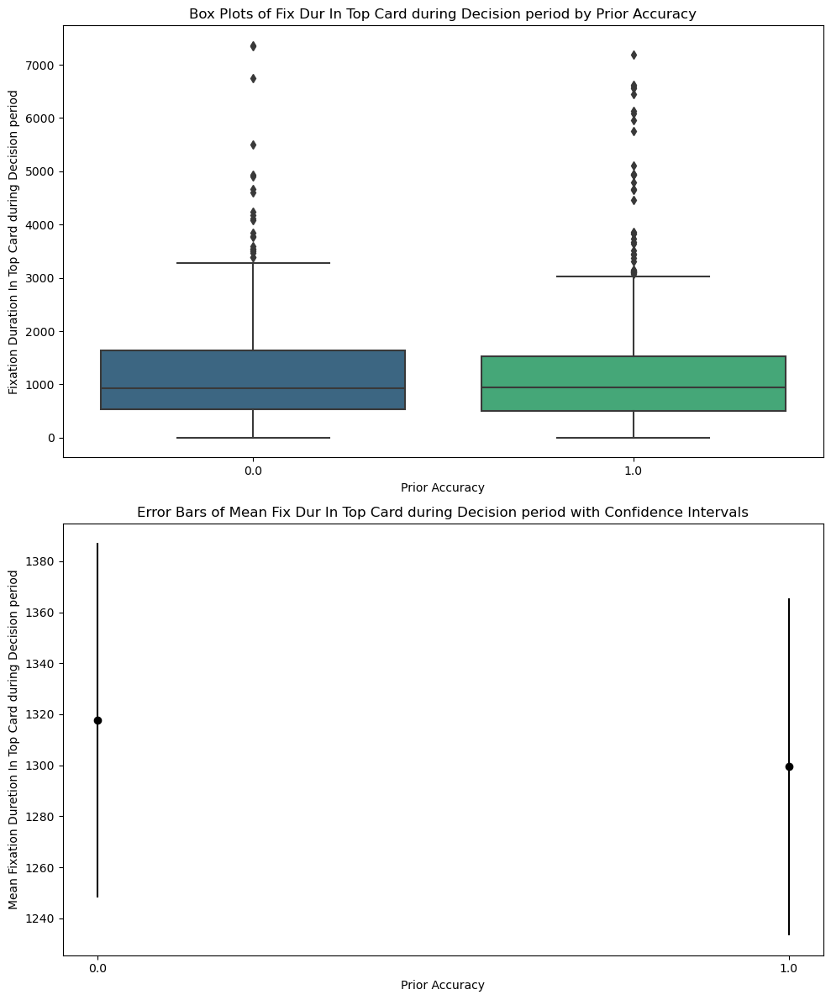

In [49]:
#Fixation Duration Top Card (decision period) by Prior Accuracy

FixDurInTDecision_by_prior_accuracy = [data[data['prior_accuracy'] == level]['FixDurInTDecision'] for level in data['prior_accuracy'].unique()]
FixDurInTDecision_by_prior_accuracy = [group.dropna() for group in FixDurInTDecision_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['FixDurInTDecision']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*FixDurInTDecision_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*FixDurInTDecision_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of Fixation duration  of top card (decision period) by accuracy
mean_FixDurInTDecision_by_prior_accuracy = data.groupby('prior_accuracy')['FixDurInTDecision'].mean()
median_FixDurInTDecision_by_prior_accuracy = data.groupby('prior_accuracy')['FixDurInTDecision'].median()
sem_FixDurInTDecision_by_prior_accuracy = data.groupby('prior_accuracy')['FixDurInTDecision'].sem()
print("Mean FixDurInTDecision by Prior Accuracy:")
print(mean_FixDurInTDecision_by_prior_accuracy)
print("Median FixDurInTDecision by Prior Accuracy:")
print(median_FixDurInTDecision_by_prior_accuracy)
print("SEM FixDurInTDecision by Prior Accuracy:")
print(sem_FixDurInTDecision_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='FixDurInTDecision', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('Fixation Duration In Top Card during Decision period')
ax1.set_title('Box Plots of Fix Dur In Top Card during Decision period by Prior Accuracy')

ax2.errorbar(np.arange(len(mean_FixDurInTDecision_by_prior_accuracy)), mean_FixDurInTDecision_by_prior_accuracy, yerr=sem_FixDurInTDecision_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Mean Fixation Duretion In Top Card during Decision period')
ax2.set_title('Error Bars of Mean Fix Dur In Top Card during Decision period with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_LookDurInTDecision_by_prior_accuracy)))
ax2.set_xticklabels(mean_LookDurInTDecision_by_prior_accuracy.index)

plt.tight_layout()
plt.show()

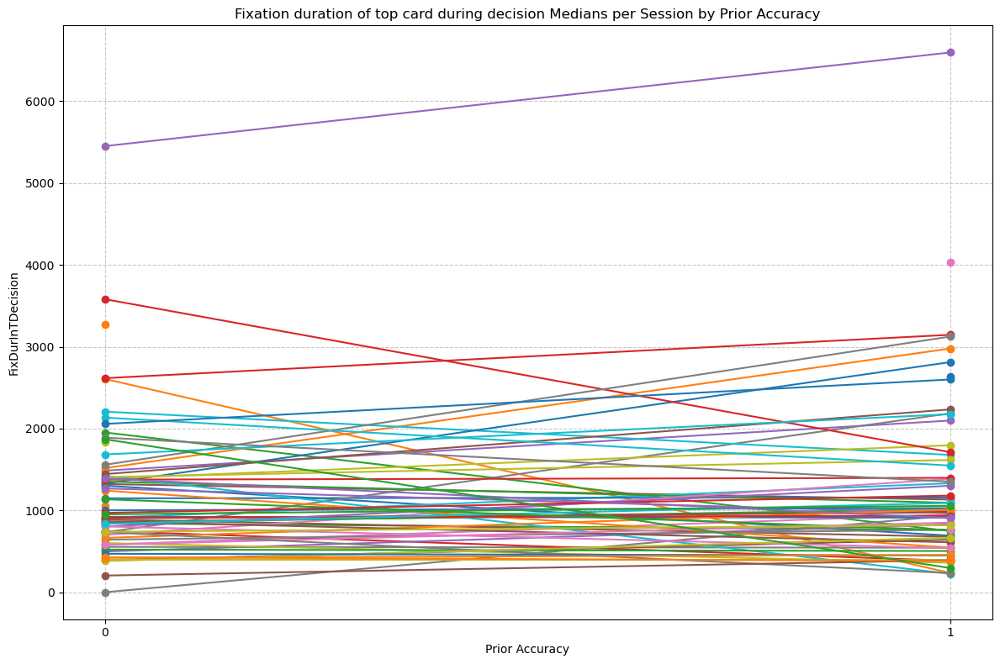

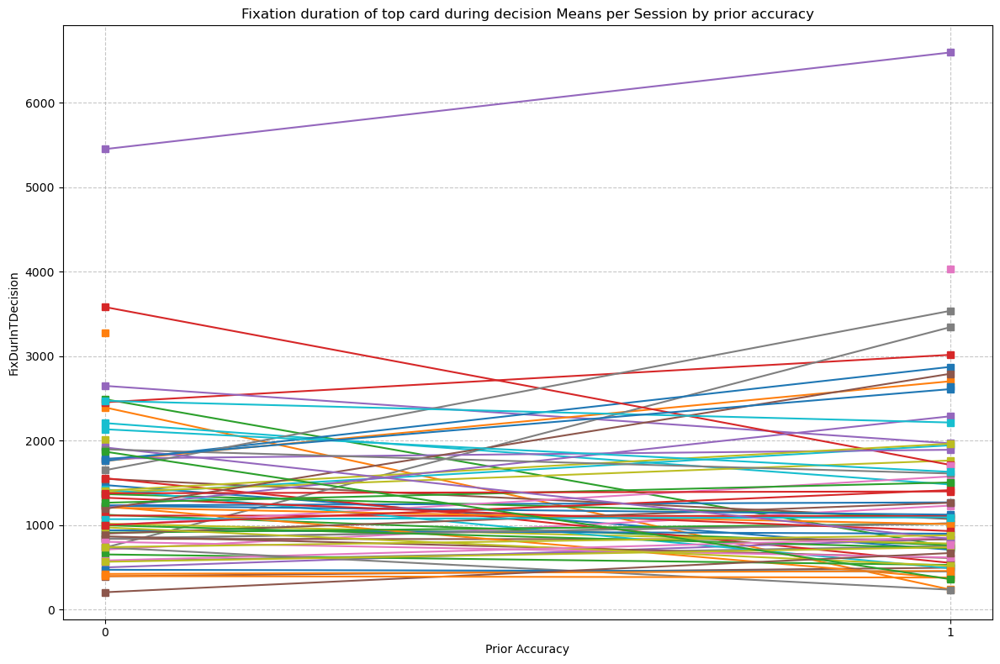

In [50]:
#Fixation duration of top card during decision per session by prior accuracy per session

#Medians
session_fix_decision = data.groupby(['session', 'prior_accuracy'])['FixDurInTDecision'].median().unstack()

sessions = data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_prior_accuracy = session_fix_decision.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        median_FixDurInTDecision_session = session_fix_decision.loc[session][available_prior_accuracy]
        plt.plot(median_FixDurInTDecision_session.index, median_FixDurInTDecision_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Fixation duration of top card during decision Medians per Session by Prior Accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('FixDurInTDecision')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
#plt.legend()
plt.show()

session_fix_decision_mean = data.groupby(['session', 'prior_accuracy'])['FixDurInTDecision'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_prior_accuracy = session_fix_decision_mean.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        mean_FixDurInTDecision_session = session_fix_decision_mean.loc[session][available_prior_accuracy]
        plt.plot(mean_FixDurInTDecision_session.index, mean_FixDurInTDecision_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation duration of top card during decision Means per Session by prior accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('FixDurInTDecision')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
#plt.legend()
plt.tight_layout()
plt.show()

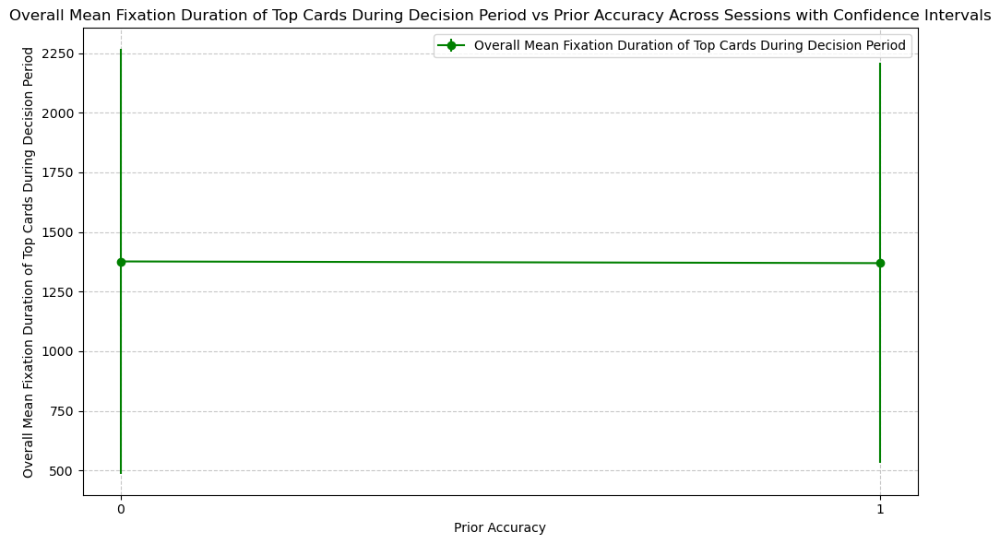

Overall Mean Fixation Duration of Top Cards During Decision Period per Prior Accuracy Across Sessions:
prior_accuracy
0.0    1376.445143
1.0    1369.319389
dtype: float64


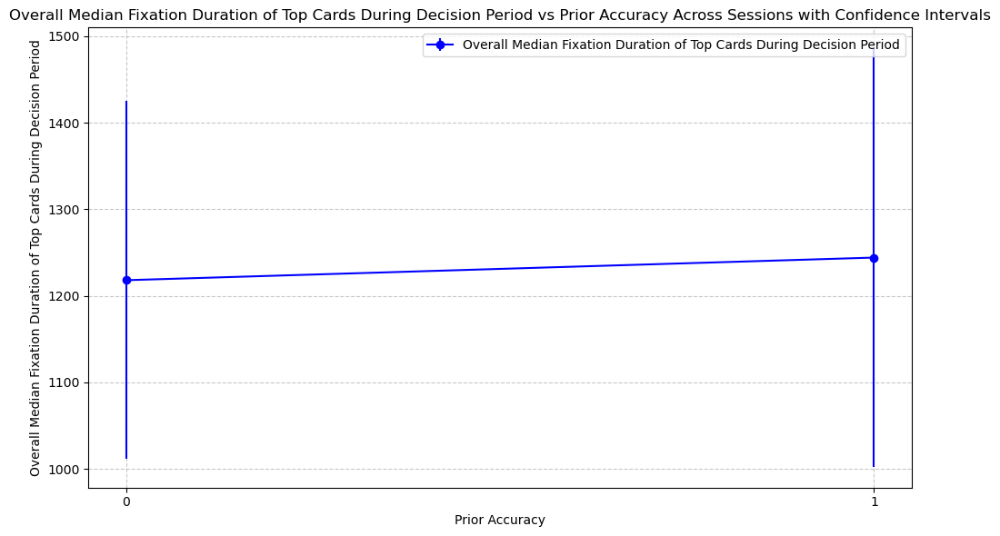


Overall Median Fixation Duration of Top Cards During Decision Period per Prior Accuracy Across Sessions:
prior_accuracy
0.0    1218.000000
1.0    1244.142857
dtype: float64


In [51]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_dec_FixTotDurInT = data.groupby(['session', 'prior_accuracy'])['FixDurInTDecision'].mean().unstack()
session_median_dec_FixTotDurInT = data.groupby(['session', 'prior_accuracy'])['FixDurInTDecision'].median().unstack()

overall_mean_dec_FixTotDurInT = session_mean_dec_FixTotDurInT.mean()
overall_median_dec_FixTotDurInT = session_median_dec_FixTotDurInT.mean()

session_std_dec_FixTotDurInT = data.groupby(['session', 'prior_accuracy'])['FixDurInTDecision'].std().unstack()
session_count_dec_FixTotDurInT = data.groupby(['session', 'prior_accuracy'])['FixDurInTDecision'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_dec_FixTotDurInT.mean() / np.sqrt(session_count_dec_FixTotDurInT.mean())

overall_conf_interval_median = 1.96 * session_median_dec_FixTotDurInT.std() / np.sqrt(session_median_dec_FixTotDurInT.count())

# Mean FixTotDurInT during decision period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_dec_FixTotDurInT.index, overall_mean_dec_FixTotDurInT.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Fixation Duration of Top Cards During Decision Period')
plt.title('Overall Mean Fixation Duration of Top Cards During Decision Period vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Mean Fixation Duration of Top Cards During Decision Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("Overall Mean Fixation Duration of Top Cards During Decision Period per Prior Accuracy Across Sessions:")
print(overall_mean_dec_FixTotDurInT)

# Median FixTotDurInT during decision period across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_dec_FixTotDurInT.index, overall_median_dec_FixTotDurInT.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Fixation Duration of Top Cards During Decision Period')
plt.title('Overall Median Fixation Duration of Top Cards During Decision Period vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Median Fixation Duration of Top Cards During Decision Period')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("\nOverall Median Fixation Duration of Top Cards During Decision Period per Prior Accuracy Across Sessions:")
print(overall_median_dec_FixTotDurInT)

### Fixation Duration of Bottom Cards (Exploration Period) vs. Prior Accuracy

Shapiro-Wilk test for 0.0: p-value = 5.0623591540501145e-17
Shapiro-Wilk test for 1.0: p-value = 2.0497656944437844e-14
Levene's test for homogeneity of variances: p-value = 0.8905597554380676
Kruskal-Wallis test:
H-statistic: 0.10109354176813559
p-value: 0.7505212668634527
Mean Fixation Duration during Exploration of Bottom cards by Prior Accuracy:
prior_accuracy
0.0    3084.686469
1.0    2992.544474
Name: durfixBottomExploration, dtype: float64
Median Fixation Duration during Exploration of Bottom cards by Prior Accuracy:
prior_accuracy
0.0    2288.0
1.0    2376.0
Name: durfixBottomExploration, dtype: float64
SEM Fixation Duration during Exploration of Bottom Cards by Prior Accuracy:
prior_accuracy
0.0    150.176656
1.0    124.356230
Name: durfixBottomExploration, dtype: float64


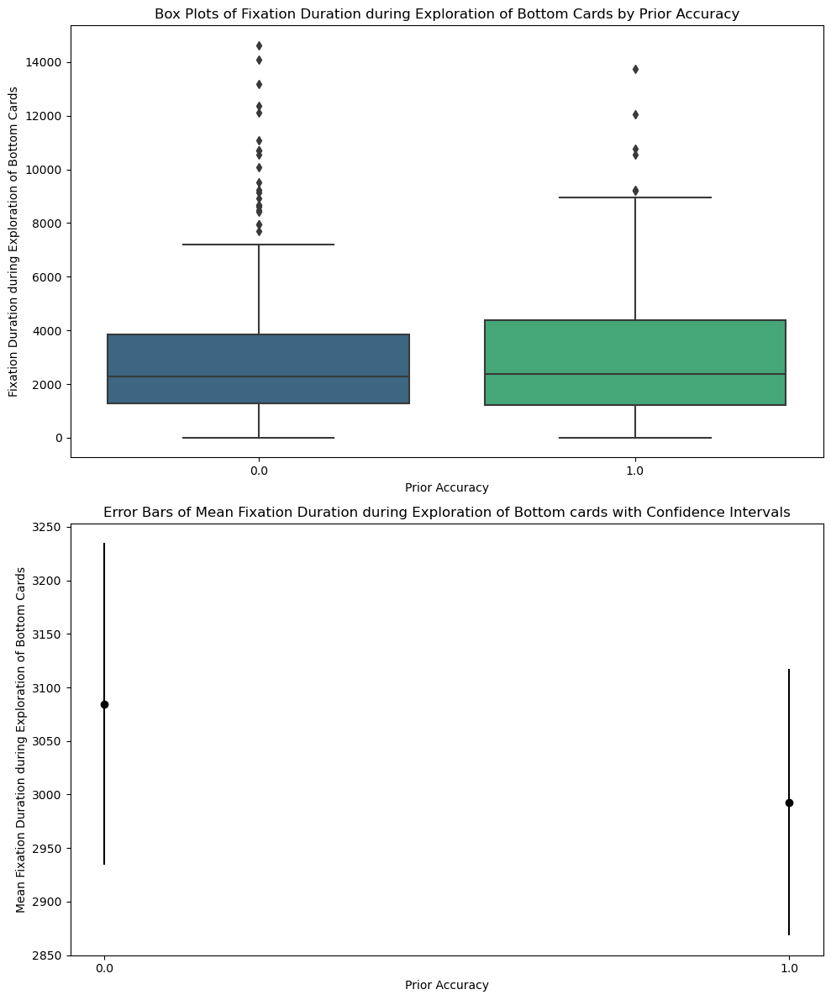

In [52]:
# Fixation Duration of Bottom Cards (exploration Period) vs prior accuracy

durfixBottomExploration_by_prior_accuracy = [data[data['prior_accuracy'] == level]['durfixBottomExploration'] for level in data['prior_accuracy'].unique()]
durfixBottomExploration_by_prior_accuracy = [group.dropna() for group in durfixBottomExploration_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['durfixBottomExploration']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*durfixBottomExploration_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*durfixBottomExploration_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of exploration of bottom cards fixation duration by prior accuracy
mean_fixduration_by_prior_accuracy = data.groupby('prior_accuracy')['durfixBottomExploration'].mean()
median_fixduration_by_prior_accuracy = data.groupby('prior_accuracy')['durfixBottomExploration'].median()
sem_fixduration_by_prior_accuracy = data.groupby('prior_accuracy')['durfixBottomExploration'].sem()
print("Mean Fixation Duration during Exploration of Bottom cards by Prior Accuracy:")
print(mean_fixduration_by_prior_accuracy)
print("Median Fixation Duration during Exploration of Bottom cards by Prior Accuracy:")
print(median_fixduration_by_prior_accuracy)
print("SEM Fixation Duration during Exploration of Bottom Cards by Prior Accuracy:")
print(sem_fixduration_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='durfixBottomExploration', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('Fixation Duration during Exploration of Bottom Cards')
ax1.set_title('Box Plots of Fixation Duration during Exploration of Bottom Cards by Prior Accuracy')

ax2.errorbar(np.arange(len(mean_fixduration_by_prior_accuracy)), mean_fixduration_by_prior_accuracy, yerr=sem_fixduration_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Mean Fixation Duration during Exploration of Bottom Cards')
ax2.set_title('Error Bars of Mean Fixation Duration during Exploration of Bottom cards with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_fixduration_by_prior_accuracy)))
ax2.set_xticklabels(mean_fixduration_by_prior_accuracy.index)

plt.tight_layout()
plt.show()

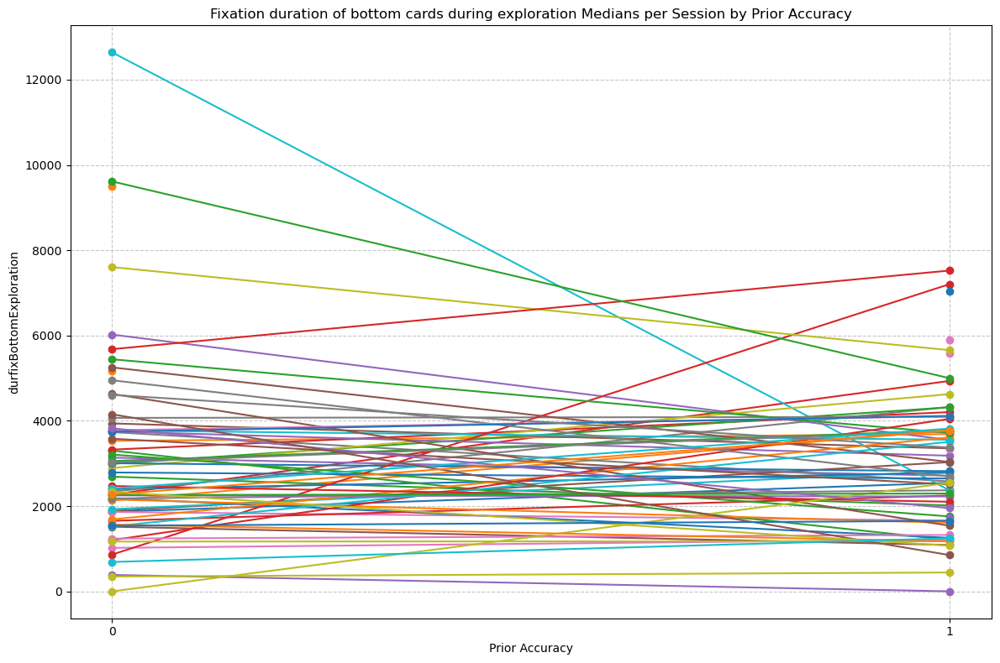

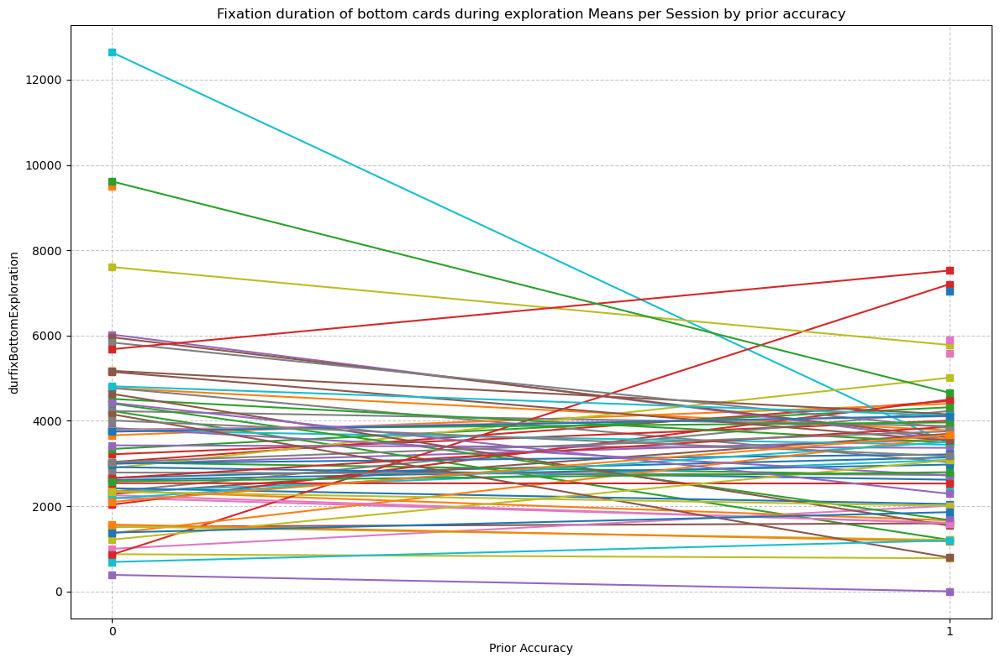

In [53]:
#Fixation duration of bottom cards during exploration per session by prior accuracy per session

#Medians
session_fix_exploration = data.groupby(['session', 'prior_accuracy'])['durfixBottomExploration'].median().unstack()

sessions = data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_prior_accuracy = session_fix_exploration.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        median_durfixBottom_session = session_fix_exploration.loc[session][available_prior_accuracy]
        plt.plot(median_durfixBottom_session.index, median_durfixBottom_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Fixation duration of bottom cards during exploration Medians per Session by Prior Accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('durfixBottomExploration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
#plt.legend()
plt.show()

session_fix_exploration_mean = data.groupby(['session', 'prior_accuracy'])['durfixBottomExploration'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_prior_accuracy = session_fix_exploration_mean.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        mean_durfixBottom_session = session_fix_exploration_mean.loc[session][available_prior_accuracy]
        plt.plot(mean_durfixBottom_session.index, mean_durfixBottom_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Fixation duration of bottom cards during exploration Means per Session by prior accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('durfixBottomExploration')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
#plt.legend()
plt.tight_layout()
plt.show()

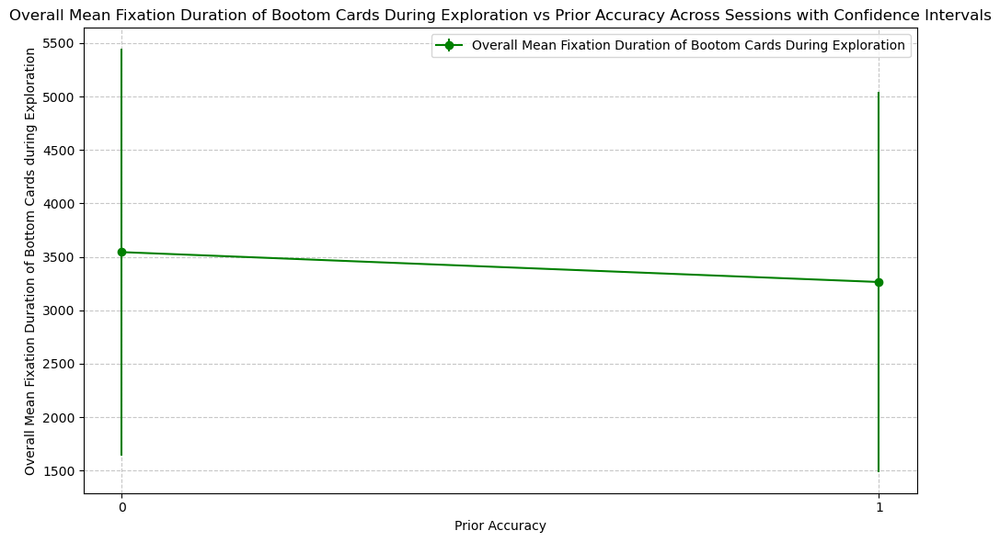

Overall Mean Fixation Duration of Bootom Cards During Exploration per Prior Accuracy Across Sessions:
prior_accuracy
0.0    3927.881142
1.0    3617.364656
dtype: float64


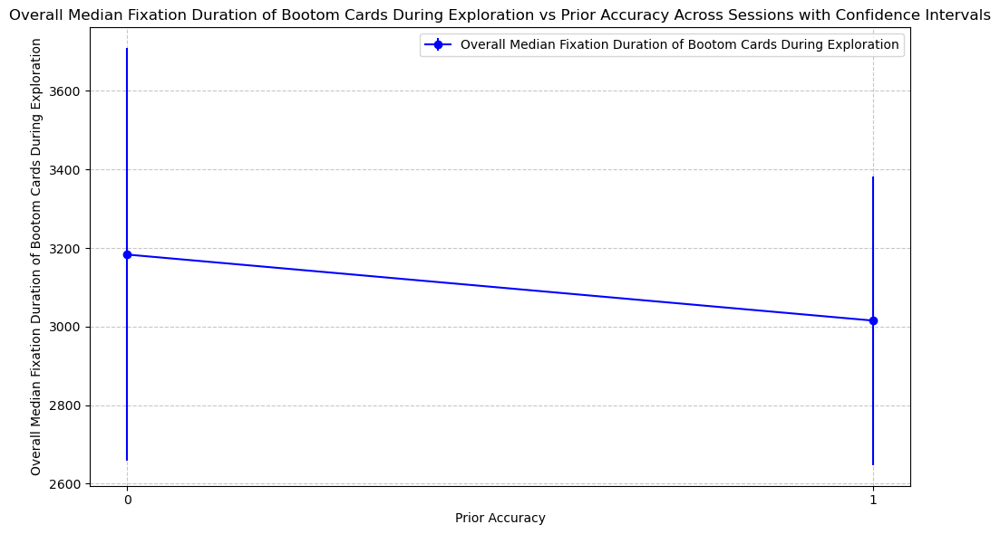


Overall Median Fixation Duration of Bootom Cards During Exploration per Prior Accuracy Across Sessions:
prior_accuracy
0.0    3183.447761
1.0    3015.314286
dtype: float64


In [54]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_exp_durfixBottom = data.groupby(['session', 'prior_accuracy'])['durfixBottomExploration'].mean().unstack()
session_median_exp_durfixBottom = data.groupby(['session', 'prior_accuracy'])['durfixBottomExploration'].median().unstack()

overall_mean_exp_durfixBottom = session_mean_exp_durfixBottom.mean()
overall_median_exp_durfixBottom = session_median_exp_durfixBottom.mean()

session_std_exp_durfixBottom = data.groupby(['session', 'prior_accuracy'])['durfixBottomExploration'].std().unstack()
session_count_exp_durfixBottom = data.groupby(['session', 'prior_accuracy'])['durfixBottomExploration'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_exp_durfixBottom.mean() / np.sqrt(session_count_exp_durfixBottom.mean())

overall_conf_interval_median = 1.96 * session_median_exp_durfixBottom.std() / np.sqrt(session_median_exp_durfixBottom.count())

# Mean exploration fixation duration of bottom cards across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_exp_durfixBottom.index, overall_mean_exp_durfixBottom.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Fixation Duration of Bootom Cards During Exploration')
plt.title('Overall Mean Fixation Duration of Bootom Cards During Exploration vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Mean Fixation Duration of Bottom Cards during Exploration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("Overall Mean Fixation Duration of Bootom Cards During Exploration per Prior Accuracy Across Sessions:")
print(overall_mean_exp_durLookBottom)

# Median exploration Fixation duration of bottom cards across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_exp_durfixBottom.index, overall_median_exp_durfixBottom.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Fixation Duration of Bootom Cards During Exploration')
plt.title('Overall Median Fixation Duration of Bootom Cards During Exploration vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Median Fixation Duration of Bootom Cards During Exploration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("\nOverall Median Fixation Duration of Bootom Cards During Exploration per Prior Accuracy Across Sessions:")
print(overall_median_exp_durfixBottom)

### Number of Switches between bottom cards (exploration period) vs. Prior Accuracy

Shapiro-Wilk test for 0.0: p-value = 7.113039971859817e-17
Shapiro-Wilk test for 1.0: p-value = 8.667259820491847e-17
Levene's test for homogeneity of variances: p-value = 0.482430168183575
Kruskal-Wallis test:
H-statistic: 0.0071627295613701895
p-value: 0.9325532340255207
Mean Switches Exploration Period by Prior Accuracy:
prior_accuracy
0.0    2.250825
1.0    2.253369
Name: SwitchesExplorationPeriod, dtype: float64
Median Switches Exploration Period by Prior Accuracy:
prior_accuracy
0.0    2.0
1.0    2.0
Name: SwitchesExplorationPeriod, dtype: float64
SEM Switches Exploration Period by Prior Accuracy:
prior_accuracy
0.0    0.078295
1.0    0.072734
Name: SwitchesExplorationPeriod, dtype: float64


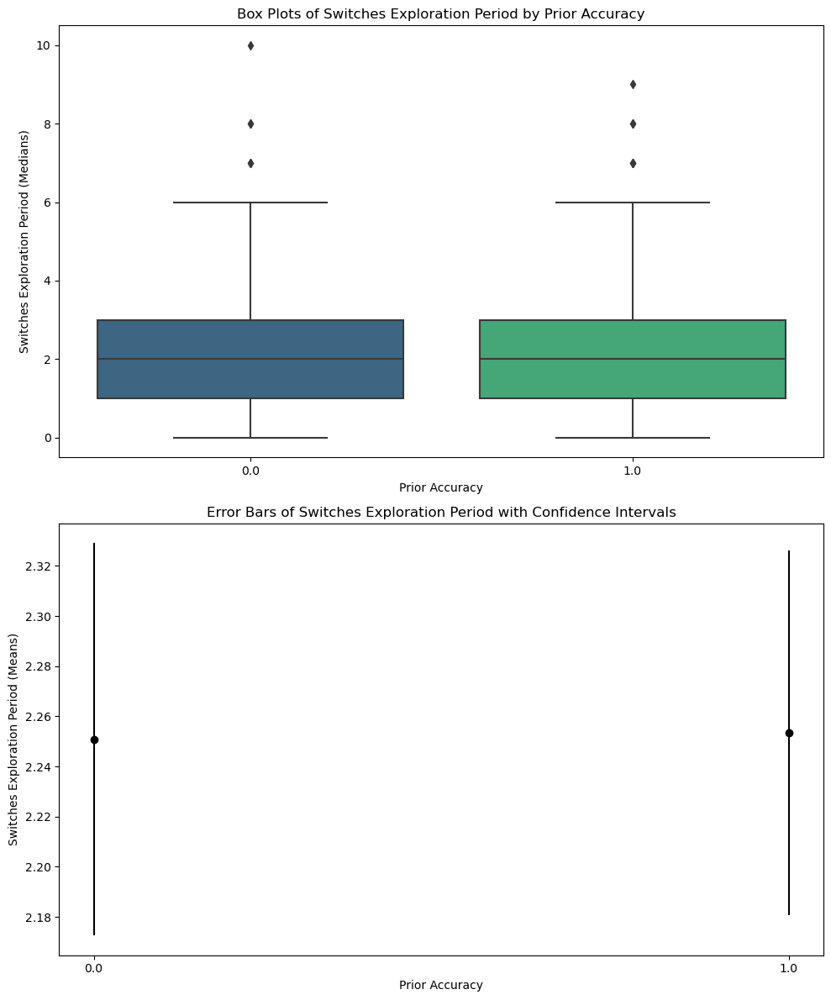

In [55]:
#Switches by prior accuracy (exploration period)

Switches_Exploration_by_prior_accuracy = [data[data['prior_accuracy'] == level]['SwitchesExplorationPeriod'] for level in data['prior_accuracy'].unique()]
Switches_Exploration_by_prior_accuracy = [group.dropna() for group in Switches_Exploration_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['SwitchesExplorationPeriod']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*Switches_Exploration_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*Switches_Exploration_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of FixNb by accuracy
mean_Switches_Exploration_by_prior_accuracy = data.groupby('prior_accuracy')['SwitchesExplorationPeriod'].mean()
median_Switches_Exploration_by_prior_accuracy = data.groupby('prior_accuracy')['SwitchesExplorationPeriod'].median()
sem_Switches_Exploration_by_prior_accuracy = data.groupby('prior_accuracy')['SwitchesExplorationPeriod'].sem()
print("Mean Switches Exploration Period by Prior Accuracy:")
print(mean_Switches_Exploration_by_prior_accuracy)
print("Median Switches Exploration Period by Prior Accuracy:")
print(median_Switches_Exploration_by_prior_accuracy)
print("SEM Switches Exploration Period by Prior Accuracy:")
print(sem_Switches_Exploration_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='SwitchesExplorationPeriod', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('Switches Exploration Period (Medians)')
ax1.set_title('Box Plots of Switches Exploration Period by Prior Accuracy')

ax2.errorbar(np.arange(len(mean_Switches_Exploration_by_prior_accuracy)), mean_Switches_Exploration_by_prior_accuracy, yerr=sem_Switches_Exploration_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Switches Exploration Period (Means)')
ax2.set_title('Error Bars of Switches Exploration Period with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_Switches_Exploration_by_prior_accuracy)))
ax2.set_xticklabels(mean_Switches_Exploration_by_prior_accuracy.index)

plt.tight_layout()
plt.show()

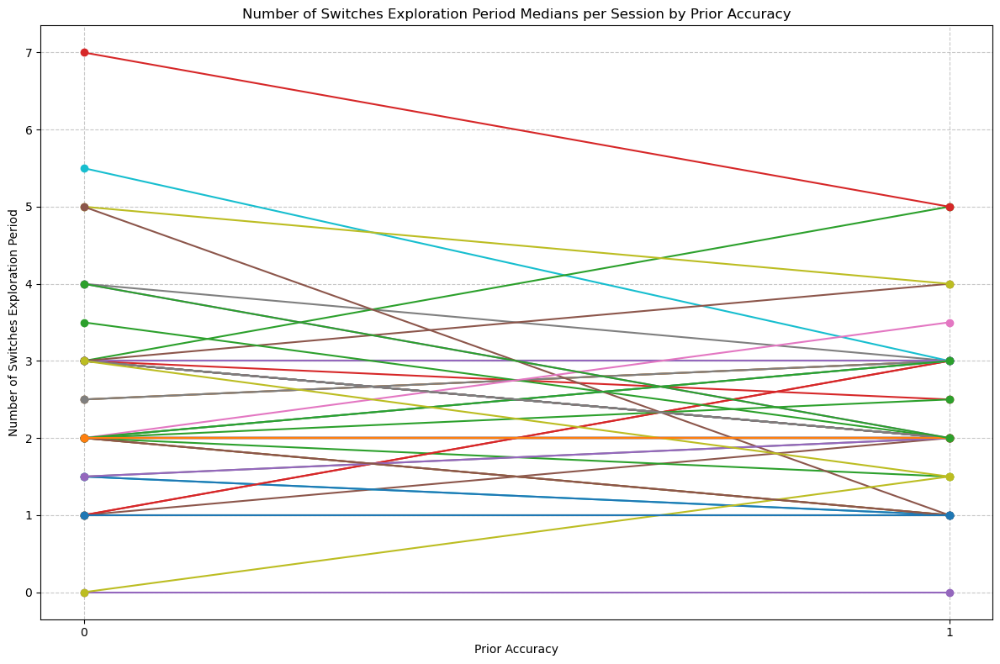

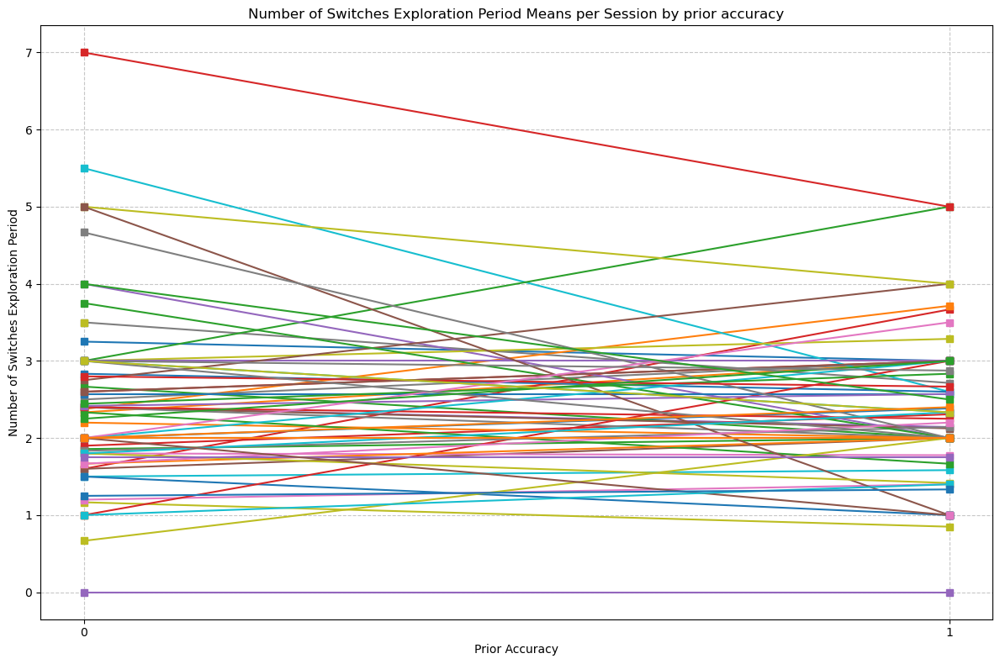

In [56]:
# Number of switches per session during Exploration Period by prior accuracy per session

#Medians
session_SwitchesExplorationPeriod = data.groupby(['session', 'prior_accuracy'])['SwitchesExplorationPeriod'].median().unstack()

sessions = data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_prior_accuracy = session_SwitchesExplorationPeriod.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        median_SwitchesExplorationPeriod_session = session_SwitchesExplorationPeriod.loc[session][available_prior_accuracy]
        plt.plot(median_SwitchesExplorationPeriod_session.index, median_SwitchesExplorationPeriod_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Number of Switches Exploration Period Medians per Session by Prior Accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('Number of Switches Exploration Period')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
#plt.legend()
plt.show()

session_SwitchesExplorationPeriod_mean = data.groupby(['session', 'prior_accuracy'])['SwitchesExplorationPeriod'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_prior_accuracy = session_SwitchesExplorationPeriod_mean.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        mean_SwitchesExplorationPeriod_session = session_SwitchesExplorationPeriod_mean.loc[session][available_prior_accuracy]
        plt.plot(mean_SwitchesExplorationPeriod_session.index, mean_SwitchesExplorationPeriod_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Number of Switches Exploration Period Means per Session by prior accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('Number of Switches Exploration Period')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
#plt.legend()
plt.tight_layout()
plt.show()

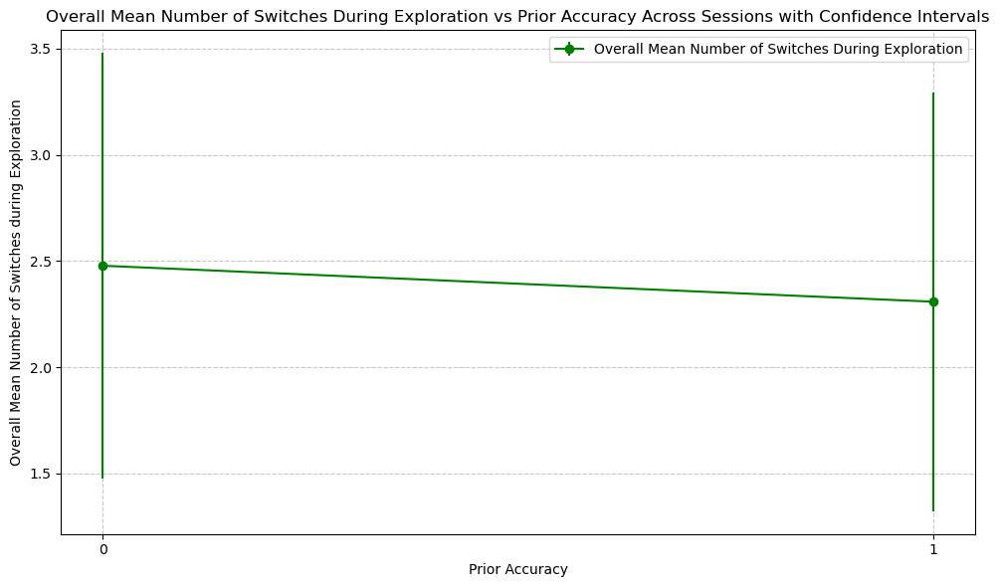

Overall Mean Number of Switches During Exploration per Prior Accuracy Across Sessions:
prior_accuracy
0.0    2.477582
1.0    2.308042
dtype: float64


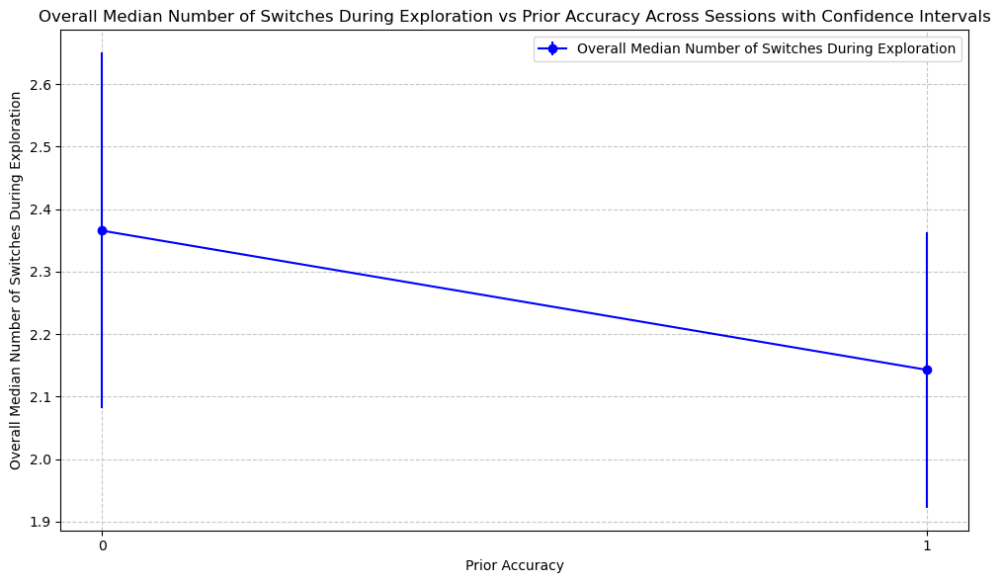


Overall Median Number of Switches During Exploration per Prior Accuracy Across Sessions:
prior_accuracy
0.0    2.365672
1.0    2.142857
dtype: float64


In [57]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_exp_NbSwitches = data.groupby(['session', 'prior_accuracy'])['SwitchesExplorationPeriod'].mean().unstack()
session_median_exp_NbSwitches = data.groupby(['session', 'prior_accuracy'])['SwitchesExplorationPeriod'].median().unstack()

overall_mean_exp_NbSwitches = session_mean_exp_NbSwitches.mean()
overall_median_exp_NbSwitches = session_median_exp_NbSwitches.mean()

session_std_exp_NbSwitches = data.groupby(['session', 'prior_accuracy'])['SwitchesExplorationPeriod'].std().unstack()
session_count_exp_NbSwitches = data.groupby(['session', 'prior_accuracy'])['SwitchesExplorationPeriod'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_exp_NbSwitches.mean() / np.sqrt(session_count_exp_NbSwitches.mean())

overall_conf_interval_median = 1.96 * session_median_exp_NbSwitches.std() / np.sqrt(session_median_exp_NbSwitches.count())

# Mean exploration NbSwitches during exploration across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_exp_NbSwitches.index, overall_mean_exp_NbSwitches.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Number of Switches During Exploration')
plt.title('Overall Mean Number of Switches During Exploration vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Mean Number of Switches during Exploration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("Overall Mean Number of Switches During Exploration per Prior Accuracy Across Sessions:")
print(overall_mean_exp_NbSwitches)

# Median NbSwitches during exploration across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_exp_NbSwitches.index, overall_median_exp_NbSwitches.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Number of Switches During Exploration')
plt.title('Overall Median Number of Switches During Exploration vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Median Number of Switches During Exploration')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("\nOverall Median Number of Switches During Exploration per Prior Accuracy Across Sessions:")
print(overall_median_exp_NbSwitches)

### Total number of Switches (both periods) vs. Prior Accuracy

Shapiro-Wilk test for 0.0: p-value = 1.1300332928798483e-15
Shapiro-Wilk test for 1.0: p-value = 7.903046782114162e-15
Levene's test for homogeneity of variances: p-value = 0.3876187323112935
Kruskal-Wallis test:
H-statistic: 0.18982539999944148
p-value: 0.6630619753011913
Mean Number of Switches by Prior Accuracy:
prior_accuracy
0.0    2.762376
1.0    2.722372
Name: NbSwitches, dtype: float64
Median Number of Switches by Prior Accuracy:
prior_accuracy
0.0    3.0
1.0    3.0
Name: NbSwitches, dtype: float64
SEM Number of Switches by Prior Accuracy:
prior_accuracy
0.0    0.086007
1.0    0.078338
Name: NbSwitches, dtype: float64


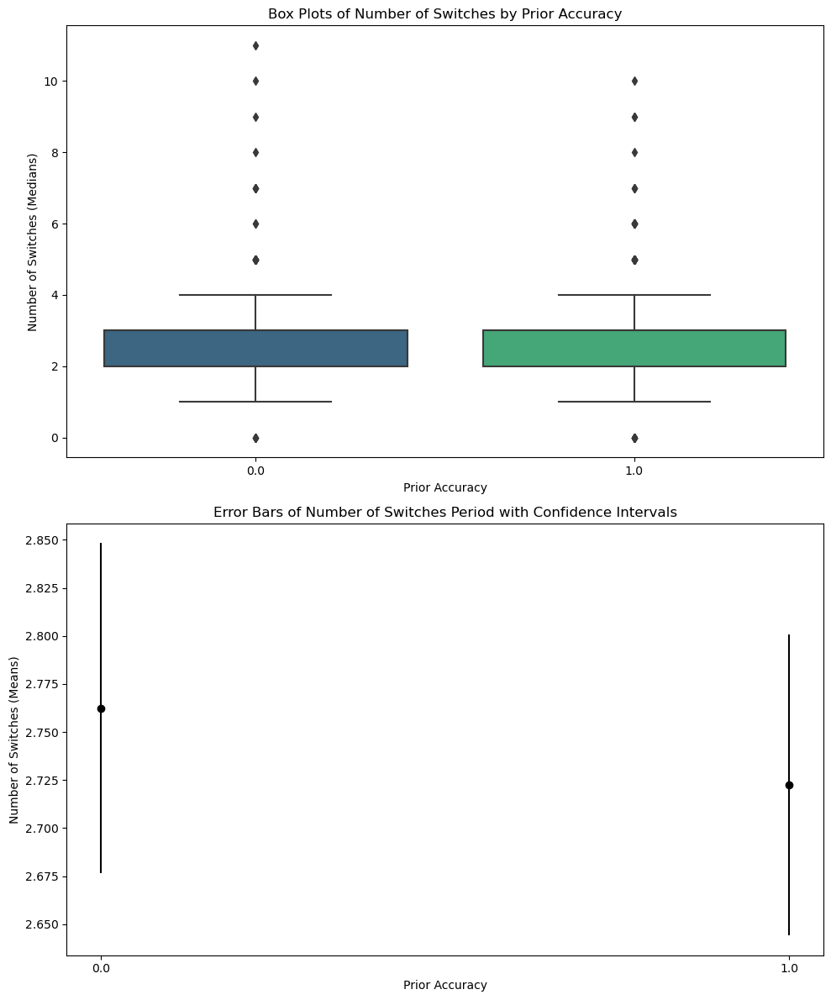

In [58]:
# Number of Switches by prior accuracy 

NbSwitches_by_prior_accuracy = [data[data['prior_accuracy'] == level]['NbSwitches'] for level in data['prior_accuracy'].unique()]
NbSwitches_by_prior_accuracy = [group.dropna() for group in NbSwitches_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['NbSwitches']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")
    
# Levene's test for homogeneity of variances
stat, p = levene(*NbSwitches_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*NbSwitches_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of NbSwitches by accuracy
mean_NbSwitches_by_prior_accuracy = data.groupby('prior_accuracy')['NbSwitches'].mean()
median_NbSwitches_by_prior_accuracy = data.groupby('prior_accuracy')['NbSwitches'].median()
sem_NbSwitches_by_prior_accuracy = data.groupby('prior_accuracy')['NbSwitches'].sem()
print("Mean Number of Switches by Prior Accuracy:")
print(mean_NbSwitches_by_prior_accuracy)
print("Median Number of Switches by Prior Accuracy:")
print(median_NbSwitches_by_prior_accuracy)
print("SEM Number of Switches by Prior Accuracy:")
print(sem_NbSwitches_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='NbSwitches', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('Number of Switches (Medians)')
ax1.set_title('Box Plots of Number of Switches by Prior Accuracy')

ax2.errorbar(np.arange(len(mean_NbSwitches_by_prior_accuracy)), mean_NbSwitches_by_prior_accuracy, yerr=sem_NbSwitches_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Number of Switches (Means)')
ax2.set_title('Error Bars of Number of Switches Period with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_NbSwitches_by_prior_accuracy)))
ax2.set_xticklabels(mean_NbSwitches_by_prior_accuracy.index)

plt.tight_layout()
plt.show()

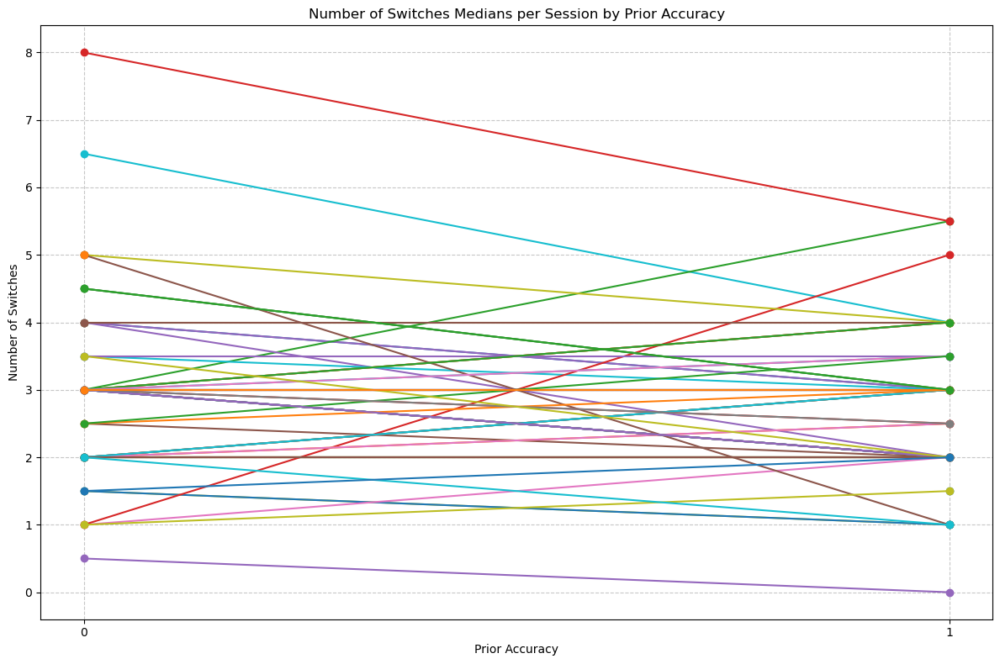

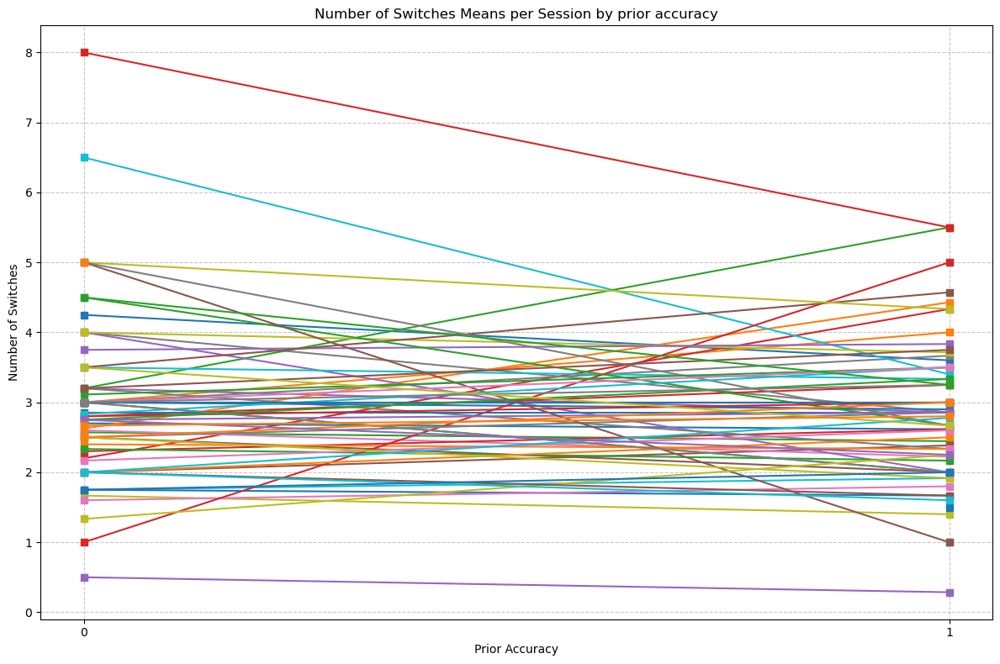

In [59]:
# Number of switches per session by prior accuracy per session

#Medians
session_NbSwitches = data.groupby(['session', 'prior_accuracy'])['NbSwitches'].median().unstack()

sessions = data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_prior_accuracy = session_NbSwitches.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        median_NbSwitches_session = session_NbSwitches.loc[session][available_prior_accuracy]
        plt.plot(median_NbSwitches_session.index, median_NbSwitches_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Number of Switches Medians per Session by Prior Accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('Number of Switches')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
#plt.legend()
plt.show()

session_NbSwitches_mean = data.groupby(['session', 'prior_accuracy'])['NbSwitches'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_prior_accuracy = session_NbSwitches_mean.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        mean_NbSwitches_session = session_NbSwitches_mean.loc[session][available_prior_accuracy]
        plt.plot(mean_NbSwitches_session.index, mean_NbSwitches_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Number of Switches Means per Session by prior accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('Number of Switches')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
#plt.legend()
plt.tight_layout()
plt.show()

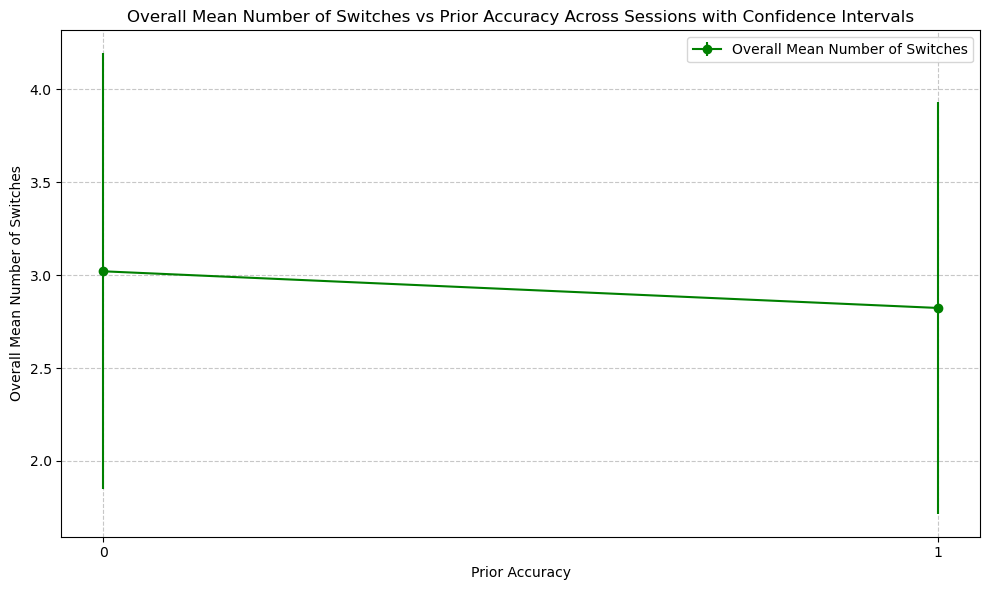

Overall Mean Number of Switches per Prior Accuracy Across Sessions:
prior_accuracy
0.0    3.020368
1.0    2.823032
dtype: float64


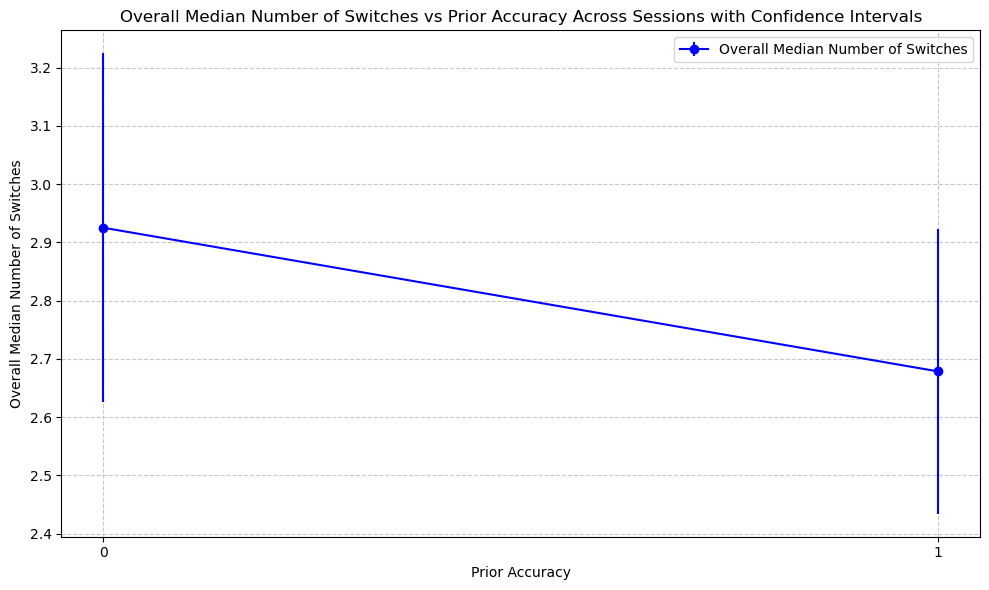


Overall Median Number of Switches per Prior Accuracy Across Sessions:
prior_accuracy
0.0    2.925373
1.0    2.678571
dtype: float64


In [60]:
# Means and medians across sessions (first session by session, then medians/ means of that)

session_mean_NbSwitches = data.groupby(['session', 'prior_accuracy'])['NbSwitches'].mean().unstack()
session_median_NbSwitches = data.groupby(['session', 'prior_accuracy'])['NbSwitches'].median().unstack()

overall_mean_NbSwitches = session_mean_NbSwitches.mean()
overall_median_NbSwitches = session_median_NbSwitches.mean()

session_std_NbSwitches = data.groupby(['session', 'prior_accuracy'])['NbSwitches'].std().unstack()
session_count_NbSwitches= data.groupby(['session', 'prior_accuracy'])['NbSwitches'].count().unstack()
overall_conf_interval_mean = 1.96 * session_std_NbSwitches.mean() / np.sqrt(session_count_NbSwitches.mean())

overall_conf_interval_median = 1.96 * session_median_NbSwitches.std() / np.sqrt(session_median_NbSwitches.count())

# Mean NbSwitches across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_mean_NbSwitches.index, overall_mean_NbSwitches.values, yerr=overall_conf_interval_mean, fmt='o', linestyle='-', color='green', label='Overall Mean Number of Switches')
plt.title('Overall Mean Number of Switches vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Mean Number of Switches')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("Overall Mean Number of Switches per Prior Accuracy Across Sessions:")
print(overall_mean_NbSwitches)

# Median NbSwitches across sessions with confidence intervals
plt.figure(figsize=(10, 6))
plt.errorbar(overall_median_NbSwitches.index, overall_median_NbSwitches.values, yerr=overall_conf_interval_median, fmt='o', linestyle='-', color='blue', label='Overall Median Number of Switches')
plt.title('Overall Median Number of Switches vs Prior Accuracy Across Sessions with Confidence Intervals')
plt.xlabel('Prior Accuracy')
plt.ylabel('Overall Median Number of Switches')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1])
plt.tight_layout()
plt.show()

print("\nOverall Median Number of Switches per Prior Accuracy Across Sessions:")
print(overall_median_NbSwitches)

### Side Chosen vs. Prior Accuracy

Shapiro-Wilk test for 0.0: p-value = 5.667295748335707e-25
Shapiro-Wilk test for 1.0: p-value = 1.4273003970678776e-27
Levene's test for homogeneity of variances: p-value = 0.40170400976817444
Kruskal-Wallis test:
H-statistic: 0.7044211893975542
p-value: 0.4013020863569883
Mean Side Chosen by Prior Accuracy:
prior_accuracy
0.0    0.455446
1.0    0.423181
Name: sideChosen, dtype: float64
Median Side Chosen by Prior Accuracy:
prior_accuracy
0.0    0.0
1.0    0.0
Name: sideChosen, dtype: float64
SEM Side Chosen by Prior Accuracy:
prior_accuracy
0.0    0.028657
1.0    0.025685
Name: sideChosen, dtype: float64


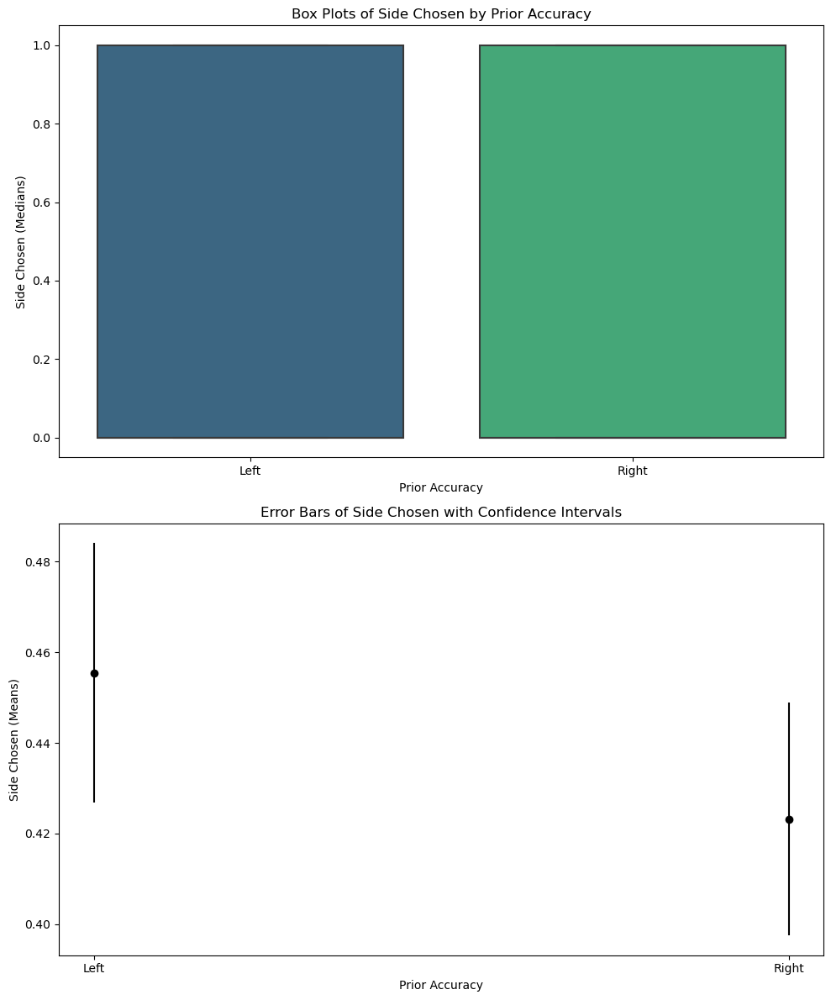

In [6]:
# Side Chosen by prior accuracy 

# Convert 'sideChosen' to numerical values (0 for left, 1 for right)
data['sideChosen'] = data['sideChosen'].map({'left': 0, 'right': 1})

# Side Chosen by prior accuracy 
sideChosen_by_prior_accuracy = [data[data['prior_accuracy'] == level]['sideChosen'] for level in data['prior_accuracy'].unique()]
sideChosen_by_prior_accuracy = [group.dropna() for group in sideChosen_by_prior_accuracy]

# Shapiro-Wilk test for normality
for group_name, group_data in data.groupby('prior_accuracy')['sideChosen']:
    stat, p = shapiro(group_data)
    print(f"Shapiro-Wilk test for {group_name}: p-value = {p}")

# Levene's test for homogeneity of variances
stat, p = levene(*sideChosen_by_prior_accuracy)
print(f"Levene's test for homogeneity of variances: p-value = {p}")

# Kruskal-Wallis test
H, p = kruskal(*sideChosen_by_prior_accuracy)
print("Kruskal-Wallis test:")
print("H-statistic:", H)
print("p-value:", p)

# Mean and SEM of NbSwitches by accuracy
mean_sideChosen_by_prior_accuracy = data.groupby('prior_accuracy')['sideChosen'].mean()
sem_sideChosen_by_prior_accuracy = data.groupby('prior_accuracy')['sideChosen'].sem()
median_sideChosen_by_prior_accuracy = data.groupby('prior_accuracy')['sideChosen'].median()
print("Mean Side Chosen by Prior Accuracy:")
print(mean_sideChosen_by_prior_accuracy)
print("Median Side Chosen by Prior Accuracy:")
print(median_sideChosen_by_prior_accuracy)
print("SEM Side Chosen by Prior Accuracy:")
print(sem_sideChosen_by_prior_accuracy)

# Plots
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(10, 12))

sns.boxplot(x='prior_accuracy', y='sideChosen', data=data, palette='viridis', ax=ax1)
ax1.set_xlabel('Prior Accuracy')
ax1.set_ylabel('Side Chosen (Medians)')
ax1.set_title('Box Plots of Side Chosen by Prior Accuracy')
ax1.set_xticklabels(['Left', 'Right'])  # Replace numerical values with labels

ax2.errorbar(np.arange(len(mean_sideChosen_by_prior_accuracy)), mean_sideChosen_by_prior_accuracy, yerr=sem_sideChosen_by_prior_accuracy, fmt='o', color='black')
ax2.set_xlabel('Prior Accuracy')
ax2.set_ylabel('Side Chosen (Means)')
ax2.set_title('Error Bars of Side Chosen with Confidence Intervals')
ax2.set_xticks(np.arange(len(mean_sideChosen_by_prior_accuracy)))
ax2.set_xticklabels(mean_sideChosen_by_prior_accuracy.index)
ax2.set_xticklabels(['Left', 'Right'])  # Replace numerical values with labels

plt.tight_layout()
plt.show()

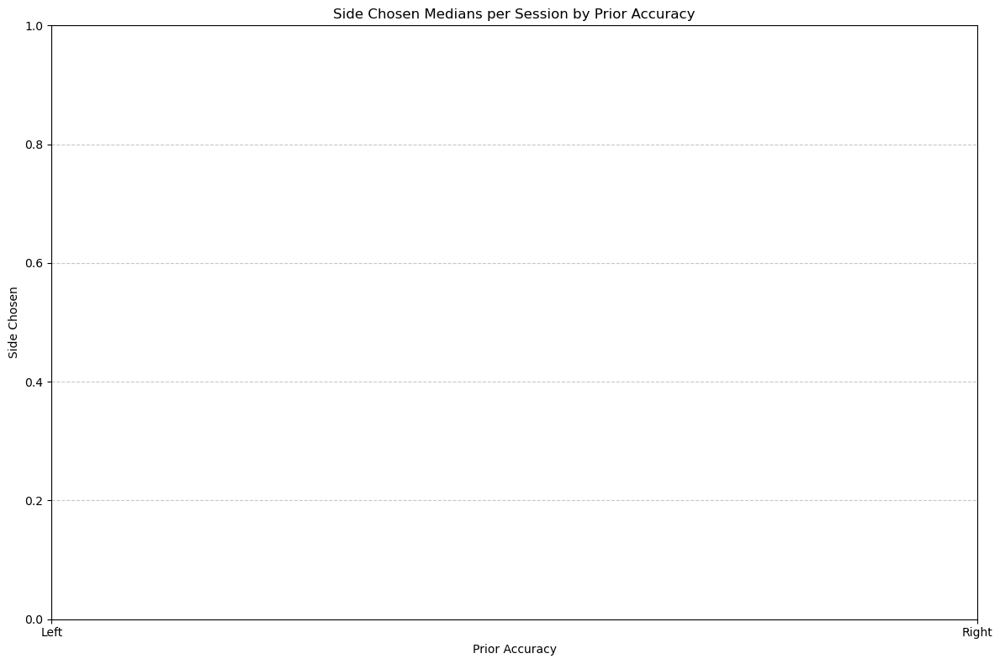

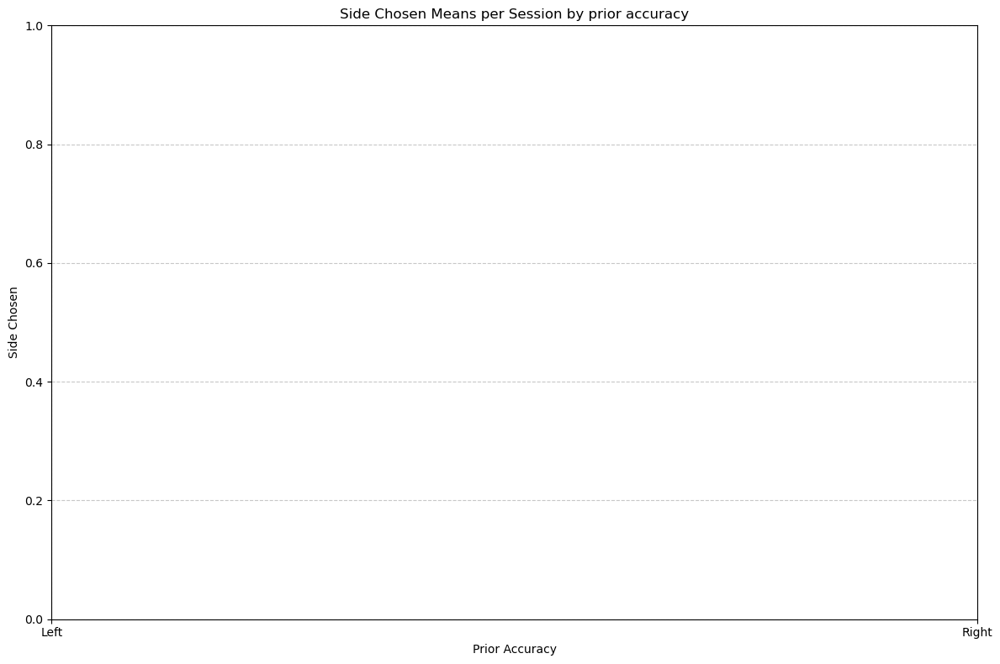

In [7]:
# Side Chosen by prior accuracy per session

data['sideChosen'] = data['sideChosen'].map({'left': 0, 'right': 1})

#Medians
session_sideChosen = data.groupby(['session', 'prior_accuracy'])['sideChosen'].median().unstack()

sessions = data['session'].unique()

plt.figure(figsize=(12, 8))

for session in sessions:
    available_prior_accuracy = session_sideChosen.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        median_sideChosen_session = session_sideChosen.loc[session][available_prior_accuracy]
        plt.plot(median_sideChosen_session.index, median_sideChosen_session, marker='o', linestyle='-', label=f'Session {session}')
        
plt.title('Side Chosen Medians per Session by Prior Accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('Side Chosen')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1], ['Left', 'Right'])
plt.tight_layout()
#plt.legend()
plt.show()

session_sideChosen_mean = data.groupby(['session', 'prior_accuracy'])['sideChosen'].mean().unstack()

# Means
plt.figure(figsize=(12, 8))
for session in sessions:
    available_prior_accuracy = session_sideChosen_mean.loc[session].dropna().index.tolist()
    if available_prior_accuracy:
        mean_sideChosen_session = session_sideChosen_mean.loc[session][available_prior_accuracy]
        plt.plot(mean_sideChosen_session.index, mean_sideChosen_session, marker='s', linestyle='-', label=f'Mean - Session {session}')

plt.title('Side Chosen Means per Session by prior accuracy')
plt.xlabel('Prior Accuracy')
plt.ylabel('Side Chosen')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks([0, 1], ['Left', 'Right'])
#plt.legend()
plt.tight_layout()
plt.show()

## Modeling 

### Accuracy vs. Prior_Accuracy

In [39]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: accuracy
# Distribution: Binomial

data['prior_accuracy'] = data['prior_accuracy'].astype('category').cat.codes
data['session'] = data['session'].astype('category').cat.codes

data['log_prior_accuracy'] = np.log(data['prior_accuracy'] + 1)  #accounting for non-linearity

formula = 'accuracy ~ log_prior_accuracy + (prior_accuracy | session)'

#LOO cross-validation
#def loo_cv(model, formula, data):
#    mae_scores = []
#    n = len(data)
#    data.reset_index(drop=True, inplace=True)  # Reset index
#    for i in range(n):
#        train_data = data.drop(index=i)
#        test_data = data.iloc[[i]]
#        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'], re_formula="~log_prior_accuracy")
#        result = model_fit.fit()
#        predicted_value = result.predict(test_data)
#        true_value = test_data['accuracy'].values[0]
#        mae_scores.append(np.abs(predicted_value - true_value))
#    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=data, groups=data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data)

predicted_values = result.predict()

observed_values = data['accuracy']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

               Mixed Linear Model Regression Results
Model:                MixedLM     Dependent Variable:     accuracy 
No. Observations:     954         Method:                 REML     
No. Groups:           73          Scale:                  0.2493   
Min. group size:      2           Log-Likelihood:         -701.4487
Max. group size:      40          Converged:              Yes      
Mean group size:      13.1                                         
-------------------------------------------------------------------
                         Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------
Intercept                 0.557    0.039 14.357 0.000  0.481  0.633
log_prior_accuracy       -0.024    0.036 -0.662 0.508 -0.094  0.047
prior_accuracy | session -0.000    0.001 -0.177 0.859 -0.002  0.001
Group Var                 0.000    0.005                           

Mean Absolute Error (MAE): 0.497061041468953
Mean Squared Erro

### Trial Duration vs. Prior_Accuracy

In [145]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durPeriodTotal
# Distribution: Weibull 

data['prior_accuracy'] = data['prior_accuracy'].astype('category').cat.codes
data['session'] = data['session'].astype('category').cat.codes

#data['transformed_durPeriodTotal'] = np.log(data['durPeriodTotal'] + 0.001) 

qt = QuantileTransformer(output_distribution='normal') 
data['transformed_durPeriodTotal'] = qt.fit_transform(data['durPeriodTotal'].values.reshape(-1, 1)) # Transform trial duration to fit a Weibull distribution

scaler = MinMaxScaler(feature_range=(0, 1))
data['scaled_transformed_durPeriodTotal'] = scaler.fit_transform(data[['transformed_durPeriodTotal']])

formula = 'scaled_transformed_durPeriodTotal ~ np.power(prior_accuracy, 2) + (prior_accuracy | session)' #random slope and random intercept

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_durPeriodTotal'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)
    
mixed_model = sm.MixedLM.from_formula(formula, data=data, groups=data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data)

predicted_values = result.predict()

observed_values = data['scaled_transformed_durPeriodTotal']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                     Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_durPeriodTotal
No. Observations: 674     Method:             REML                             
No. Groups:       73      Scale:              0.0077                           
Min. group size:  1       Log-Likelihood:     629.8096                         
Max. group size:  32      Converged:          Yes                              
Mean group size:  9.2                                                          
--------------------------------------------------------------------------------
                                 Coef.   Std.Err.    z     P>|z|  [0.025  0.975]
--------------------------------------------------------------------------------
Intercept                         0.523     0.013  39.827  0.000   0.497   0.548
np.power(prior_accuracy, 2)      -0.010     0.007  -1.487  0.137  -0.024   0.003
prior_accuracy | session         -0.000     0.000  -0.44

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\sklearn\preprocessing\_data.py:2627: UserWarning: n_quantiles (1000) is greater than the total number of samples (674). n_quantiles is set to n_samples.
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


### Exploration Period Duration vs. Prior Accuracy

In [146]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durExplorationPeriod
# Distribution: beta

data['prior_accuracy'] = data['prior_accuracy'].astype('category').cat.codes
data['session'] = data['session'].astype('category').cat.codes

data['log_prior_accuracy'] = np.log(data['prior_accuracy'] + 1)

scaler = MinMaxScaler(feature_range=(0, 1))
data['scaled_durExplorationPeriod'] = scaler.fit_transform(data[['durExplorationPeriod']]) #scaling durExplorationPeriod 

formula = 'scaled_durExplorationPeriod ~ np.power(prior_accuracy, 2) + (prior_accuracy | session)' #non-linear trend #random intercept and random slope

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_durExplorationPeriod'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(
    formula, 
    data=data, 
    groups=data['session']
)
result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data)

predicted_values = result.predict()

observed_values = data['scaled_durExplorationPeriod']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                  Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_durExplorationPeriod
No. Observations: 674     Method:             REML                       
No. Groups:       73      Scale:              0.0469                     
Min. group size:  1       Log-Likelihood:     24.8883                    
Max. group size:  32      Converged:          Yes                        
Mean group size:  9.2                                                    
-------------------------------------------------------------------------
                               Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------------
Intercept                       0.230    0.032  7.229 0.000  0.167  0.292
np.power(prior_accuracy, 2)    -0.014    0.017 -0.832 0.405 -0.048  0.019
prior_accuracy | session        0.000    0.001  0.287 0.774 -0.001  0.002
Group Var                       0.011    0.015          

In [106]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durExplorationPeriod
# Distribution: beta

from scipy.stats import beta

# Define the inverse link function to map [0, 1] to the support of the beta distribution
def inverse_link_func(x):
    return beta.ppf(x, a=0.37299298680936094, b=1.4669428725242202) 

data['prior_accuracy'] = data['prior_accuracy'].astype('category').cat.codes
data['session'] = data['session'].astype('category').cat.codes

data['log_prior_accuracy'] = np.log(data['prior_accuracy'] + 1)

scaler = MinMaxScaler(feature_range=(0, 1))
data['scaled_durExplorationPeriod'] = scaler.fit_transform(data[['durExplorationPeriod']]) #scaling durExplorationPeriod 

data['proportion_durExplorationPeriod'] = inverse_link_func(data['scaled_durExplorationPeriod'] / data['scaled_durExplorationPeriod'].max())

formula = 'proportion_durExplorationPeriod ~ log_prior_accuracy + (prior_accuracy | session)'

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['proportion_durExplorationPeriod'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(
    formula, 
    data=data, 
    groups=data['session']
)
result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data)

predicted_values = result.predict()

observed_values = data['proportion_durExplorationPeriod']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with cg
  warnings.warn(


                    Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: proportion_durExplorationPeriod
No. Observations: 674     Method:             REML                           
No. Groups:       52      Scale:              0.0183                         
Min. group size:  4       Log-Likelihood:     368.7971                       
Max. group size:  44      Converged:          No                             
Mean group size:  13.0                                                       
-------------------------------------------------------------------------------
                           Coef.    Std.Err.     z      P>|z|   [0.025   0.975]
-------------------------------------------------------------------------------
Intercept                   0.052      0.014    3.817   0.000    0.025    0.079
log_prior_accuracy         -0.013      0.015   -0.822   0.411   -0.042    0.017
prior_accuracy | session    0.000      0.000    0.522   0.602   -0.001    

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2207: ConvergenceWarning: MixedLM optimization failed, trying a different optimizer may help.
  warnings.warn(msg, ConvergenceWarning)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2219: ConvergenceWarning: Gradient optimization failed, |grad| = 7.167960
  warnings.warn(msg, ConvergenceWarning)
C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


In [99]:
data['proportion_durExplorationPeriod'] = data['scaled_durExplorationPeriod'] / data['scaled_durExplorationPeriod'].max()

# Compute mean and variance of the proportion_durExplorationPeriod
mean_proportion = data['proportion_durExplorationPeriod'].mean()
var_proportion = data['proportion_durExplorationPeriod'].var()

# Choose values for a and b based on mean and variance
a = mean_proportion * (mean_proportion * (1 - mean_proportion) / var_proportion - 1)
b = (1 - mean_proportion) * (mean_proportion * (1 - mean_proportion) / var_proportion - 1)

print(a)
print(b)

0.37299298680936094
1.4669428725242202


### Decision Period Duration vs. Prior_Accuracy 

In [126]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durDecisionPeriod
# Distribution: Log-normal

data['log_durDecisionPeriod'] = np.log(data['durDecisionPeriod'])
data['prior_accuracy'] = data['prior_accuracy'].astype('category').cat.codes
data['session'] = data['session'].astype('category').cat.codes

scaler = StandardScaler() 
data[['log_durDecisionPeriod']] = scaler.fit_transform(data[['log_durDecisionPeriod']]) # Decision period duration follows a log-normal distribution

data['log_prior_accuracy'] = np.log(data['prior_accuracy'] + 1)

formula = 'log_durDecisionPeriod ~ log_prior_accuracy + (prior_accuracy | session)' #Random intercept and random slope 

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['log_durDecisionPeriod'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = smf.mixedlm(formula, data, groups=data['session'])
result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data)

predicted_values = result.predict()

observed_values = data['log_durDecisionPeriod']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

               Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: log_durDecisionPeriod
No. Observations: 674     Method:             REML                 
No. Groups:       73      Scale:              0.8333               
Min. group size:  1       Log-Likelihood:     -937.3288            
Max. group size:  32      Converged:          Yes                  
Mean group size:  9.2                                              
-------------------------------------------------------------------
                         Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-------------------------------------------------------------------
Intercept                 0.238    0.129  1.842 0.065 -0.015  0.491
log_prior_accuracy       -0.172    0.105 -1.644 0.100 -0.377  0.033
prior_accuracy | session -0.003    0.003 -0.959 0.338 -0.009  0.003
Group Var                 0.179    0.059                           

Mean Absolute Error (MAE): 0.8024455229538766
Mean Squared Err

### Look duration of bottom images (exploration period) vs. Prior_Accuracy

In [133]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durLookBottomExploration
# Distribution: gamma

data['prior_accuracy'] = data['prior_accuracy'].astype('category').cat.codes
data['session'] = data['session'].astype('category').cat.codes

data['transformed_durLookBottomExploration'] = np.log(data['durLookBottomExploration'] + 0.001) # Transform durLookBottomExploration to fit a Gamma distribution

scaler = MinMaxScaler(feature_range=(0, 1))
data['scaled_transformed_durLookBottomExploration'] = scaler.fit_transform(data[['transformed_durLookBottomExploration']])

formula = 'scaled_transformed_durLookBottomExploration ~ np.power(prior_accuracy, 2) + (prior_accuracy | session)' # accounting for non-linearity #random slope and random intercept

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_durLookBottomExploration'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=data, groups=data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data)

predicted_values = result.predict()

observed_values = data['scaled_transformed_durLookBottomExploration']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_durLookBottomExploration
No. Observations: 674     Method:             REML                                       
No. Groups:       73      Scale:              0.0204                                     
Min. group size:  1       Log-Likelihood:     283.2073                                   
Max. group size:  32      Converged:          Yes                                        
Mean group size:  9.2                                                                    
--------------------------------------------------------------------------------------------
                                   Coef.     Std.Err.      z       P>|z|    [0.025    0.975]
--------------------------------------------------------------------------------------------
Intercept                           0.857       0.029    30.009    0.000     0.801     0.912
np.power(prior_accuracy,

### Look Duration of Top card (decision period) vs. Prior_Accuracy

In [142]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: LookDurInTDecision
# Distribution: Weibull 

data['prior_accuracy'] = data['prior_accuracy'].astype('category').cat.codes
data['session'] =data['session'].astype('category').cat.codes

data['transformed_LookDurInTDecision'] = np.log(data['LookDurInTDecision'] + 0.001) # Transform LookDurInTDecision to fit a Weibull distribution


scaler = MinMaxScaler(feature_range=(0, 1))
data['scaled_transformed_LookDurInTDecision'] = scaler.fit_transform(data[['transformed_LookDurInTDecision']])

formula = 'scaled_transformed_LookDurInTDecision ~ np.power(prior_accuracy, 2) + (prior_accuracy | session)' # accounting for non-linearity #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=data, groups=data['session'])

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_LookDurInTDecision'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=data, groups=data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data)

predicted_values = result.predict()

observed_values = data['scaled_transformed_LookDurInTDecision']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                       Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_LookDurInTDecision
No. Observations: 674     Method:             REML                                 
No. Groups:       73      Scale:              0.0424                               
Min. group size:  1       Log-Likelihood:     84.2646                              
Max. group size:  32      Converged:          Yes                                  
Mean group size:  9.2                                                              
-------------------------------------------------------------------------------------
                                 Coef.    Std.Err.     z      P>|z|   [0.025   0.975]
-------------------------------------------------------------------------------------
Intercept                         0.849      0.021   41.124   0.000    0.809    0.890
np.power(prior_accuracy, 2)      -0.002      0.016   -0.113   0.910   -0.033    0.030
prior

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


### Fixation Duration of bottom cards (exploration period) vs. Prior accuracy

In [151]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durLookBottomExploration
# Distribution: gamma

data['prior_accuracy'] = data['prior_accuracy'].astype('category').cat.codes
data['session'] = data['session'].astype('category').cat.codes

data['transformed_durfixBottomExploration'] = np.log(data['durfixBottomExploration'] + 0.001) # Transform durfixBottomExploration to fit a Gamma distribution

scaler = MinMaxScaler(feature_range=(0, 1))
data['scaled_transformed_durfixBottomExploration'] = scaler.fit_transform(data[['transformed_durfixBottomExploration']])

formula = 'scaled_transformed_durfixBottomExploration ~ np.power(prior_accuracy, 2) + (prior_accuracy | session)' # Quadratic term for difficulty (non-linearity) #random slope and random intercept

mixed_model = sm.MixedLM.from_formula(formula, data=data, groups=data['session'])

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_durfixBottomExploration'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=data, groups=data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data)

predicted_values = result.predict()

observed_values = data['scaled_transformed_durfixBottomExploration']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_durfixBottomExploration
No. Observations: 674     Method:             REML                                      
No. Groups:       73      Scale:              0.0200                                    
Min. group size:  1       Log-Likelihood:     288.1255                                  
Max. group size:  32      Converged:          Yes                                       
Mean group size:  9.2                                                                   
-------------------------------------------------------------------------------------------
                                  Coef.     Std.Err.      z       P>|z|    [0.025    0.975]
-------------------------------------------------------------------------------------------
Intercept                          0.856       0.029    29.825    0.000     0.800     0.912
np.power(prior_accuracy, 2)       -

### Fixation duration of Top Card (Decision Period) vs. Prior accuracy

In [152]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: FixDurInTDecision
# Distribution: Weibull 

data['prior_accuracy'] = data['prior_accuracy'].astype('category').cat.codes
data['session'] = data['session'].astype('category').cat.codes

data['transformed_FixDurInTDecision'] = np.log(data['FixDurInTDecision'] + 0.001) # Transform FixDurInTDecision to fit a Weibull distribution

scaler = MinMaxScaler(feature_range=(0, 1))
data['scaled_transformed_FixDurInTDecision'] = scaler.fit_transform(data[['transformed_FixDurInTDecision']])

formula = 'scaled_transformed_FixDurInTDecision ~ np.power(prior_accuracy, 0.5) + (prior_accuracy | session)' # Square root for difficulty (non-linearity) #random slope and random intercept

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_FixDurInTDecision'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=data, groups=data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data)

predicted_values = result.predict()

observed_values = data['scaled_transformed_FixDurInTDecision']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                      Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_FixDurInTDecision
No. Observations: 674     Method:             REML                                
No. Groups:       73      Scale:              0.0424                              
Min. group size:  1       Log-Likelihood:     83.9732                             
Max. group size:  32      Converged:          Yes                                 
Mean group size:  9.2                                                             
------------------------------------------------------------------------------------
                                Coef.    Std.Err.     z      P>|z|   [0.025   0.975]
------------------------------------------------------------------------------------
Intercept                        0.849      0.021   40.985   0.000    0.809    0.890
np.power(prior_accuracy, 0.5)   -0.001      0.016   -0.073   0.942   -0.033    0.030
prior_accuracy | 

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


### Total number of fixations vs. Prior accuracy

In [155]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: durExplorationPeriod
# Distribution: beta

data['prior_accuracy'] = data['prior_accuracy'].astype('category').cat.codes
data['session'] = data['session'].astype('category').cat.codes

scaler = MinMaxScaler(feature_range=(0, 1))
data['scaled_FixNb'] = scaler.fit_transform(data[['FixNb']]) #transforming FixNb to fit into (0, 1) range (gamma distribution is followed)

formula = 'scaled_FixNb ~ np.power(prior_accuracy, 0.5) + (prior_accuracy | session)' #accounting for non-linear trend here  # random intercept and slope 

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_FixNb'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(
    formula, 
    data=data, 
    groups=data['session'], 
)
result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data)

predicted_values = result.predict()

observed_values = data['scaled_FixNb']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                 Mixed Linear Model Regression Results
Model:                  MixedLM     Dependent Variable:     scaled_FixNb
No. Observations:       674         Method:                 REML        
No. Groups:             73          Scale:                  0.0161      
Min. group size:        1           Log-Likelihood:         370.6897    
Max. group size:        32          Converged:              Yes         
Mean group size:        9.2                                             
------------------------------------------------------------------------
                              Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------------
Intercept                      0.262    0.023 11.607 0.000  0.218  0.306
np.power(prior_accuracy, 0.5) -0.006    0.010 -0.597 0.551 -0.026  0.014
prior_accuracy | session      -0.000    0.001 -0.361 0.718 -0.001  0.001
Group Var                      0.007    0.016                        

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


### Number of fixations of bottom cards during exploration vs. Prior accuracy

In [156]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: FixNbInBottomExploration
# Distribution: Weibull 

data['prior_accuracy'] = data['prior_accuracy'].astype('category').cat.codes
data['session'] = data['session'].astype('category').cat.codes

data['transformed_FixNbInBottomExploration'] = np.log(data['FixNbInBottomExploration'] + 0.001) # Transform FixNbInBottomExploration to fit a Weibull distribution

scaler = MinMaxScaler(feature_range=(0, 1))
data['scaled_transformed_FixNbInBottomExploration'] = scaler.fit_transform(data[['transformed_FixNbInBottomExploration']]) #transforming FixNb to fit into (0, 1) range (gamma distribution is followed)

formula = 'scaled_transformed_FixNbInBottomExploration ~ np.power(prior_accuracy, 2) + (prior_accuracy | session)' # Accounting for non linear trend #random slope and random intercept

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_FixNbInBottomExploration'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=data, groups=data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data)

predicted_values = result.predict()

observed_values = data['scaled_transformed_FixNbInBottomExploration']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_FixNbInBottomExploration
No. Observations: 674     Method:             REML                                       
No. Groups:       73      Scale:              0.0192                                     
Min. group size:  1       Log-Likelihood:     301.8091                                   
Max. group size:  32      Converged:          Yes                                        
Mean group size:  9.2                                                                    
--------------------------------------------------------------------------------------------
                                   Coef.     Std.Err.      z       P>|z|    [0.025    0.975]
--------------------------------------------------------------------------------------------
Intercept                           0.797       0.028    28.374    0.000     0.742     0.852
np.power(prior_accuracy,

### Number of fixations of top card during decision period vs. prior accuracy

In [161]:
# Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: FixNbTD
# Distribution: gamma

data['prior_accuracy'] = data['prior_accuracy'].astype('category').cat.codes
data['session'] = data['session'].astype('category').cat.codes

data['transformed_FixNbTD'] = np.log(data['FixNbInTDecision'] + 0.001) # Transform FixNbTD to fit a Gamma distribution

scaler = MinMaxScaler(feature_range=(0, 1))
data['scaled_transformed_FixNbTD'] = scaler.fit_transform(data[['transformed_FixNbTD']]) #transforming FixNb to fit into (0, 1) range (gamma distribution is followed)

formula = 'scaled_transformed_FixNbTD ~ np.power(prior_accuracy, 2) + (prior_accuracy | session)' # Square root for difficulty (non-linearity) #random slope and random intercept

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_FixNbTD'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=data, groups=data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data)

predicted_values = result.predict()

observed_values = data['scaled_transformed_FixNbTD']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                 Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_FixNbTD
No. Observations: 674     Method:             REML                      
No. Groups:       73      Scale:              0.0389                    
Min. group size:  1       Log-Likelihood:     114.1099                  
Max. group size:  32      Converged:          Yes                       
Mean group size:  9.2                                                   
------------------------------------------------------------------------
                              Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------------
Intercept                      0.766    0.019 39.499 0.000  0.728  0.804
np.power(prior_accuracy, 2)    0.001    0.015  0.091 0.928 -0.029  0.032
prior_accuracy | session      -0.001    0.000 -1.524 0.128 -0.002  0.000
Group Var                      0.002    0.005                        

C:\Users\I587504\AppData\Local\anaconda3\Lib\site-packages\statsmodels\regression\mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


### Number of Switches during Exploration vs. Prior accuracy

In [162]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: SwitchesExplorationPeriod
# Distribution: gamma

data['prior_accuracy'] = data['prior_accuracy'].astype('category').cat.codes
data['session'] = data['session'].astype('category').cat.codes

data['transformed_SwitchesExplorationPeriod'] = np.log(data['SwitchesExplorationPeriod'] + 0.001) # Transform SwitchesExplorationPeriod to fit a Gamma distribution

scaler = MinMaxScaler(feature_range=(0, 1))
data['scaled_transformed_SwitchesExplorationPeriod'] = scaler.fit_transform(data[['transformed_SwitchesExplorationPeriod']]) #transforming FixNb to fit into (0, 1) range (gamma distribution is followed)

formula = 'scaled_transformed_SwitchesExplorationPeriod ~ np.power(prior_accuracy, 2) + (prior_accuracy | session)' # Accounting for non linear trend #random slope and random intercept

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['scaled_transformed_SwitchesExplorationPeriod'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=data, groups=data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data)

predicted_values = result.predict()

observed_values = data['scaled_transformed_SwitchesExplorationPeriod']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: scaled_transformed_SwitchesExplorationPeriod
No. Observations: 674     Method:             REML                                        
No. Groups:       73      Scale:              0.0193                                      
Min. group size:  1       Log-Likelihood:     296.8359                                    
Max. group size:  32      Converged:          Yes                                         
Mean group size:  9.2                                                                     
----------------------------------------------------------------------------------------------
                                Coef.      Std.Err.       z        P>|z|     [0.025     0.975]
----------------------------------------------------------------------------------------------
Intercept                        0.793        0.030     26.827     0.000      0.735      0.851
np.power(p

### Side chosen vs. prior accuracy

In [163]:
#Mixed effects model: HIERARCHICAL 
# Method: REML
# Variable: sideChosen
# Distribution: Binomial

data['prior_accuracy'] = data['prior_accuracy'].astype('category').cat.codes
data['session'] = data['session'].astype('category').cat.codes
data['sideChosen'] = data['sideChosen'].astype('category')

data['sideChosenNumeric'] = data['sideChosen'].cat.codes

data['log_prior_accuracy'] = np.log(data['prior_accuracy'] + 1)  #accounting for non-linearity

formula = 'sideChosenNumeric ~  np.power(prior_accuracy, 2) + (prior_accuracy | session)'  # random intercept and slope

#LOO cross-validation
def loo_cv(model, formula, data):
    mae_scores = []
    n = len(data)
    data.reset_index(drop=True, inplace=True)  # Reset index
    for i in range(n):
        train_data = data.drop(index=i)
        test_data = data.iloc[[i]]
        model_fit = sm.MixedLM.from_formula(formula, data=train_data, groups=train_data['session'])
        result = model_fit.fit()
        predicted_value = result.predict(test_data)
        true_value = test_data['sideChosenNumeric'].values[0]
        mae_scores.append(np.abs(predicted_value - true_value))
    return np.mean(mae_scores)

mixed_model = sm.MixedLM.from_formula(formula, data=data, groups=data['session'])

result = mixed_model.fit()

#loo_mae = loo_cv(mixed_model, formula, data)

predicted_values = result.predict()

observed_values = data['sideChosenNumeric']

# Mean Absolute Error (MAE)
mae = mean_absolute_error(observed_values, predicted_values)

# Mean Squared Error (MSE)
mse = mean_squared_error(observed_values, predicted_values)

print(result.summary())
#print("LOO Cross-Validation MAE:", loo_mae)
print("Mean Absolute Error (MAE):", mae)
print("Mean Squared Error (MSE):", mse)

                Mixed Linear Model Regression Results
Model:               MixedLM   Dependent Variable:   sideChosenNumeric
No. Observations:    674       Method:               REML             
No. Groups:          73        Scale:                0.2139           
Min. group size:     1         Log-Likelihood:       -477.5364        
Max. group size:     32        Converged:            Yes              
Mean group size:     9.2                                              
----------------------------------------------------------------------
                            Coef.  Std.Err.   z    P>|z| [0.025 0.975]
----------------------------------------------------------------------
Intercept                    0.428    0.061  6.959 0.000  0.307  0.548
np.power(prior_accuracy, 2) -0.036    0.037 -0.991 0.322 -0.108  0.036
prior_accuracy | session     0.001    0.001  0.643 0.520 -0.002  0.004
Group Var                    0.038    0.026                           

Mean Absolute Error (M

## Change for each variable

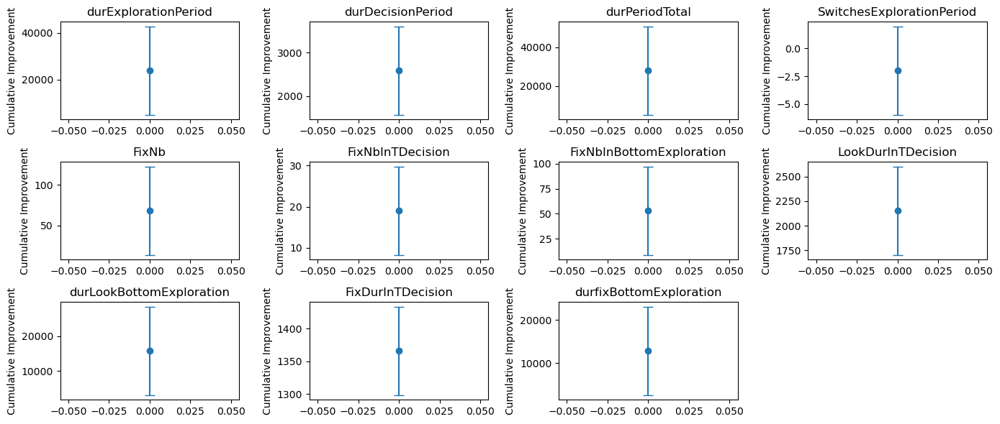

Variable: durExplorationPeriod
  Cumulative Median Change = 23880.0, Cumulative Mean Change = 22614.554657057917

Variable: durDecisionPeriod
  Cumulative Median Change = 2586.0, Cumulative Mean Change = -744.4149980454329

Variable: durPeriodTotal
  Cumulative Median Change = 27988.0, Cumulative Mean Change = 21870.139659012482

Variable: SwitchesExplorationPeriod
  Cumulative Median Change = -2.0, Cumulative Mean Change = -1.1485962407158048

Variable: FixNb
  Cumulative Median Change = 68.0, Cumulative Mean Change = 71.79767500012066

Variable: FixNbInTDecision
  Cumulative Median Change = 19.0, Cumulative Mean Change = 11.86326306543698

Variable: FixNbInBottomExploration
  Cumulative Median Change = 53.0, Cumulative Mean Change = 62.96560350881003

Variable: LookDurInTDecision
  Cumulative Median Change = 2152.0, Cumulative Mean Change = -966.5741716013459

Variable: durLookBottomExploration
  Cumulative Median Change = 15773.0, Cumulative Mean Change = 24431.598813806966

Variabl

In [14]:
#Check if babies tend to improve or not (cumulative change per variable)

variables = [
    'durExplorationPeriod',
    'durDecisionPeriod',
    'durPeriodTotal',
    'SwitchesExplorationPeriod',
    'FixNb',
    'FixNbInTDecision', 
    'FixNbInBottomExploration',
    'LookDurInTDecision', 
    'durLookBottomExploration', 
    'FixDurInTDecision', 
    'durfixBottomExploration'
]

change_medians = []
change_means = []

confidence_level = 0.95

# Calculate cumulative changes
cumulative_change_medians = []
cumulative_change_means = []

# Plots
plt.figure(figsize=(14, 6))

for i, variable in enumerate(variables, start=1):
    data[f'{variable}_diff'] = data.groupby('session')[variable].diff()
    first_trials = data.groupby('session')['trialno'].transform('min')
    data.loc[data['trialno'] == first_trials, f'{variable}_diff'] = pd.NA
    data.loc[(data['trialno'].shift(1) != data['trialno'] - 1) & (data['trialno'] != first_trials), f'{variable}_diff'] = pd.NA

    median_diff = data.groupby('session')[f'{variable}_diff'].median()
    mean_diff = data.groupby('session')[f'{variable}_diff'].mean()

    change_median = np.median(median_diff)
    change_mean = np.mean(mean_diff)
    
    change_medians.append(change_median)
    change_means.append(change_mean)

    # Calculate cumulative change
    cumulative_change_median = median_diff.sum()
    cumulative_change_mean = mean_diff.sum()
    
    cumulative_change_medians.append(cumulative_change_median)
    cumulative_change_means.append(cumulative_change_mean)

    ci = np.percentile(median_diff, [100 * (1 - confidence_level) / 2, 100 * (1 + confidence_level) / 2])

    plt.subplot(3, 4, i)
    plt.errorbar(x=[0], y=[cumulative_change_median],
                 yerr=np.abs([ci[1] - cumulative_change_median]),  # Ensure non-negative error bars
                 fmt='o', capsize=5)
    plt.title(variable)
    plt.ylabel('Cumulative Improvement')

plt.tight_layout()
plt.show()

# Mean and median cumulative improvement
for variable, median_cumulative, mean_cumulative in zip(variables, cumulative_change_medians, cumulative_change_means):
    print(f'Variable: {variable}')
    print(f'  Cumulative Median Change = {median_cumulative}, Cumulative Mean Change = {mean_cumulative}')
    print()

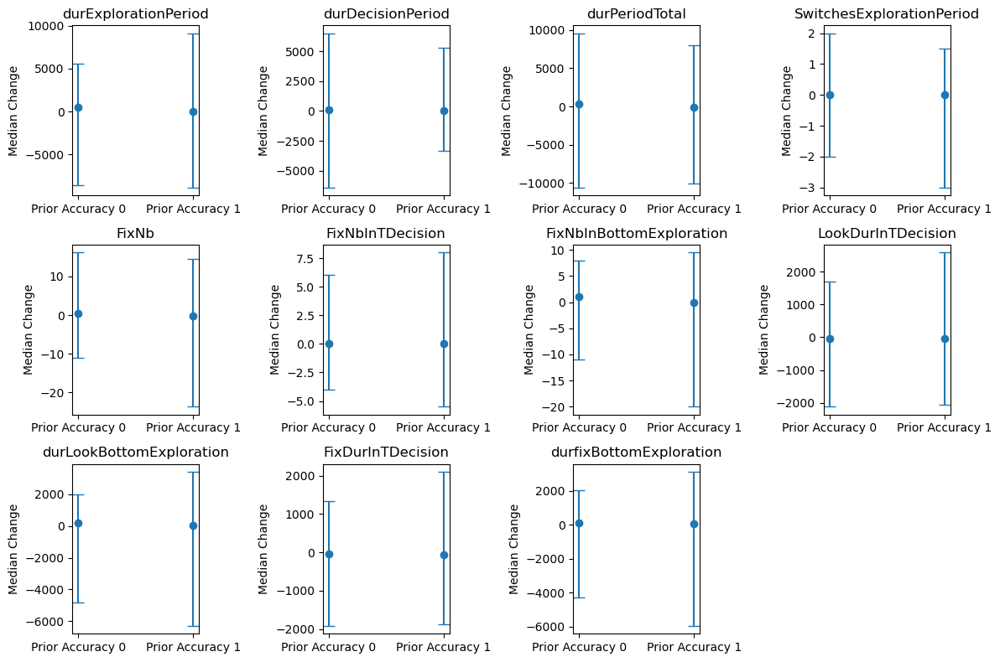

Variable: durExplorationPeriod
  Prior Accuracy = 0: Median Change = 480.0, Mean Change = 530.0427149964465
  Prior Accuracy = 1: Median Change = 0.0, Mean Change = 260.3270146520146

Variable: durDecisionPeriod
  Prior Accuracy = 0: Median Change = 92.0, Mean Change = 17.815446576640603
  Prior Accuracy = 1: Median Change = 0.0, Mean Change = -199.41091487877205

Variable: durPeriodTotal
  Prior Accuracy = 0: Median Change = 394.0, Mean Change = 547.8581615730869
  Prior Accuracy = 1: Median Change = -49.5, Mean Change = 60.91609977324264

Variable: SwitchesExplorationPeriod
  Prior Accuracy = 0: Median Change = 0.0, Mean Change = 0.08158611703387826
  Prior Accuracy = 1: Median Change = 0.0, Mean Change = 0.009798970870399442

Variable: FixNb
  Prior Accuracy = 0: Median Change = 0.5, Mean Change = 0.9853056147832268
  Prior Accuracy = 1: Median Change = -0.25, Mean Change = 0.5996201814058955

Variable: FixNbInTDecision
  Prior Accuracy = 0: Median Change = 0.0, Mean Change = -0.009

In [15]:
# Check if babies tend to change for each variable depending on prior accuracy 

variables = [
    'durExplorationPeriod',
    'durDecisionPeriod',
    'durPeriodTotal',
    'SwitchesExplorationPeriod',
    'FixNb',
    'FixNbInTDecision', 
    'FixNbInBottomExploration',
    'LookDurInTDecision', 
    'durLookBottomExploration', 
    'FixDurInTDecision', 
    'durfixBottomExploration'
]

change_0_medians = []
change_1_medians = []
change_0_means = []
change_1_means = []

confidence_level = 0.95

def custom_percentile(data, confidence_level):
    data_sorted = np.sort(data.dropna())
    n = len(data_sorted)
    lower_index = int((1 - confidence_level) / 2 * n)
    upper_index = int((1 + confidence_level) / 2 * n)
    return data_sorted[lower_index], np.median(data_sorted), data_sorted[upper_index]

plt.figure(figsize=(12, 8))
for i, variable in enumerate(variables, start=1):
    
    data_reset = data.reset_index(drop=True)
    data_reset[f'{variable}_diff'] = data_reset.groupby('session')[variable].diff()
    data_reset.loc[data_reset['trialno'].diff() != 1, f'{variable}_diff'] = np.nan
    data_filtered = data_reset.dropna(subset=[f'{variable}_diff'])
    
    data_0 = data_filtered[data_filtered['prior_accuracy'] == 0]
    data_1 = data_filtered[data_filtered['prior_accuracy'] == 1]
   
    median_diff_0 = data_0.groupby('session')[f'{variable}_diff'].median()
    mean_diff_0 = data_0.groupby('session')[f'{variable}_diff'].mean()
    median_diff_1 = data_1.groupby('session')[f'{variable}_diff'].median()
    mean_diff_1 = data_1.groupby('session')[f'{variable}_diff'].mean()

    change_0_median = np.nanmedian(median_diff_0)
    change_1_median = np.nanmedian(median_diff_1)
    change_0_mean = np.nanmean(mean_diff_0)
    change_1_mean = np.nanmean(mean_diff_1)

    change_0_medians.append(change_0_median)
    change_1_medians.append(change_1_median)
    change_0_means.append(change_0_mean)
    change_1_means.append(change_1_mean)

    _, p_value = kruskal(median_diff_0.dropna(), median_diff_1.dropna())

    ci_0 = custom_percentile(median_diff_0, confidence_level)
    ci_1 = custom_percentile(median_diff_1, confidence_level)

    plt.subplot(3, 4, i)
    plt.errorbar(x=[0, 1], y=[change_0_median, change_1_median],
                 yerr=[[change_0_median - ci_0[0], ci_0[2] - change_0_median],
                       [change_1_median - ci_1[0], ci_1[2] - change_1_median]],
                 fmt='o', capsize=5)
    plt.title(variable)
    plt.xticks([0, 1], ['Prior Accuracy 0', 'Prior Accuracy 1'])
    plt.ylabel('Median Change')

plt.tight_layout()
plt.show()

for variable, median_0, median_1, mean_0, mean_1 in zip(variables, change_0_medians, change_1_medians, change_0_means, change_1_means):
    print(f'Variable: {variable}')
    print(f'  Prior Accuracy = 0: Median Change = {median_0}, Mean Change = {mean_0}')
    print(f'  Prior Accuracy = 1: Median Change = {median_1}, Mean Change = {mean_1}')
    print()


In [13]:
# Dataset with difference among variables trial by trial

variables = [
    'durExplorationPeriod',
    'durDecisionPeriod',
    'durPeriodTotal',
    'SwitchesExplorationPeriod',
    'FixNb',
    'FixNbInTDecision', 
    'FixNbInBottomExploration',
    'LookDurInTDecision', 
    'durLookBottomExploration', 
    'FixDurInTDecision', 
    'durfixBottomExploration'
]

for variable in variables:
    # Calculate the change between consecutive trials
    data[f'{variable}_change'] = (data.groupby('session')[variable]
                                      .diff()
                                    )
    
    # Identify the first trial for each session
    first_trials = data.groupby('session')['trialno'].transform('min')
    
    # Set change to NaN for the first trial of each session
    data.loc[data['trialno'] == first_trials, f'{variable}_change'] = pd.NA

    # Set change to NaN for trials that don't have a directly preceding trial
    data.loc[(data['trialno'].shift(1) != data['trialno'] - 1) & (data['trialno'] != first_trials), f'{variable}_change'] = pd.NA

pd.set_option('display.max_rows', None)
data

,session,trialno,difficulty,accuracy,sideChosen,durPeriodTotal,durExplorationPeriod,durDecisionPeriod,NbSwitches,SwitchesExplorationPeriod,...,durDecisionPeriod_change,durPeriodTotal_change,SwitchesExplorationPeriod_change,FixNb_change,FixNbInTDecision_change,FixNbInBottomExploration_change,LookDurInTDecision_change,durLookBottomExploration_change,FixDurInTDecision_change,durfixBottomExploration_change
0,curE002a,8,Easy,0.0,left,12194,11270.0,924.0,6,6.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,curE002a,9,Easy,1.0,left,4680,2498.0,2182.0,2,2.0,...,1258.0,-7514.0,-4.0,-12.0,2.0,-13.0,1346.0,-3810.0,1168.0,-3484.0
2,curE002a,10,Easy,1.0,right,12826,9912.0,2914.0,4,3.0,...,732.0,8146.0,1.0,7.0,0.0,3.0,-718.0,988.0,-668.0,1078.0
3,curE002a,11,Medium,1.0,right,3910,2328.0,1582.0,3,2.0,...,-1332.0,-8916.0,-1.0,-7.0,0.0,-5.0,-96.0,-1664.0,-152.0,-1586.0
4,curE002a,12,Medium,0.0,left,15256,14272.0,984.0,6,5.0,...,-598.0,11346.0,3.0,16.0,-2.0,18.0,-424.0,6560.0,-240.0,6088.0
5,curE002a,13,Medium,1.0,left,15846,13628.0,2218.0,7,6.0,...,1234.0,590.0,1.0,1.0,4.0,-5.0,942.0,-886.0,732.0,-830.0
6,curE002a,14,Medium,0.0,left,6926,5326.0,1600.0,3,3.0,...,-618.0,-8920.0,-3.0,-14.0,-3.0,-7.0,-294.0,-3504.0,-144.0,-3268.0
7,curE002a,19,Medium,0.0,left,7128,5928.0,1200.0,2,2.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,curE002a,20,Medium,0.0,right,9080,3648.0,5432.0,4,3.0,...,4232.0,1952.0,1.0,13.0,6.0,5.0,3126.0,1012.0,2738.0,922.0
9,curE002a,21,Easy,1.0,left,7046,3532.0,3514.0,4,2.0,...,-1918.0,-2034.0,-1.0,-10.0,-7.0,-5.0,-3542.0,-1706.0,-3052.0,-1552.0
